# Liquid Hydrocarbon Analysis

## Data Preprocessing

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

pd.set_option('display.max_columns', None)

In [2]:
directory = "../datasets/nuprc_prod_data/"

In [3]:
pd.read_excel(directory + "oil/2024.xlsx", skiprows=2)  

,TERMINAL/STREAM,Liquid Type,2024-01-31 00:00:00,2024-02-29 00:00:00,2024-03-31 00:00:00,2024-04-30 00:00:00,2024-05-31 00:00:00,2024-06-30 00:00:00,2024-07-31 00:00:00,2024-08-31 00:00:00,2024-09-30 00:00:00,2024-10-31 00:00:00,2024-11-30 00:00:00,2024-12-31 00:00:00
0,BONNY,Crude Oil,6.351778e+06,4.604102e+06,4.260566e+06,4.158173e+06,3.605864e+06,4.536573e+06,4.584388e+06,4.894497e+06,5.589773e+06,5.765964e+06,7.051541e+06,7.274190e+06
1,NaN,Condensate,5.874950e+05,5.834900e+05,6.270570e+05,5.432140e+05,6.400263e+05,5.684745e+05,5.646100e+05,5.847060e+05,5.110210e+05,4.949150e+05,5.013290e+05,5.095696e+05
2,NaN,Blend Total,6.939273e+06,5.187592e+06,4.887623e+06,4.701387e+06,4.245890e+06,5.105047e+06,5.148998e+06,5.479203e+06,6.100794e+06,6.260879e+06,7.552870e+06,7.783759e+06
3,BRASS,Crude Oil,7.356800e+05,6.171890e+05,6.861880e+05,6.470530e+05,6.359290e+05,6.488490e+05,6.643870e+05,7.181040e+05,8.429000e+05,8.503520e+05,7.754900e+05,9.055440e+05
4,NaN,Condensate,1.609010e+05,1.354980e+05,1.585290e+05,1.407240e+05,1.531670e+05,1.446770e+05,1.489610e+05,1.616330e+05,2.019790e+05,2.014510e+05,1.791480e+05,1.804170e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,Daily Average of Liquid (Bopd),Crude Oil,1.426574e+06,1.322208e+06,1.230518e+06,1.281478e+06,1.251494e+06,1.276159e+06,1.306657e+06,1.351689e+06,1.324293e+06,1.333322e+06,1.485656e+06,1.484585e+06
59,NaN,Blended Condensate,5.817726e+04,5.534548e+04,6.411294e+04,5.575323e+04,6.097927e+04,5.884188e+04,5.714345e+04,5.529971e+04,5.777403e+04,4.413439e+04,4.648307e+04,4.927577e+04
60,NaN,Unblended Condensate,1.589200e+05,1.620557e+05,1.434983e+05,1.102043e+05,1.560974e+05,1.651975e+05,1.698978e+05,1.636929e+05,1.622227e+05,1.606723e+05,1.583454e+05,1.336987e+05


In [4]:
# Read the all Excel data file into a DataFrame
all_dfs = []
# Loop through each file in the directory
for file in os.listdir(directory + "oil"):
    # Construct the full file path
    file_path = os.path.join(directory + "oil", file)
    
    # Check if it's an Excel file
    if file.endswith('.xlsx') or file.endswith('.xls'):
        # Read the Excel file, skipping the first 2 rows
        all_df = pd.read_excel(file_path, skiprows=2)

        # Drop TOTAL column if it exist
        if 'TOTAL' in all_df.columns:
            all_df.drop(columns=['TOTAL'], inplace=True)
        all_df.loc[:, 'Liquid Type'] = all_df['Liquid Type'].str.strip()
        all_df.loc[:, 'TERMINAL/STREAM'] = all_df['TERMINAL/STREAM'].str.strip()
        
        
        
        # Find the first row where all values are NaN
        na_rows = all_df[all_df.isna().all(axis=1)].index
        first_na_row = na_rows[0]
        sec_na_row = na_rows[1]
        
        # split all_df into parts
        main_all_df = all_df.loc[:first_na_row - 1]
        total_all_df = all_df.loc[first_na_row + 1:sec_na_row-1]
        
        main_all_df.loc[:, "TERMINAL/STREAM"] = main_all_df["TERMINAL/STREAM"].ffill()
        total_all_df = total_all_df.drop(columns="TERMINAL/STREAM").set_index("Liquid Type")
        
        # Perform intergrity check
        temp_all_df = main_all_df.query("`Liquid Type` != 'Blend Total'")
        # Check 1 -- Compare the sum of crude in main_all_df to total_all_df
        test_1 = (temp_all_df.groupby("Liquid Type").sum()
         .loc['Crude Oil'][1:]
         .apply(lambda x: f"{x:.5f}") == 
         total_all_df.loc['Crude Oil'].apply(lambda x: f"{x:.5f}")).all()
        
        # Check 2 -- Compare the total liquid in main_all_df to total_all_df
        test_2 = (temp_all_df.sum()[2:].apply(lambda x: f"{x:.5f}") == total_all_df.loc['Total'].apply(lambda x: f"{x:.5f}")).all()
        
        if all([test_1, test_2]):
            print(f"{file} passed intergrity test")
            # Melt all_df -- Convert from wide to long format
            main_all_df = main_all_df.melt(id_vars=['TERMINAL/STREAM', 'Liquid Type'], var_name='Date', value_name='Production')
            all_dfs.append(main_all_df)
        elif not test_1 and not test_2:
            print(f"{file} failed both test")
            break
        elif not test_1:
            print(f"{file} failed test_1")
            break
        elif not test_2:
            print(f"{file} failed test_1")
            break
        

# Concatenate all all_dfs
all_df = pd.concat(all_dfs)

2023.xlsx passed intergrity test
2020.xlsx passed intergrity test
2024.xlsx passed intergrity test
2021.xlsx passed intergrity test
2022.xlsx passed intergrity test


In [5]:
all_df['TERMINAL/STREAM'].unique()

array(['BONNY', 'BRASS', 'QUA IBOE', 'FORCADOS',
       'ESCRAVOS (Oil Terminal)', 'ODUDU (AMENAM BLEND)',
       'TULJA - OKWUIBOME', 'AJE', 'OKORO (Ex Ima Terminal)',
       'ASARAMATORU (Ex Ima Terminal)', 'OTAKPIPO (Ex Ima Terminal)',
       'ANTAN', 'OKONO', 'YOHO', 'OKWORI', 'EBOK', 'AJAPA (Atala Oil)',
       'ANAMBRA BASIN', 'BONGA', 'ERHA', 'USAN', 'EGINA', 'OYO', 'ABO',
       'PENNINGTON', 'UKPOKITI', 'UGO OCHA (JONES CREEK)',
       'SEA EAGLE (EA)', 'ANYALA MADU (CJ Blend)', 'NEMBE', 'AGBAMI',
       'AKPO', 'IMA', 'AJAPA', 'UTAPATE'], dtype=object)

In [6]:
# Change the terminal name AJAPA (Atala Oil) to simply AJAPA
all_df.loc[all_df['TERMINAL/STREAM'] == 'AJAPA (Atala Oil)', 'TERMINAL/STREAM'] = 'AJAPA'

In [7]:
all_df

,TERMINAL/STREAM,Liquid Type,Date,Production
0,BONNY,Crude Oil,2023-01-31 00:00:00,1435274.1
1,BONNY,Condensate,2023-01-31 00:00:00,677622.0
2,BONNY,Blend Total,2023-01-31 00:00:00,2112896.1
3,BRASS,Crude Oil,2023-01-31 00:00:00,571401.0
4,BRASS,Condensate,2023-01-31 00:00:00,194198.0
...,...,...,...,...
595,AGBAMI,Condensate,2022-12-31 00:00:00,1205948.0
596,AKPO,Condensate,2022-12-31 00:00:00,2476504.0
597,IMA,Condensate,2022-12-31 00:00:00,0.0
598,AJAPA,Condensate,2022-12-31 00:00:00,20979.0


In [8]:
# Get all terminals with blended streams
cond = all_df.loc[:, "Liquid Type"] == "Blend Total"
blend_streams = all_df.loc[cond, "TERMINAL/STREAM"].unique()

# Drop "TULJA - OKWUIBOME" from blended streams (Its Condensates are not treated as blended )
blend_streams = blend_streams[blend_streams != "TULJA - OKWUIBOME"]  
blend_streams

array(['BONNY', 'BRASS', 'QUA IBOE', 'FORCADOS',
       'ESCRAVOS (Oil Terminal)', 'ODUDU (AMENAM BLEND)', 'AJE'],
      dtype=object)

Some terminals handle both **crude oil and condensate**, while others handle **only condensate**. To differentiate these, condensate from blended terminals (those handling both crude and condensate) is renamed **"blend_condensate"**. This ensures a clear distinction between **pure condensate terminals** and **blended terminals** in the dataset.  

In [9]:
# Rename condensate of bleneded terminals
all_df.loc[(all_df["TERMINAL/STREAM"].isin(blend_streams)) & (all_df["Liquid Type"] == "Condensate"), "Liquid Type"] = 'blend_condensate' 
all_df

,TERMINAL/STREAM,Liquid Type,Date,Production
0,BONNY,Crude Oil,2023-01-31 00:00:00,1435274.1
1,BONNY,blend_condensate,2023-01-31 00:00:00,677622.0
2,BONNY,Blend Total,2023-01-31 00:00:00,2112896.1
3,BRASS,Crude Oil,2023-01-31 00:00:00,571401.0
4,BRASS,blend_condensate,2023-01-31 00:00:00,194198.0
...,...,...,...,...
595,AGBAMI,Condensate,2022-12-31 00:00:00,1205948.0
596,AKPO,Condensate,2022-12-31 00:00:00,2476504.0
597,IMA,Condensate,2022-12-31 00:00:00,0.0
598,AJAPA,Condensate,2022-12-31 00:00:00,20979.0


Rows where 'Blend Total' appears will be removed, as it represents the combined sum of crude oil and condensate for terminals that produce both. This prevents double-counting in the dataset.

In [10]:
all_df = all_df.query("`Liquid Type` != 'Blend Total'")
all_df = all_df.sort_values(by='Date')
all_df

,TERMINAL/STREAM,Liquid Type,Date,Production
36,USAN,Crude Oil,2020-01-31 00:00:00,1.754518e+06
6,QUA IBOE,Crude Oil,2020-01-31 00:00:00,7.000067e+06
4,BRASS,blend_condensate,2020-01-31 00:00:00,3.654684e+05
3,BRASS,Crude Oil,2020-01-31 00:00:00,2.396537e+06
1,BONNY,blend_condensate,2020-01-31 00:00:00,1.488380e+06
...,...,...,...,...
615,SEA EAGLE (EA),Crude Oil,2024-12-31 00:00:00,5.292760e+05
614,UGO OCHA (JONES CREEK),Crude Oil,2024-12-31 00:00:00,5.481010e+05
613,UKPOKITI,Crude Oil,2024-12-31 00:00:00,0.000000e+00
611,ABO,Crude Oil,2024-12-31 00:00:00,3.723780e+05


In [11]:
# Total Production for January, 2020
specific_time = pd.Timestamp('2020-01-31 00:00:00')
all_df.loc[all_df['Date'] == specific_time, 'Production'].sum()

65946317.64431281

In [12]:
# Total Production for January, 2023
specific_time = pd.Timestamp('2023-01-31 00:00:00')
all_df.loc[all_df['Date'] == specific_time, 'Production'].sum()

46867296.36997278

In [13]:
all_df['Date'] = all_df['Date'].apply(pd.Timestamp)

In [14]:
all_df_2 = all_df.copy()

In [15]:
import calendar

# Extract year and month for further analysis
all_df_2['Year'] = all_df_2['Date'].dt.year
all_df_2['Month'] = all_df_2['Date'].dt.month
all_df_2['Month_name'] = all_df_2['Date'].dt.month_name()

# Function to get the number of days in a given month of a given year
def get_days_in_month(year, month):
    return calendar.monthrange(year, month)[1]

# Apply the function to each row
all_df_2['month_days'] = all_df_2.apply(lambda row: get_days_in_month(row['Year'], row['Month']), axis=1)
all_df_2.head()

,TERMINAL/STREAM,Liquid Type,Date,Production,Year,Month,Month_name,month_days
36,USAN,Crude Oil,2020-01-31,1.754518e+06,2020,1,January,31
6,QUA IBOE,Crude Oil,2020-01-31,7.000067e+06,2020,1,January,31
4,BRASS,blend_condensate,2020-01-31,3.654684e+05,2020,1,January,31
3,BRASS,Crude Oil,2020-01-31,2.396537e+06,2020,1,January,31
1,BONNY,blend_condensate,2020-01-31,1.488380e+06,2020,1,January,31


## Overall Analysis

In [16]:
df = all_df_2.copy()

In [17]:
# Total Hydrocarbon Liquid produced YTD
df["Production"].sum()

2868591612.63925

In [18]:
df.groupby('Date')["Production"].sum()

Date
2020-01-31    6.594632e+07
2020-02-29    6.244923e+07
2020-03-31    6.588431e+07
2020-04-30    6.298106e+07
2020-05-31    5.534821e+07
2020-06-30    5.174592e+07
2020-07-31    5.274622e+07
2020-08-31    5.282701e+07
2020-09-30    5.006886e+07
2020-10-31    5.237246e+07
2020-11-30    5.109725e+07
2020-12-31    4.738779e+07
2021-01-31    5.305547e+07
2021-02-28    4.930616e+07
2021-03-31    5.420269e+07
2021-04-30    5.061132e+07
2021-05-31    5.143808e+07
2021-06-30    4.918210e+07
2021-07-31    5.082961e+07
2021-08-31    4.743652e+07
2021-09-30    4.598968e+07
2021-10-31    4.728316e+07
2021-11-30    4.625702e+07
2021-12-31    4.560751e+07
2022-01-31    5.197603e+07
2022-02-28    4.265962e+07
2022-03-31    4.633090e+07
2022-04-30    4.446859e+07
2022-05-31    3.965042e+07
2022-06-30    4.209990e+07
2022-07-31    4.073630e+07
2022-08-31    3.656520e+07
2022-09-30    3.411648e+07
2022-10-31    3.814152e+07
2022-11-30    4.242280e+07
2022-12-31    4.382256e+07
2023-01-31    4.686730e

In [19]:
# Total Hydrocarbon Liquid produced by year
df.groupby("Year")["Production"].sum()

Year
2020    6.708546e+08
2021    5.911993e+08
2022    5.029903e+08
2023    5.367529e+08
2024    5.667945e+08
Name: Production, dtype: float64

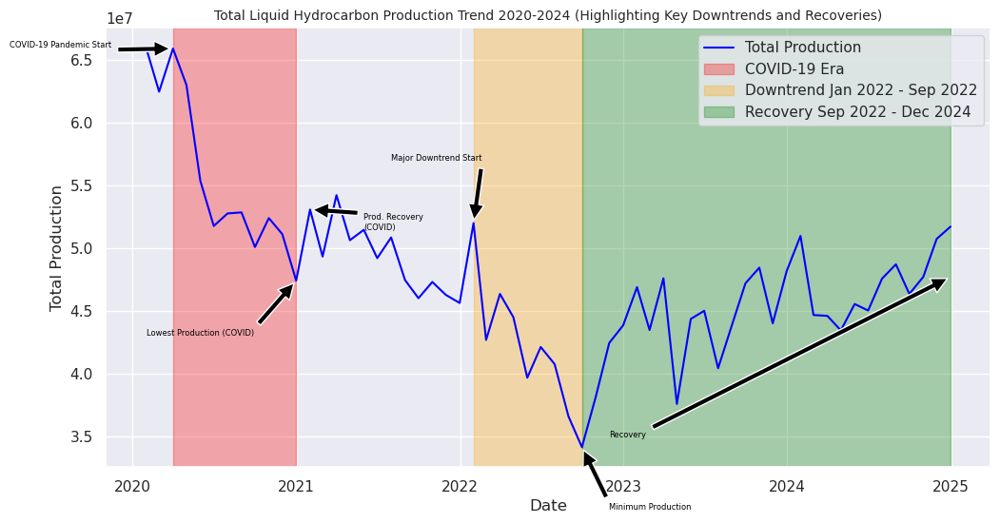

In [20]:
# Group by date and sum production
total_production = df.groupby('Date')['Production'].sum()

# Plot the total production trend
plt.figure(figsize=(12, 6))
plt.plot(total_production.index, total_production.values, label='Total Production', color='blue')

# Highlight the COVID-19 era (March 2020 to December 2020)
plt.axvspan(pd.to_datetime('2020-03-31'), pd.to_datetime('2020-12-31'), color='red', alpha=0.3, label='COVID-19 Era')

# Highlight the downtrend and recovery (January 2023 to Dec 2024)
plt.axvspan(pd.to_datetime('2022-01-31'), pd.to_datetime('2022-09-30'), color='orange', alpha=0.3, label='Downtrend Jan 2022 - Sep 2022')
plt.axvspan(pd.to_datetime('2022-09-30'), pd.to_datetime('2024-12-31'), color='green', alpha=0.3, label='Recovery Sep 2022 - Dec 2024')

# Adding annotations to highlight key points
plt.annotate('COVID-19 Pandemic Start', xy=(pd.to_datetime('2020-03-31'), total_production.loc['2020-03-31']), 
             xytext=(pd.to_datetime('2019-04-01'), total_production.max()), 
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=6, color='black')

plt.annotate('Lowest Production (COVID)', xy=(pd.to_datetime('2020-12-31'), total_production.loc['2020-12-31']), 
             xytext=(pd.to_datetime('2020-01-31'), 43000000), 
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=6, color='black')

plt.annotate('Prod. Recovery\n(COVID)', xy=(pd.to_datetime('2021-01-31'), total_production.loc['2021-01-31']), 
             xytext=(pd.to_datetime('2021-05-31'), total_production.loc['2021-05-31']), 
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=6, color='black')

plt.annotate('Major Downtrend Start', xy=(pd.to_datetime('2022-01-31'), total_production.loc['2022-01-31']), 
             xytext=(pd.to_datetime('2021-07-31'), total_production.loc['2022-01-31'] + 5000000), 
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=6, color='black')

plt.annotate('Minimum Production', xy=(pd.to_datetime('2022-09-30'), total_production.loc['2022-09-30']), 
             xytext=(pd.to_datetime('2022-11-30'), total_production.loc['2022-09-30'] - 5000000), 
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=6, color='black')

plt.annotate('Recovery', xy=(pd.to_datetime('2024-12-31'), total_production.loc['2024-10-31']), 
             xytext=(pd.to_datetime('2022-11-30'), total_production.loc['2022-11-30'] - 7500000), 
             arrowprops=dict(facecolor='black', shrink=0.01),
             fontsize=6, color='black')

# Title and labels
plt.title('Total Liquid Hydrocarbon Production Trend 2020-2024 (Highlighting Key Downtrends and Recoveries)', fontsize=10)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Total Production', fontsize=12)
plt.legend(loc='upper right')
plt.grid(True)

# Display the plot
plt.show()


In [21]:
min_date = df.groupby('Date')["Production"].sum().idxmin()
print(f'Date of Overall Minimum production  {min_date}')
min = df.groupby('Date')["Production"].sum().min()
print(f'Overall Minimum production {min:.0f}')

Date of Overall Minimum production  2022-09-30 00:00:00
Overall Minimum production 34116484


In [22]:
max_date = df.groupby('Date')["Production"].sum().idxmax()
print(f'Date of Overall Maximum production {max_date}')
max = df.groupby('Date')["Production"].sum().max()
print(f'Overall Maximum production {max:.0f}')

Date of Overall Maximum production 2020-01-31 00:00:00
Overall Maximum production 65946318


In [23]:
# Minimum production month for each Year
df.groupby(['Year', 'Month_name'])["Production"].sum().groupby(['Year']).idxmin()

Year
2020     (2020, December)
2021     (2021, December)
2022    (2022, September)
2023        (2023, April)
2024        (2024, April)
Name: Production, dtype: object

In [24]:
# Minimum production for each year
df.groupby(['Year', 'Month_name'])["Production"].sum().groupby(['Year']).min()

Year
2020    4.738779e+07
2021    4.560751e+07
2022    3.411648e+07
2023    3.756342e+07
2024    4.342305e+07
Name: Production, dtype: float64

In [25]:
# Maximum production month for each Year
df.groupby(['Year', 'Month_name'])["Production"].sum().groupby(['Year']).idxmax()

Year
2020     (2020, January)
2021       (2021, March)
2022     (2022, January)
2023     (2023, October)
2024    (2024, December)
Name: Production, dtype: object

In [26]:
# Maximum production for each year
df.groupby(['Year', 'Month_name'])["Production"].sum().groupby(['Year']).max()

Year
2020    6.594632e+07
2021    5.420269e+07
2022    5.197603e+07
2023    4.842425e+07
2024    5.169436e+07
Name: Production, dtype: float64

In [27]:
# Determine the number of days in each year to be used for calculating the daily average.
days = df.groupby(['Year', 'Month_name' ])['month_days'].mean().groupby('Year').sum()
days.name = 'Days in Year'
days

Year
2020    366.0
2021    365.0
2022    365.0
2023    365.0
2024    366.0
Name: Days in Year, dtype: float64

In [28]:
# Daily avg for each month
daily_avg = df.groupby(['Year','Month', 'Date'])["Production"].sum()/df.groupby(['Year','Month'])['month_days'].mean().values
daily_avg = daily_avg.reset_index().set_index('Date')

In [29]:
daily_avg.head()

,Year,Month,Production
Date,,,
2020-01-31,2020,1,2.127301e+06
2020-02-29,2020,2,2.153422e+06
2020-03-31,2020,3,2.125300e+06
2020-04-30,2020,4,2.099369e+06
2020-05-31,2020,5,1.785426e+06


In [30]:
overall_daily_avg = daily_avg['Production'].mean()
overall_daily_avg

1570695.6661885062

In [31]:
daily_avg['Production'].std()

207913.0556699357

In [32]:
# Function to plot production trend with highlights
def plot_avg_prod_trend(ax, data, title, annotate=False):
    total_production = data.groupby('Date')['Production'].sum()
    
    ax.plot(total_production.index, total_production.values, label='Production', color='blue')
    
    if annotate:
        # Highlight the COVID-19 era (March 2020 to December 2020)
        ax.axvspan(pd.to_datetime('2020-01-31'),
                   pd.to_datetime('2020-12-31'), 
                   color='red', alpha=0.3, 
                   label='COVID-19 Era')
        
        # Highlight the downtrend and recovery (Jan 2022 to Dec 2024)
        ax.axvspan(pd.to_datetime('2022-01-31'), 
                   pd.to_datetime('2022-09-30'), 
                   color='orange', alpha=0.3, 
                   label='Downtrend Jan 2022 - Sep 2022'
                  )
        ax.axvspan(pd.to_datetime('2022-09-30'), 
                   pd.to_datetime('2024-12-30'), 
                   color='green', 
                   alpha=0.3, 
                   label='Recovery Sep 2022 - Dec 2024')
        
        # Adding annotations to highlight key points
        ax.annotate('COVID-19 Pandemic Start', xy=(pd.to_datetime('2020-01-31'), total_production.loc['2020-03-31']), 
                    xytext=(pd.to_datetime('2019-05-31'), total_production.loc['2020-05-31'] + 120000 ), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Production Decline\n(COVID)', xy=(pd.to_datetime('2020-12-31'), total_production.loc['2020-12-31']), 
                    xytext=(pd.to_datetime('2020-06-30'), total_production.loc['2020-12-31'] - 150000), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Production Recovery\n(COVID)', xy=(pd.to_datetime('2021-01-31'), total_production.loc['2021-01-31']), 
                    xytext=(pd.to_datetime('2020-09-30'), total_production.loc['2021-01-31'] + 150000), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Major Downtrend Start', xy=(pd.to_datetime('2022-01-31'), total_production.loc['2022-01-31']), 
                    xytext=(pd.to_datetime('2021-09-30'), total_production.loc['2022-01-31'] + 150000), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Minimum Production', xy=(pd.to_datetime('2022-09-30'), total_production.loc['2022-09-30']), 
                    xytext=(pd.to_datetime('2022-11-30'), total_production.loc['2022-09-30'] - 170000), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=6, color='black')
        
        ax.annotate('Recovery', xy=(pd.to_datetime('2024-10-31'), total_production.loc['2024-10-31']), 
                    xytext=(pd.to_datetime('2022-11-30'), total_production.loc['2022-11-30'] - 250000), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=7, color='black')
    
    # Title and labels
    ax.set_title(f'{title}', fontsize=9)
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel('Production', fontsize=12)
    ax.legend()
    ax.grid(True)

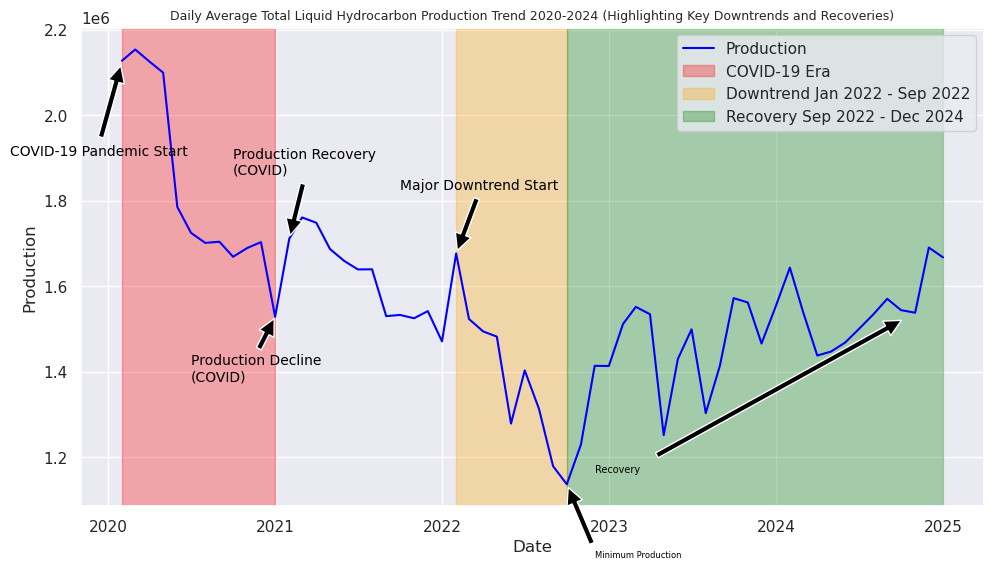

In [33]:
# Create subplots
title = 'Daily Average Total Liquid Hydrocarbon Production Trend 2020-2024 (Highlighting Key Downtrends and Recoveries)'
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
plot_avg_prod_trend(ax, data=daily_avg, title=title, annotate=True)


# Adjust layout
plt.tight_layout()
plt.show()


<Axes: title={'center': 'Daily Average Production'}, xlabel='Date', ylabel='Production (barrels per day)'>

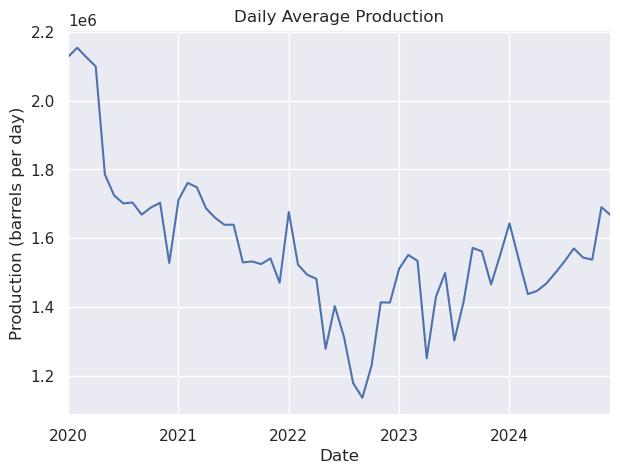

In [34]:
daily_avg['Production'].plot(figsize=(7, 5), title='Daily Average Production',
                            ylabel='Production (barrels per day)')

In [35]:
daily_avg.groupby('Year')[['Production']].mean()/1e6

,Production
Year,
2020,1.834295
2021,1.620654
2022,1.379027
2023,1.470964
2024,1.548538


## Analysis By Liquid Type

In [36]:
# Total Liquid produced to date categorized Liquid Type
df.groupby(["Liquid Type"])["Production"].sum()

Liquid Type
Condensate          3.592461e+08
Crude Oil           2.383970e+09
blend_condensate    1.253760e+08
Name: Production, dtype: float64

In [37]:
# Yearly Total Liquid produced to date categorized Liquid Type in mmbbls
annual_production = df.groupby(['Year', 'Liquid Type'])["Production"].sum().unstack().rename(columns={'blend_condensate':'Blended Condensate'})
annual_production = annual_production[['Condensate', 'Blended Condensate', 'Crude Oil']]
annual_production = (annual_production/1e6).round(2)
annual_production

Liquid Type,Condensate,Blended Condensate,Crude Oil
Year,,,
2020,89.24,35.09,546.52
2021,80.57,31.78,478.86
2022,68.62,17.16,417.21
2023,64.56,21.11,451.09
2024,56.26,20.23,490.30


In [38]:
annual_df = pd.concat([annual_production, days], axis=1)
annual_df.rename({'Condensate':'Condensate (million bbls)', 
           'Blended Condensate':'Blended Condensate (million bbls)', 
           'Crude Oil':'Crude Oil (million bbls)'},
         axis=1, inplace=True)

annual_df

,Condensate (million bbls),Blended Condensate (million bbls),Crude Oil (million bbls),Days in Year
Year,,,,
2020,89.24,35.09,546.52,366.0
2021,80.57,31.78,478.86,365.0
2022,68.62,17.16,417.21,365.0
2023,64.56,21.11,451.09,365.0
2024,56.26,20.23,490.30,366.0


In [39]:
# Calculate barrels per day (bpd)
annual_df['Condensate (mmbpd)'] = (annual_df['Condensate (million bbls)'] ) / annual_df['Days in Year']
annual_df['Blended Condensate (mmbpd)'] = (annual_df['Blended Condensate (million bbls)']) / annual_df['Days in Year']
annual_df['Crude Oil (mmbpd)'] = (annual_df['Crude Oil (million bbls)']) / annual_df['Days in Year']

# Rearrange columns
annual_df = annual_df[['Condensate (million bbls)', 'Condensate (mmbpd)', 
         'Blended Condensate (million bbls)', 'Blended Condensate (mmbpd)', 
         'Crude Oil (million bbls)', 'Crude Oil (mmbpd)']]
annual_df

,Condensate (million bbls),Condensate (mmbpd),Blended Condensate (million bbls),Blended Condensate (mmbpd),Crude Oil (million bbls),Crude Oil (mmbpd)
Year,,,,,,
2020,89.24,0.243825,35.09,0.095874,546.52,1.493224
2021,80.57,0.220740,31.78,0.087068,478.86,1.311945
2022,68.62,0.188000,17.16,0.047014,417.21,1.143041
2023,64.56,0.176877,21.11,0.057836,451.09,1.235863
2024,56.26,0.153716,20.23,0.055273,490.30,1.339617


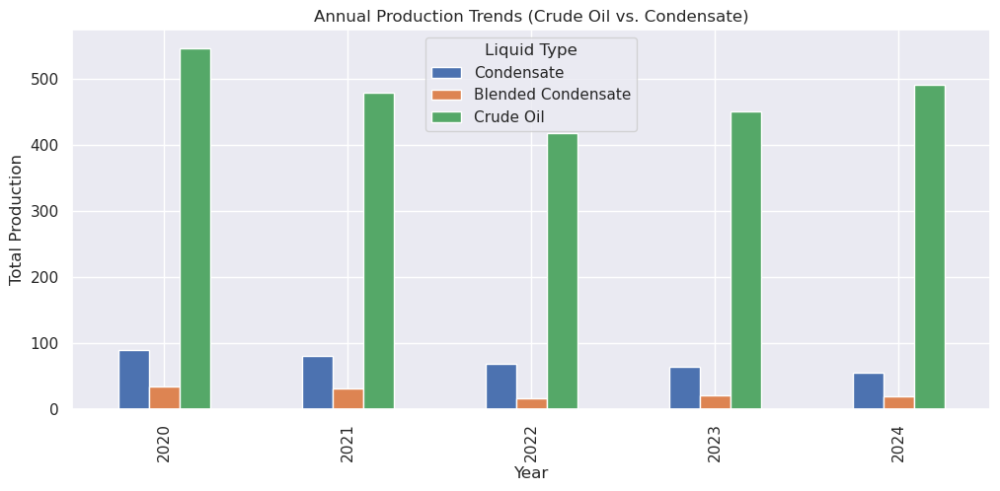

In [40]:
# Plotting annual production trends
annual_production.plot(kind='bar', figsize=(12, 5))
plt.title('Annual Production Trends (Crude Oil vs. Condensate)')
plt.xlabel('Year')
plt.ylabel('Total Production')
plt.legend(title='Liquid Type')
plt.grid(True)
plt.show()


In [41]:
df = all_df_2.copy()

In [42]:
# Filter data for different Liquid Types
crude_oil = df.query("`Liquid Type` == 'Crude Oil'")
condensate = df.query("`Liquid Type` == 'Condensate'")
blended_condensate = df.query("`Liquid Type` == 'blend_condensate'")

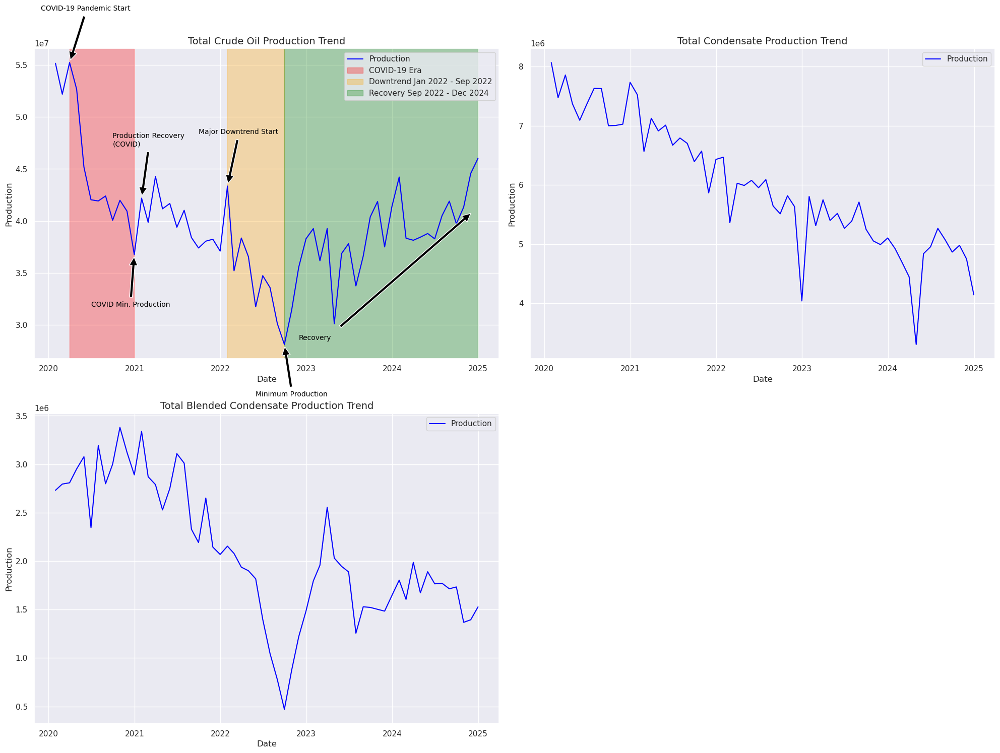

In [43]:
# Function to plot production trend with highlights
def plot_production_trend(ax, data, title, annotate=False, ratio=1):
    total_production = data.groupby('Date')['Production'].sum()
    
    ax.plot(total_production.index, total_production.values, label='Production', color='blue')
    
    if annotate:
        # Highlight the COVID-19 era (March 2020 to December 2020)
        ax.axvspan(pd.to_datetime('2020-03-31'), 
                   pd.to_datetime('2020-12-30'), 
                   color='red', alpha=0.3, 
                   label='COVID-19 Era')
        
        # Highlight the downtrend and recovery (January 2022 to January 2023)
        ax.axvspan(pd.to_datetime('2022-01-31'),
                   pd.to_datetime('2022-09-30'),
                   color='orange', alpha=0.3,
                   label='Downtrend Jan 2022 - Sep 2022')
        ax.axvspan(pd.to_datetime('2022-09-30'), 
                   pd.to_datetime('2024-12-30'), 
                   color='green', alpha=0.3,
                   label='Recovery Sep 2022 - Dec 2024')
        
        # Adding annotations to highlight key points
        ax.annotate('COVID-19 Pandemic Start', xy=(pd.to_datetime('2020-03-31'), total_production.loc['2020-03-31']), 
                    xytext=(pd.to_datetime('2019-11-30'), total_production.loc['2020-03-31'] + 5000000 * ratio), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('COVID Min. Production', xy=(pd.to_datetime('2020-12-31'), total_production.loc['2020-12-31']), 
                    xytext=(pd.to_datetime('2020-07-01'), total_production.loc['2020-12-31'] - 5000000 * ratio), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Production Recovery\n(COVID)', xy=(pd.to_datetime('2021-01-31'), total_production.loc['2021-01-31']), 
                    xytext=(pd.to_datetime('2020-09-30'), total_production.loc['2021-01-31'] + 5000000 * ratio), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Major Downtrend Start', xy=(pd.to_datetime('2022-01-31'), total_production.loc['2022-01-31']), 
                    xytext=(pd.to_datetime('2021-09-30'), total_production.loc['2022-01-31'] + 5000000 * ratio), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Minimum Production', xy=(pd.to_datetime('2022-09-30'), total_production.loc['2022-09-30']), 
                    xytext=(pd.to_datetime('2022-05-31'), total_production.loc['2022-09-30'] - 5000000 * ratio), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
        
        ax.annotate('Recovery', xy=(pd.to_datetime('2024-12-31'), total_production.loc['2024-10-31']), 
                    xytext=(pd.to_datetime('2022-11-30'), total_production.loc['2022-11-30'] - 7000000 * ratio), 
                    arrowprops=dict(facecolor='black', shrink=0.05),
                    fontsize=10, color='black')
    
    # Title and labels
    ax.set_title(f'{title} Production Trend', fontsize=14)
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel('Production', fontsize=12)
    ax.legend()
    ax.grid(True)

# Create subplots
fig, ax = plt.subplots(2, 2, figsize=(20, 15))

# Plot production trends for each Liquid Type in separate subplots
plot_production_trend(ax[0, 0], crude_oil, 'Total Crude Oil', annotate=True)
plot_production_trend(ax[0, 1], condensate, 'Total Condensate')
plot_production_trend(ax[1, 0], blended_condensate, 'Total Blended Condensate')

# Hide the empty subplot (2,1)
ax[1, 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


In [44]:
daily_avg_oil = crude_oil.groupby(['Year','Month', 'Date'])["Production"].sum()/crude_oil.groupby(['Year','Month'])['month_days'].mean().values
daily_avg_oil = daily_avg_oil.reset_index().set_index('Date')

daily_avg_condensate = condensate.groupby(['Year','Month', 'Date'])["Production"].sum()/crude_oil.groupby(['Year','Month'])['month_days'].mean().values
daily_avg_condensate = daily_avg_condensate.reset_index().set_index('Date')

daily_avg_blend_condensate = blended_condensate.groupby(['Year','Month', 'Date'])["Production"].sum()/crude_oil.groupby(['Year','Month'])['month_days'].mean().values
daily_avg_blend_condensate = daily_avg_blend_condensate.reset_index().set_index('Date')

In [45]:
daily_avg_blend_condensate

,Year,Month,Production
Date,,,
2020-01-31,2020,1,88089.155711
2020-02-29,2020,2,96379.100614
2020-03-31,2020,3,90583.718950
2020-04-30,2020,4,98373.885613
2020-05-31,2020,5,99262.861255
2020-06-30,2020,6,78190.939680
2020-07-31,2020,7,102957.668570
2020-08-31,2020,8,90267.943201
2020-09-30,2020,9,100004.099087


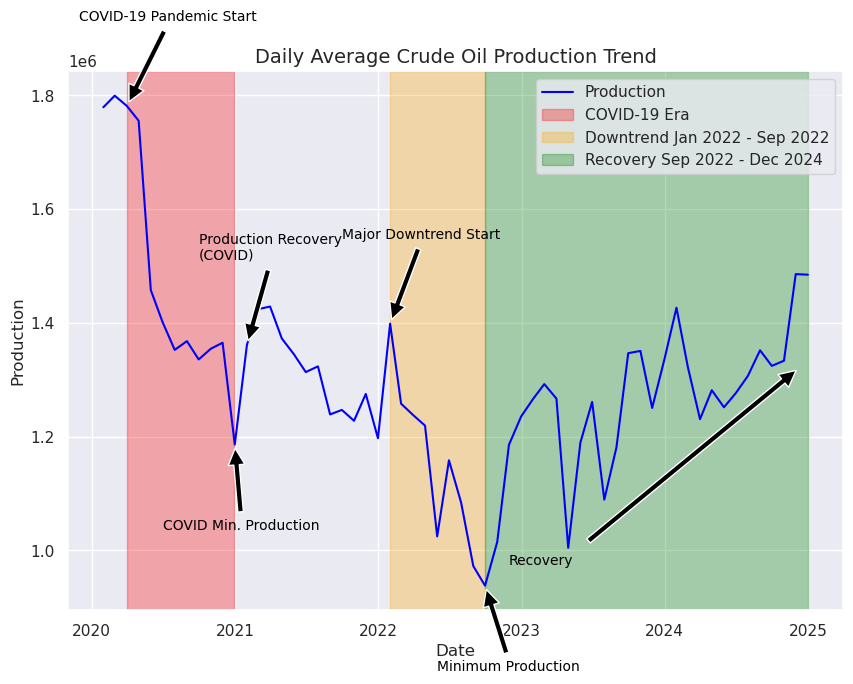

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
plot_production_trend(ax, daily_avg_oil, 'Daily Average Crude Oil', annotate=True, ratio=0.03)

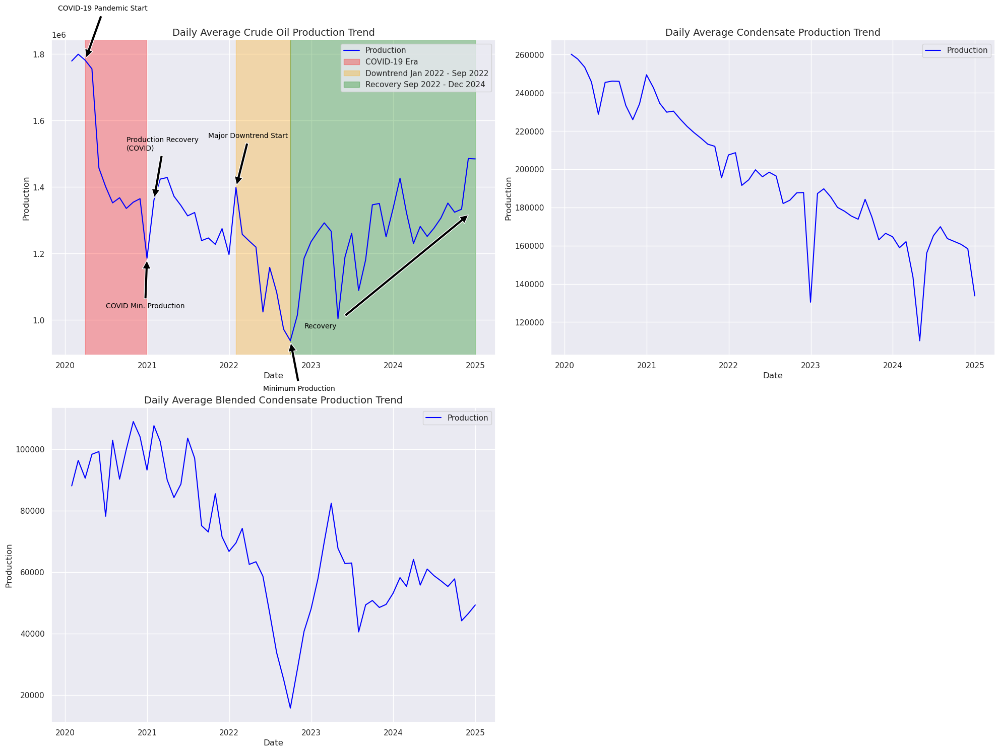

In [47]:
# Create subplots
fig, ax = plt.subplots(2, 2, figsize=(20, 15))
plot_production_trend(ax[0, 0], daily_avg_oil, 'Daily Average Crude Oil', annotate=True, ratio=0.03)
plot_production_trend(ax[0, 1], daily_avg_condensate, 'Daily Average Condensate')
plot_production_trend(ax[1, 0], daily_avg_blend_condensate, 'Daily Average Blended Condensate')

# Hide the empty subplot (2,1)
ax[1, 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

In [48]:
oil_mean = daily_avg_oil['Production'].mean()
condensate_mean = daily_avg_condensate['Production'].mean()
blend_condensate_mean = daily_avg_blend_condensate['Production'].mean()

In [49]:
print(f"Overall Crude daily average (2020-2024):{oil_mean/1e6: .2f} mmbpd")
print(f"Overall blended condensate daily average (2020-2024):{blend_condensate_mean/1e6: .2f} mmbpd")
print(f"Overall condensate daily average (2020-2024):{condensate_mean/1e6: .2f} mmbpd")

Overall Crude daily average (2020-2024): 1.31 mmbpd
Overall blended condensate daily average (2020-2024): 0.07 mmbpd
Overall condensate daily average (2020-2024): 0.20 mmbpd


Next, we determine the deviation (thousand barrels per day, mbpd) from the daily avarage production for each liquid type

In [50]:
daily_std_oil = daily_avg_oil.groupby('Year')['Production'].std().div(1e3).round(2)
daily_std_oil.name = 'Crude Oil Std (mbpd)'   # Rename series
daily_std_condensate = daily_avg_condensate.groupby('Year')['Production'].std().div(1e3).round(2)
daily_std_condensate.name = 'Condensate Std (mbpd)'
daily_std_blend_condensate = daily_avg_blend_condensate.groupby('Year')['Production'].std().div(1e3).round(2)
daily_std_blend_condensate.name = 'Blended Condensate (mbpd)'

In [51]:
# Concatenate with the daily average production
pd.concat([annual_df['Crude Oil (mmbpd)'], daily_std_oil,
           annual_df['Condensate (mmbpd)'], daily_std_condensate, 
           annual_df['Blended Condensate (mmbpd)'], daily_std_blend_condensate],
          axis=1)
# annual_df.columns

,Crude Oil (mmbpd),Crude Oil Std (mbpd),Condensate (mmbpd),Condensate Std (mbpd),Blended Condensate (mmbpd),Blended Condensate (mbpd)
Year,,,,,,
2020,1.493224,218.95,0.243825,11.07,0.095874,8.34
2021,1.311945,76.66,0.220740,12.96,0.087068,13.67
2022,1.143041,137.87,0.188000,19.62,0.047014,18.88
2023,1.235863,105.08,0.176877,8.93,0.057836,11.69
2024,1.339617,84.63,0.153716,16.88,0.055273,5.87


In [52]:
condensate_by_streams = df.query("`Liquid Type` == 'Condensate'")
condensate_by_streams_total = condensate_by_streams.groupby(['TERMINAL/STREAM', 'Date'])['Production'].sum()
condensate_by_streams_daily_avg = condensate_by_streams_total/condensate_by_streams.groupby(['TERMINAL/STREAM', 'Date'])['month_days'].mean()

In [53]:
condensate_by_streams_daily_avg = condensate_by_streams_daily_avg.reset_index().rename(columns={0:'Production'})

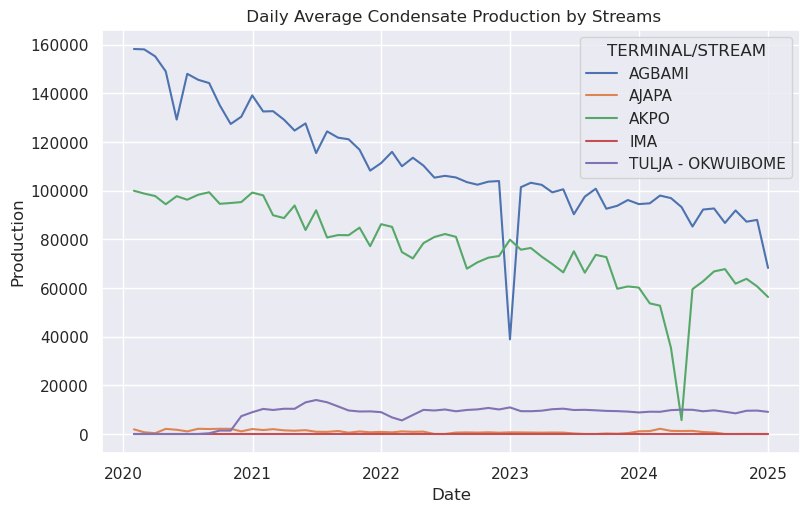

In [54]:
# Define custom colors
# Create the plot
plt.figure(figsize=(9, 5.5))
sns.lineplot(data=condensate_by_streams_daily_avg, x='Date', y='Production', hue='TERMINAL/STREAM', palette=sns.color_palette("deep", 5))

# Customize the plot
plt.title(' Daily Average Condensate Production by Streams')
plt.xlabel('Date')
plt.ylabel('Production')
plt.legend(title='TERMINAL/STREAM')
plt.show()

## Analysis By Terminal/Streams

In [55]:
def get_stream_statistics(dataframe, stream_name, meta=False):
    """
    Analyzes the production data for a given stream and calculates various statistics.
    
    Parameters:
        dataframe (pd.DataFrame): The DataFrame containing production data.
        stream_name (str): The name of the stream to analyze.
    
    Returns:
        dict: A dictionary containing the calculated statistics for each liquid type and overall.
    """
    # Filter the data for the specified stream
    filtered_df = dataframe[dataframe['TERMINAL/STREAM'] == stream_name].dropna()
    lt = filtered_df['Liquid Type'].unique()
    if meta:
        print(f"{stream_name} produces")
        for i, type in enumerate(lt):
            print(f"\t{i+1}. {type}")
        print("\n")
              
    if filtered_df.empty:
        print(f"No data available for stream: {stream_name}")
        return None
    
    # Initialize a dictionary to store statistics
    statistics = {
        'All Liquids': {}
    }
    
    # Calculate total production for all years
    production = filtered_df.groupby('Date')['Production'].sum()
    statistics['All Liquids']['Production'] = production
    
    total_production = production.sum()
    statistics['All Liquids']['Total Production'] = total_production
    
    # Calculate annual production trends
    annual_production = filtered_df.groupby(['Year'])['Production'].sum()
    statistics['All Liquids']['Annual Production'] = annual_production
    
    # Calculate average daily production
    daily_average_production = filtered_df.groupby(['Year', 'Date'])['Production'].sum() / filtered_df.groupby('Date')['month_days'].mean()
    statistics['All Liquids']['Daily Average Production'] = daily_average_production
    
    overall_daily_average_production = daily_average_production.mean()
    statistics['All Liquids']['Daily Average Production (All Years)'] = overall_daily_average_production

    Yearly_daily_average_production = daily_average_production.groupby('Year').mean()
    statistics['All Liquids']['Daily Average Production (Each Year)'] = Yearly_daily_average_production
    
    # Calculate min and max production for all years
    min_max_production_all_years = (filtered_df.groupby('Date')['Production'].sum()
                                    .agg(['idxmin', 'min', 'idxmax', 'max', 'std'])
                                   )
    
    # Calculate min and max production for each year
    min_max_yearly_production = (filtered_df.groupby(['Year', 'Date'])['Production'].sum()
                                 .groupby(['Year'])
                                 .agg(['idxmin', 'min', 'idxmax', 'max', 'std'])
                                )
    
    statistics['All Liquids']['Min Max Data'] = {
        'Yearly':min_max_yearly_production,
        'Overall(All Years)':min_max_production_all_years
    }
        
    
    # Calculate statistics for each liquid type if there are multiple types
    liquid_types = filtered_df['Liquid Type'].unique()
    
    if len(liquid_types) > 1:
        statistics['Liquid Type'] = {}
        for liquid_type in liquid_types:
            liquid_df = filtered_df[filtered_df['Liquid Type'] == liquid_type].set_index('Date')
            
            # Total production for the liquid type
            production_lt = liquid_df['Production']
            total_production_lt = production_lt.sum()
            
            # Annual production for the liquid type by year
            annual_production_lt = liquid_df.groupby('Year')['Production'].sum()
            
            # Average daily production for the liquid type
            liquid_df['daily_average_production'] = liquid_df['Production']/liquid_df['month_days']
            daily_average_production_lt = liquid_df['daily_average_production']

            # Average daily production for the liquid for all years
            overall_daily_average_production_lt = liquid_df['daily_average_production'].mean()
            
            # Average daily production for the liquid type per year
            yearly_daily_average_production_lt = liquid_df.groupby('Year')['daily_average_production'].mean()
                   
            # Min and max production for the liquid type for all years
            min_max_production_all_years_lt = liquid_df['Production'].agg(['idxmin', 'min', 'idxmax', 'max', 'std'])
            
            # Min and max production for the liquid type for each year
            min_max_production_yearly_lt = liquid_df.groupby('Year')['Production'].agg(['idxmin', 'min', 'idxmax', 'max', 'std'])
            
            # Compile the results into the statistics dictionary
            statistics['Liquid Type'][liquid_type] = {
                'Production':production_lt,
                'Total Production': total_production_lt,
                'Annual Production': annual_production_lt,
                'Daily Average Production': daily_average_production_lt,
                'Yearly Daily Average Production':yearly_daily_average_production_lt,
                'Overall Daily Average Production (All years)':overall_daily_average_production_lt,
                'Min_Max_Data':{
                    'Yearly':min_max_production_yearly_lt,
                    'Overall(All Years)':min_max_production_all_years_lt
                }
            }          
    
    return statistics

In [56]:
df['TERMINAL/STREAM'].unique()

array(['USAN', 'QUA IBOE', 'BRASS', 'BONNY', 'EGINA', 'OYO', 'ABO',
       'PENNINGTON', 'UGO OCHA (JONES CREEK)', 'SEA EAGLE (EA)',
       'ANYALA MADU (CJ Blend)', 'AGBAMI', 'AKPO', 'IMA', 'AJAPA',
       'TULJA - OKWUIBOME', 'UKPOKITI', 'FORCADOS', 'ERHA',
       'ESCRAVOS (Oil Terminal)', 'BONGA', 'ANAMBRA BASIN', 'EBOK',
       'OKWORI', 'YOHO', 'OKONO', 'ANTAN', 'OTAKPIPO (Ex Ima Terminal)',
       'OKORO (Ex Ima Terminal)', 'AJE', 'ODUDU (AMENAM BLEND)',
       'ASARAMATORU (Ex Ima Terminal)', 'NEMBE', 'UTAPATE'], dtype=object)

In [57]:
major_streams = ["BONNY", "BRASS", "QUA IBOE", "FORCADOS", "ESCRAVOS (Oil Terminal)", "PENNINGTON", "BONGA",
           "ERHA", "USAN", "AKPO", "AGBAMI", "YOHO", 'ODUDU (AMENAM BLEND)', "NEMBE", "OKORO (Ex Ima Terminal)"
          ]

In [58]:
df["Liquid Type"].unique()

array(['Crude Oil', 'blend_condensate', 'Condensate'], dtype=object)

In [59]:
def get_specific_stat(df, stream_name, key='All Liquids', meta=False):
    stat = get_stream_statistics(df, stream_name, meta)

    if key not in ['All Liquids', 'Liquid Type']:
        raise ValueError (
            """
            Key should be one of the following: 'All Liquids', 'Liquid Type'. 
            To get all inner keys available to a particular key, set meta=True
            """
        )
    
    elif meta:
        if key == 'All Liquids':
            print(f"Available statistics for All Liquids include {list(stat['All Liquids'].keys())}")
        elif key == 'Liquid Type':
            liquid_types = list(stat['Liquid Type'].keys())
            print(f"The available Liquid Type are: {liquid_types}\n")
            print("The statistics for each Liquid Type are:")
            for liquid in liquid_types:
                data = stat['Liquid Type'][liquid].keys()
                print(f"{liquid}:\n{list(data)}\n")
                
    else:
        return stat[key]
   

In [60]:
get_specific_stat(df=df, stream_name='QUA IBOE', meta=True)

QUA IBOE produces
	1. Crude Oil
	2. blend_condensate


Available statistics for All Liquids include ['Production', 'Total Production', 'Annual Production', 'Daily Average Production', 'Daily Average Production (All Years)', 'Daily Average Production (Each Year)', 'Min Max Data']


In [61]:
get_specific_stat(df, 'QUA IBOE', key='Liquid Type', meta=True)

QUA IBOE produces
	1. Crude Oil
	2. blend_condensate


The available Liquid Type are: ['Crude Oil', 'blend_condensate']

The statistics for each Liquid Type are:
Crude Oil:
['Production', 'Total Production', 'Annual Production', 'Daily Average Production', 'Yearly Daily Average Production', 'Overall Daily Average Production (All years)', 'Min_Max_Data']

blend_condensate:
['Production', 'Total Production', 'Annual Production', 'Daily Average Production', 'Yearly Daily Average Production', 'Overall Daily Average Production (All years)', 'Min_Max_Data']



In [62]:
get_specific_stat(df, 'QUA IBOE', key='All Liquids')['Daily Average Production']

Year  Date      
2020  2020-01-31    229375.000000
      2020-02-29    235043.862069
      2020-03-31    235489.451613
      2020-04-30    228399.733333
      2020-05-31    171788.806452
      2020-06-30    177975.966667
      2020-07-31    206527.806452
      2020-08-31    191940.000000
      2020-09-30    182787.800000
      2020-10-31    183482.935484
      2020-11-30    159224.800000
      2020-12-31     49946.516129
2021  2021-01-31    119774.354839
      2021-02-28    170794.964286
      2021-03-31    164556.354839
      2021-04-30    170613.833333
      2021-05-31    174952.612903
      2021-06-30    144109.100000
      2021-07-31    150435.645161
      2021-08-31    136952.677419
      2021-09-30    150447.733333
      2021-10-31    159500.838710
      2021-11-30    153273.566667
      2021-12-31    167221.774194
2022  2022-01-31    176355.032258
      2022-02-28    162399.821429
      2022-03-31    173676.967742
      2022-04-30    162977.633333
      2022-05-31     88784.6451

In [63]:
all_streams_daily_avg = {}
for stream in major_streams:
    stream_daily_avg = get_specific_stat(df, stream, key='All Liquids')['Daily Average Production']
    all_streams_daily_avg[stream] = stream_daily_avg
all_streams_daily_avg_df = pd.DataFrame(all_streams_daily_avg)
all_streams_daily_avg_df = all_streams_daily_avg_df.reset_index().set_index('Date').drop(columns='Year')
all_streams_daily_avg_df

,BONNY,BRASS,QUA IBOE,FORCADOS,ESCRAVOS (Oil Terminal),PENNINGTON,BONGA,ERHA,USAN,AKPO,AGBAMI,YOHO,ODUDU (AMENAM BLEND),NEMBE,OKORO (Ex Ima Terminal)
Date,,,,,,,,,,,,,,,
2020-01-31,262042.741935,89096.935484,229375.000000,268516.446240,170203.516129,18288.967742,169549.032258,87962.806452,56597.354839,100002.322581,158281.677419,34493.935484,96660.645161,NaN,13713.096774
2020-02-29,298057.971504,94530.689655,235043.862069,265021.570294,172311.068966,21817.827586,164560.379310,93173.034483,50118.793103,98843.482759,158127.000000,15572.689655,91650.379310,NaN,14605.758621
2020-03-31,315560.241539,90226.548387,235489.451613,233916.548387,175403.516129,18992.516129,150219.870968,88368.645161,47212.129032,97834.387097,155268.161290,37981.064516,90017.516129,NaN,17736.258065
2020-04-30,280187.500000,105135.079893,228399.733333,268016.799251,172144.866667,21626.866667,150562.700000,76170.766667,49490.966667,94455.700000,149101.200000,25456.566667,91142.533333,NaN,18060.333333
2020-05-31,268424.267256,107863.385902,171788.806452,239911.697039,142509.677419,2576.838710,98130.258065,71659.345161,34053.516129,97768.612903,129269.548387,24502.774194,74358.258065,NaN,16447.838710
2020-06-30,228096.500333,103101.387776,177975.966667,251239.076845,128931.833333,12014.500000,75676.066667,54742.900000,36517.733333,96317.266667,148076.233333,26198.433333,75654.033333,NaN,14935.733333
2020-07-31,202785.568115,105582.677419,206527.806452,223714.986262,125504.258065,18441.322581,102210.967742,20395.935484,39731.419355,98361.741935,145619.838710,26631.290323,74579.096774,NaN,15781.161290
2020-08-31,201201.580645,93655.193548,191940.000000,233445.258065,143565.129032,0.000000,102549.193548,64033.741935,30771.322581,99387.612903,144281.258065,22261.645161,72796.870968,NaN,16304.870968
2020-09-30,199044.550000,93438.300000,182787.800000,263982.100000,132495.400000,0.000000,88507.166667,51558.333333,33059.600000,94635.100000,135163.833333,22710.700000,72693.700000,NaN,13405.933333


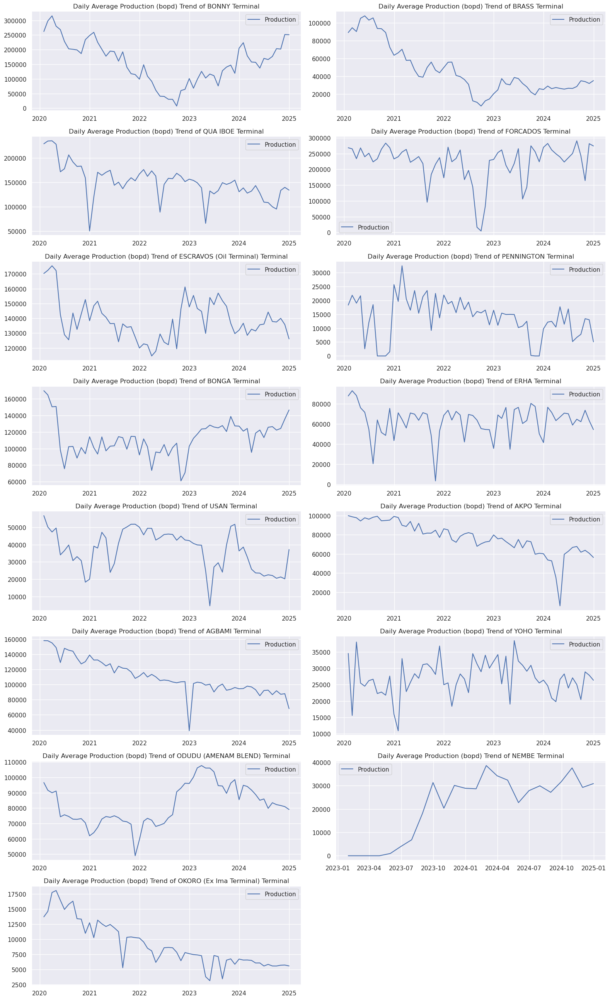

In [64]:
num_rows = 8
num_cols = 2

fig, axs = plt.subplots(num_rows, num_cols, figsize=(16, 26))

# Flatten axes for easier indexing
axs = axs.flatten()

# Plot each column on a separate subplot
for i, column in enumerate(all_streams_daily_avg_df.columns):
    ax = axs[i]
    ax.plot(all_streams_daily_avg_df.index, all_streams_daily_avg_df[column], label='Production')
    ax.set_title(f"Daily Average Production (bopd) Trend of {column} Terminal")
    ax.grid(True)
    ax.legend()

# Hide unused subplots if there are more rows*cols than columns in the dataframe
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

In [65]:
all_streams_daily_avg_df.corrwith(daily_avg['Production'])

BONNY                      0.851567
BRASS                      0.769758
QUA IBOE                   0.609845
FORCADOS                   0.613926
ESCRAVOS (Oil Terminal)    0.516339
PENNINGTON                 0.091374
BONGA                      0.467914
ERHA                       0.383062
USAN                       0.174323
AKPO                       0.488207
AGBAMI                     0.647141
YOHO                      -0.120247
ODUDU (AMENAM BLEND)      -0.088896
NEMBE                      0.434936
OKORO (Ex Ima Terminal)    0.695515
dtype: float64

Next, we'll plot the overall daily average of hydrocarbon production alongside individual terminal/stream production to visualize their trends and comparisons.

In [66]:
def plota_data(streams):
    
    # Initialize the plot
    fig, ax1 = plt.subplots(figsize=(12, 7))
    
    # PLot the Daily avg. production from all streams
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Overall Daily Average Production', color='purple')
    ax1.plot(daily_avg['Production'], color='purple', label='Overall Daily Average Production', lw=2)
    ax1.tick_params(axis='y', labelcolor='purple')
    
    # Create a secondary y-axis for the individual stream productions
    ax2 = ax1.twinx()
    
    # Plot each stream's daily avg production on the secondary y-axis
    colors = sns.color_palette("tab10", n_colors=len(streams))   # create a colour palette
    for i, stream in enumerate(streams):
        stream_data = all_streams_daily_avg_df[stream]
        ax2.plot(stream_data, ls=':', label=f'{stream} Production', color=colors[i], lw=1.8)
    
    ax2.set_ylabel('Stream Production', color='blue')
    ax2.tick_params(axis='y', labelcolor='blue')
    fig.tight_layout()
    
    # Add legend for both axes
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc='lower left')
    
    plt.title('Daily Average Production Comparison of Streams Against Overall Daily Average Production from All Streams')
    plt.show()


In [67]:
major_streams

['BONNY',
 'BRASS',
 'QUA IBOE',
 'FORCADOS',
 'ESCRAVOS (Oil Terminal)',
 'PENNINGTON',
 'BONGA',
 'ERHA',
 'USAN',
 'AKPO',
 'AGBAMI',
 'YOHO',
 'ODUDU (AMENAM BLEND)',
 'NEMBE',
 'OKORO (Ex Ima Terminal)']

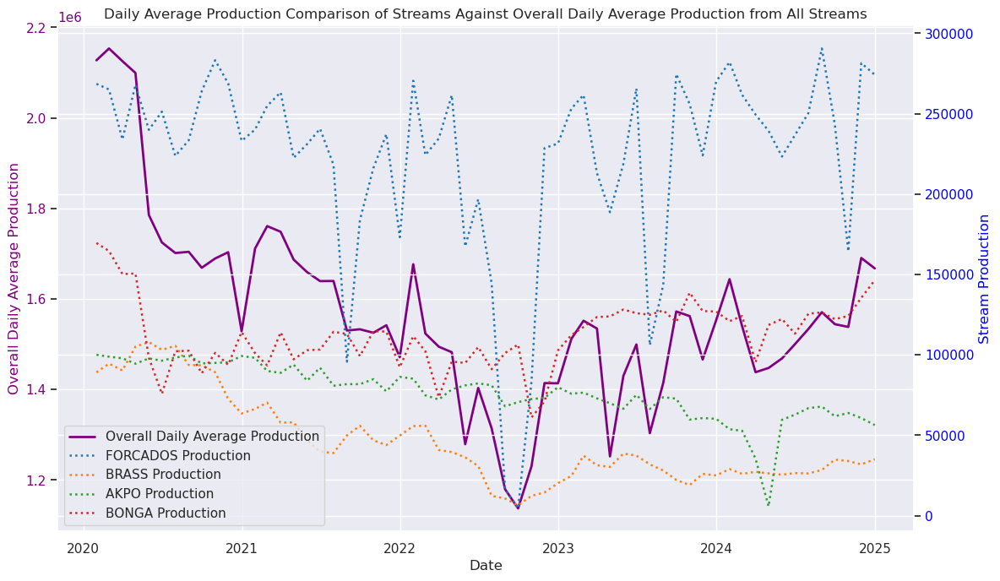

In [68]:
plota_data(streams=['FORCADOS', 'BRASS', 'AKPO', 'BONGA'])

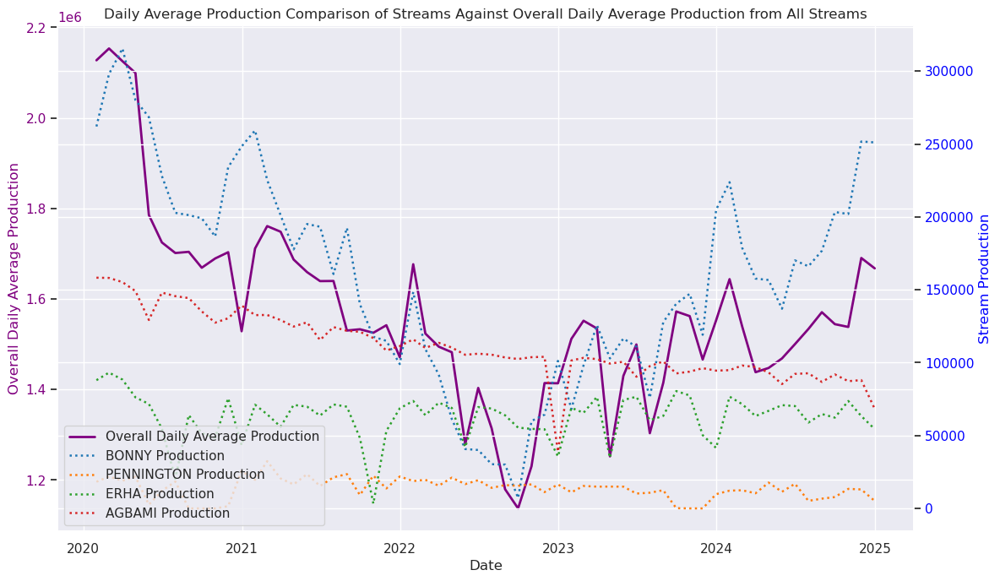

In [69]:
plota_data(streams=['BONNY', 'PENNINGTON', 'ERHA', 'AGBAMI'])

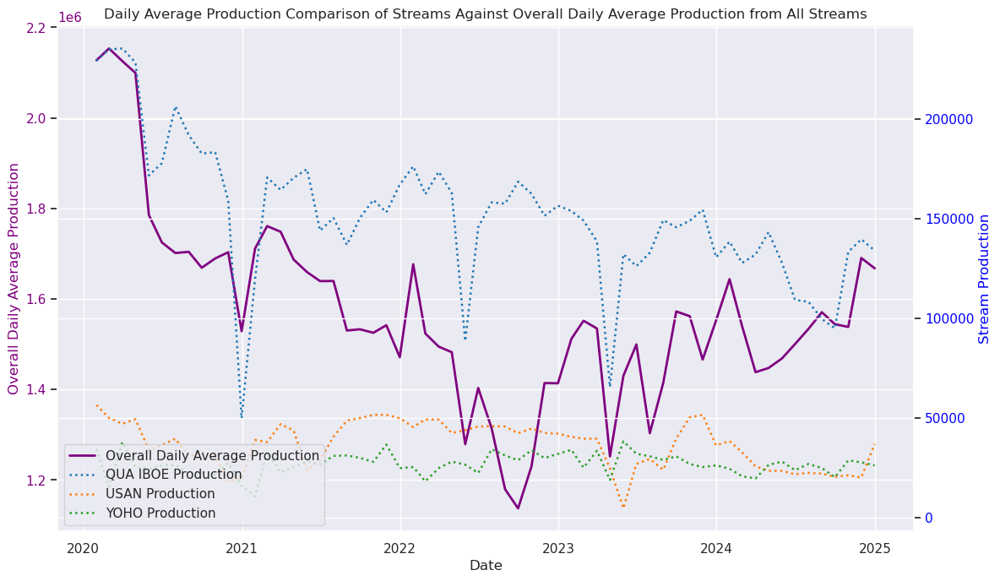

In [70]:
plota_data(streams=['QUA IBOE', 'USAN', 'YOHO'])

The **BONNY** and **FORCADOS** terminals significantly impacted the overall daily average production, driving it to its lowest point in **September 2022**.

## Analysis of Oil Price, OPEC Quota, and Daily Average Production Trends 

The historical OPEC production quota for Nigeria is obtained from the following sources:  

1. [OPEC Historical Data (1982–2022)](../datasets/opec_historical_data(1982-2022).xlsx)  
2. [TheCable: Nigeria’s Crude Oil Production Can Hit 1.5M BPD in 2024](https://www.thecable.ng/opec-nigerias-crude-oil-production-can-hit-1-5m-bpd-in-2024/)  
3. [TheCable: OPEC Extends Nigeria’s 1.5M Oil Production Quota to 2025](https://www.thecable.ng/opec-extends-nigerias-1-5m-oil-production-quota-to-2025/)  
4. [OPEC: Official Production Table from the 35th ONOMM](https://www.opec.org/opec_web/static_files_project/media/downloads/Production%20table%20-%2035th%20ONOMM.pdf)  


In [71]:
# Define the date range from January 2020 to the latest month in your data
date_range = pd.date_range(start='2020-01-01', end='2024-12-01', freq='MS')

# OPEC quota values
quota_values = np.array([1753, 1753, 1753, 1753, 1412, 1412, 1412, 1495, 1495, 1495, 1495,1495, 
                         1516,	1516, 1516, 1516, 1535, 1554, 1579, 1596, 1614,	1631,1649, 1666, 
                         1683, 1701, 1718, 1735, 1753, 1772, 1799, 1826, 1830, 1826, 1742, 1742, 
                         1742, 1742, 1742, 1742, 1742, 1742, 1742, 1742, 1742, 1742, 1742, 1742, 
                         1578, 1578, 1578, 1578, 1578, 1578, 1578, 1578, 1578, 1578, 1578, 1578]) * 1000

# Create a DataFrame for OPEC quota data
opec_quota = pd.DataFrame({
    'Dates': date_range,
    'Quota': quota_values
})

# # Set 'Dates' column as index
opec_quota.set_index('Dates', inplace=True)
opec_quota


,Quota
Dates,
2020-01-01,1753000
2020-02-01,1753000
2020-03-01,1753000
2020-04-01,1753000
2020-05-01,1412000
2020-06-01,1412000
2020-07-01,1412000
2020-08-01,1495000
2020-09-01,1495000


In [72]:
# pip install yfinance

In [73]:
# Get crude oil price
import yfinance as yf

# Define the ticker symbol for the oil price 
ticker_symbol = 'BZ=F'  #  Crude Oil Futures (Brent)

# Fetch historical data from Yahoo Finance
data = yf.download(ticker_symbol, start='2020-01-01', end='2024-12-01',)

# Print the fetched data
data.head()


YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed


Price,Close,High,Low,Open,Volume
Ticker,BZ=F,BZ=F,BZ=F,BZ=F,BZ=F
Date,,,,,
2020-01-02,66.250000,66.570000,65.730003,66.470001,25810
2020-01-03,68.599998,69.480003,66.220001,66.290001,78848
2020-01-06,68.910004,70.720001,68.190002,69.070000,51933
2020-01-07,68.269997,68.739998,67.650002,68.580002,41178
2020-01-08,65.440002,71.989998,64.940002,68.470001,85232


In [74]:
oil_price = data[('Close', 'BZ=F')]

In [75]:
crude_oil

,TERMINAL/STREAM,Liquid Type,Date,Production,Year,Month,Month_name,month_days
36,USAN,Crude Oil,2020-01-31,1.754518e+06,2020,1,January,31
6,QUA IBOE,Crude Oil,2020-01-31,7.000067e+06,2020,1,January,31
3,BRASS,Crude Oil,2020-01-31,2.396537e+06,2020,1,January,31
0,BONNY,Crude Oil,2020-01-31,6.634945e+06,2020,1,January,31
37,EGINA,Crude Oil,2020-01-31,6.258028e+06,2020,1,January,31
...,...,...,...,...,...,...,...,...
616,ANYALA MADU (CJ Blend),Crude Oil,2024-12-31,1.631554e+06,2024,12,December,31
615,SEA EAGLE (EA),Crude Oil,2024-12-31,5.292760e+05,2024,12,December,31
614,UGO OCHA (JONES CREEK),Crude Oil,2024-12-31,5.481010e+05,2024,12,December,31
613,UKPOKITI,Crude Oil,2024-12-31,0.000000e+00,2024,12,December,31


In [76]:
daily_avg_oil

,Year,Month,Production
Date,,,
2020-01-31,2020,1,1.779007e+06
2020-02-29,2020,2,1.799354e+06
2020-03-31,2020,3,1.781287e+06
2020-04-30,2020,4,1.755332e+06
2020-05-31,2020,5,1.457385e+06
2020-06-30,2020,6,1.401207e+06
2020-07-31,2020,7,1.352404e+06
2020-08-31,2020,8,1.367810e+06
2020-09-30,2020,9,1.335609e+06


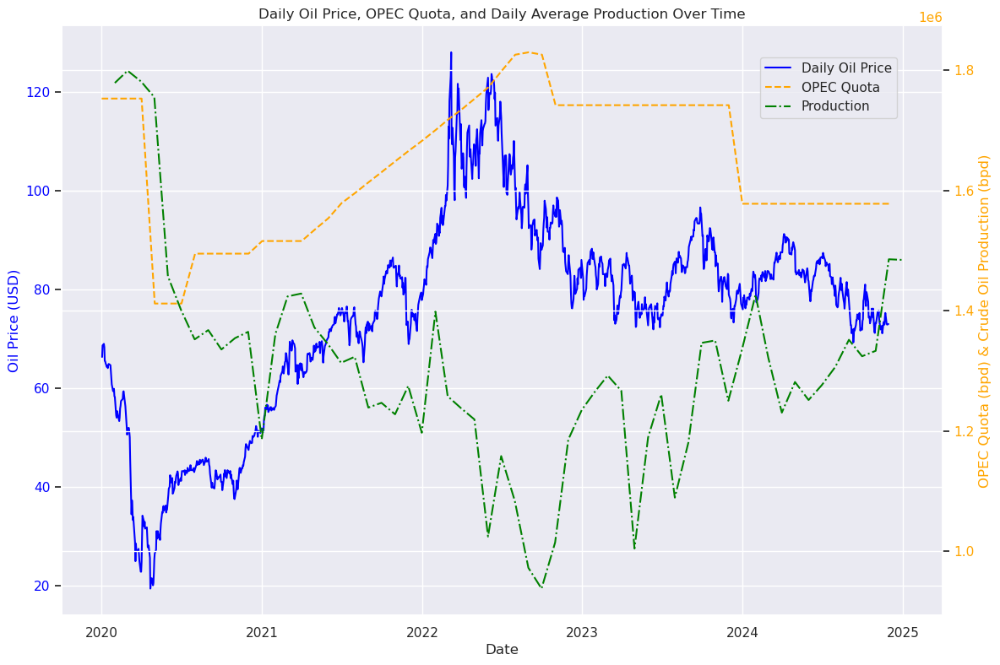

In [77]:
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot oil_price on the primary y-axis
ax1.set_xlabel('Date')
ax1.set_ylabel('Oil Price (USD)', color='blue')
ax1.plot(oil_price.index, oil_price, color='blue', label='Daily Oil Price')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a secondary y-axis to plot opec_quota and daily_avg_oil
ax2 = ax1.twinx()
ax2.set_ylabel('OPEC Quota (bpd) & Crude Oil Production (bpd)', color='orange')
ax2.plot(opec_quota.index, opec_quota, color='orange', linestyle='--', label='OPEC Quota')
ax2.plot(daily_avg_oil.index, daily_avg_oil['Production'], color='green', linestyle='-.', label='Production')
ax2.tick_params(axis='y', labelcolor='orange')

# Add a legend to differentiate the series
fig.tight_layout()  # Adjust layout to make room for the legend
fig.legend(loc='upper left', bbox_to_anchor=(0.75, 0.92))

# Show plot
plt.title('Daily Oil Price, OPEC Quota, and Daily Average Production Over Time')
plt.show()


 
Figure above shows the trends in **oil price**, **OPEC production quota**, and **daily average production** from **January 2020 to June 2024**. These three factors play a crucial role in shaping the global oil market.    

**Oil Price (USD)**  
- Oil prices took a sharp dive in early 2020, falling below **\$20 per barrel**. This was largely due to the **COVID-19 pandemic**, which caused a massive drop in global demand.  
- After hitting rock bottom, prices started recovering, reaching around **\$80 per barrel by mid-2021** as economies reopened and global activity picked up.  
- Between **mid-2021 and early 2022**, prices became **highly volatile**, peaking at about **$120 per barrel**. This was driven by **geopolitical tensions**, especially **Russia’s invasion of Ukraine**, supply chain disruptions, and shifting demand.  
- After 2022, prices somewhat stabilized, fluctuating between **\$60 and \\$100 per barrel**, influenced by production policies and market reactions.  

**OPEC Quota (bpd)**  
- OPEC’s production quota was cut sharply in early 2020 to help control the oversupply triggered by plummeting oil prices.  
- As demand started to recover, OPEC gradually increased quotas, allowing production to scale up in phases.  
- By late 2021, quotas had **stabilized at around 1.8 million barrels per day (bpd)**, reflecting OPEC’s effort to keep supply and demand in balance.  

**Daily Average Production (bpd)**  
- Nigeria’s **daily average oil production** dropped significantly in early 2020, following the same pattern as oil prices and OPEC quotas.  
- Production showed signs of recovery afterward, but with **frequent fluctuations**. A **major drop in 2022** highlighted ongoing challenges in Nigeria’s oil sector.  
- By **2023 and early 2024**, production levels seemed to have **stabilized**, showing a better alignment between output, market conditions, and OPEC’s production strategy.  

**Key Takeaways**  
1. **The COVID-19 Impact**  
   - The sharp decline in **oil price, OPEC quota, and production levels in early 2020** highlights the devastating effect of the **pandemic on the global oil industry**. The slow but steady recovery reflects the broader **economic rebound**.  

2. **OPEC’s Role in Market Stability**  
   - OPEC’s quota changes have been central to stabilizing the market. The gradual production increases after 2020 show a **cautious approach** to avoid oversupply.  

3. **Market Volatility vs. Stability**  
   - The oil market has been highly sensitive to **geopolitical events** and **economic shocks**. However, by **2023 and 2024**, things started settling into a more stable pattern.  

4. **Nigeria’s Missed Opportunity**  
   - Despite **rising oil prices in 2022**, Nigeria’s **low production levels** meant the country couldn't take full advantage of the price surge, leading to **significant revenue losses**.  


## Analysis by Type/Location

In [78]:
terminal_data =  pd.read_csv("../datasets/terminal_data.csv")
terminal_data

,TERMINAL/STREAM,TYPE,PLATFORM,CAPACITY (Bbls),OPERATOR,CONTRACT
0,QUA IBOE,Onshore,Land,8520000,MOBIL,JV
1,FORCADOS,Onshore,Land,6289832,SHELL,JV
2,BONNY,Onshore,Land,5700000,SHELL,JV
3,BRASS,Onshore,Land,3271000,AGIP,JV
4,ESCRAVOS (Oil Terminal),Onshore,Land,2600000,CHEVRON,JV
5,ERHA,Offshore,FPSO,2355335,ESSO (MOBIL),PSC
6,EGINA,Offshore,FPSO,2300000,TUPNI,PSC
7,PENNINGTON,Offshore,FPSO,2224132,CHEVRON,JV
8,UTAPATE,Offshore,FPSO,2200000,NEPL,SR
9,YOHO,Offshore,FPSO,2192653,MOBIL,JV


In [79]:
df['TERMINAL/STREAM']

36                        USAN
6                     QUA IBOE
4                        BRASS
3                        BRASS
1                        BONNY
                ...           
615             SEA EAGLE (EA)
614     UGO OCHA (JONES CREEK)
613                   UKPOKITI
611                        ABO
585    ESCRAVOS (Oil Terminal)
Name: TERMINAL/STREAM, Length: 2556, dtype: object

In [80]:
df['TERMINAL/STREAM'].nunique()

34

In [81]:
terminal_data['TERMINAL/STREAM'].nunique()

32

In [82]:
# Terminals with missing info
set(df['TERMINAL/STREAM']).difference(terminal_data['TERMINAL/STREAM'])

{'ANAMBRA BASIN', 'ASARAMATORU (Ex Ima Terminal)'}

In [83]:
df

,TERMINAL/STREAM,Liquid Type,Date,Production,Year,Month,Month_name,month_days
36,USAN,Crude Oil,2020-01-31,1.754518e+06,2020,1,January,31
6,QUA IBOE,Crude Oil,2020-01-31,7.000067e+06,2020,1,January,31
4,BRASS,blend_condensate,2020-01-31,3.654684e+05,2020,1,January,31
3,BRASS,Crude Oil,2020-01-31,2.396537e+06,2020,1,January,31
1,BONNY,blend_condensate,2020-01-31,1.488380e+06,2020,1,January,31
...,...,...,...,...,...,...,...,...
615,SEA EAGLE (EA),Crude Oil,2024-12-31,5.292760e+05,2024,12,December,31
614,UGO OCHA (JONES CREEK),Crude Oil,2024-12-31,5.481010e+05,2024,12,December,31
613,UKPOKITI,Crude Oil,2024-12-31,0.000000e+00,2024,12,December,31
611,ABO,Crude Oil,2024-12-31,3.723780e+05,2024,12,December,31


In [84]:
df_merge = pd.merge(df, terminal_data, how='right', on='TERMINAL/STREAM')
df_merge

,TERMINAL/STREAM,Liquid Type,Date,Production,Year,Month,Month_name,month_days,TYPE,PLATFORM,CAPACITY (Bbls),OPERATOR,CONTRACT
0,QUA IBOE,Crude Oil,2020-01-31,7000066.76,2020,1,January,31,Onshore,Land,8520000,MOBIL,JV
1,QUA IBOE,blend_condensate,2020-01-31,110558.24,2020,1,January,31,Onshore,Land,8520000,MOBIL,JV
2,QUA IBOE,Crude Oil,2020-02-29,6704942.91,2020,2,February,29,Onshore,Land,8520000,MOBIL,JV
3,QUA IBOE,blend_condensate,2020-02-29,111329.09,2020,2,February,29,Onshore,Land,8520000,MOBIL,JV
4,QUA IBOE,Crude Oil,2020-03-31,7281638.22,2020,3,March,31,Onshore,Land,8520000,MOBIL,JV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2431,AJAPA,Condensate,2024-10-31,691.00,2024,10,October,31,Offshore,FSO,80000,BRITTANIA-U,SR
2432,AJAPA,Crude Oil,2024-11-30,45219.00,2024,11,November,30,Offshore,FSO,80000,BRITTANIA-U,SR
2433,AJAPA,Condensate,2024-11-30,0.00,2024,11,November,30,Offshore,FSO,80000,BRITTANIA-U,SR
2434,AJAPA,Crude Oil,2024-12-31,81691.00,2024,12,December,31,Offshore,FSO,80000,BRITTANIA-U,SR


In [85]:
df_merge.query("`TERMINAL/STREAM`== 'ABO'")['TYPE'].unique()

array(['Offshore'], dtype=object)

In [86]:
onshore_df = df_merge.query("`TYPE` == 'Onshore'")
onshore_daily_avg = onshore_df.groupby(['Date'])['Production'].sum() / onshore_df.groupby('Date')['month_days'].mean()

offshore_df = df_merge.query("`TYPE` == 'Offshore'")
offshore_daily_avg = offshore_df.groupby(['Date'])['Production'].sum() / offshore_df.groupby('Date')['month_days'].mean()

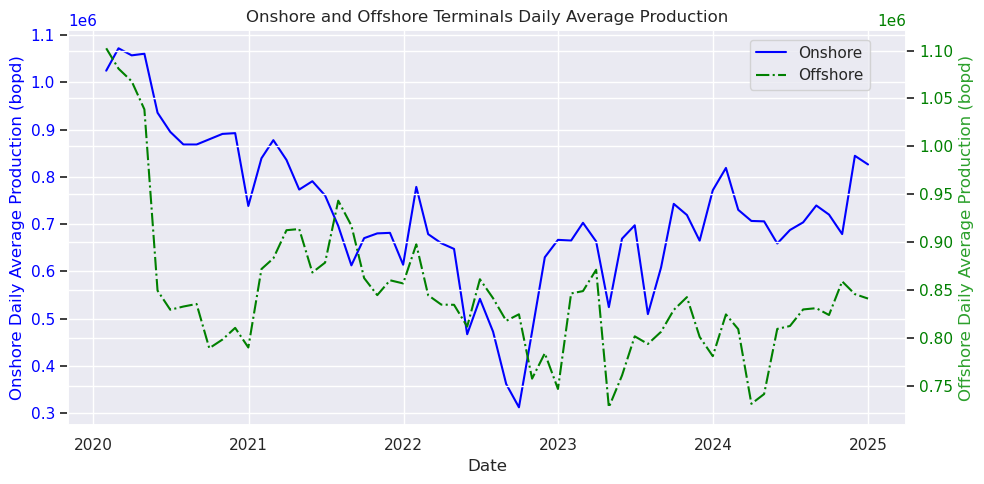

In [87]:
# First plot
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.plot(onshore_daily_avg, color='blue', label='Onshore')
ax1.set_xlabel('Date')
ax1.set_ylabel('Onshore Daily Average Production (bopd)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title("Onshore and Offshore Terminals Daily Average Production")

# Second plot with twinx
ax2 = ax1.twinx()
ax2.plot(offshore_daily_avg, color='green', ls='-.', label='Offshore')
ax2.set_ylabel('Offshore Daily Average Production (bopd)', color='tab:green')
ax2.tick_params(axis='y', labelcolor='green')

# Add a legend to differentiate the series
fig.tight_layout()  # Adjust layout to make room for the legend
fig.legend(loc='upper left', bbox_to_anchor=(0.75, 0.92))

plt.show()


Next, we'll determine the contributed proportion of each Stream per year

In [88]:
(df_merge.groupby(['Year', 'TERMINAL/STREAM']).Production.sum()/df_merge.groupby(['Year']).Production.sum())

Year  TERMINAL/STREAM       
2020  ABO                       0.008636
      AGBAMI                    0.078184
      AJAPA                     0.000889
      AJE                       0.001115
      AKPO                      0.053073
                                  ...   
2024  UGO OCHA (JONES CREEK)    0.009371
      UKPOKITI                  0.000000
      USAN                      0.016718
      UTAPATE                   0.013025
      YOHO                      0.016138
Name: Production, Length: 153, dtype: float64

In [89]:
def get_prop(df_merge, ids):
    prop = df_merge.groupby(ids).Production.sum()/df_merge.groupby(ids[0]).Production.sum()
    prop.name = 'Prop'
    return prop.reset_index()

prop_df = get_prop(df_merge, ['Year', 'TERMINAL/STREAM'])

# Create a mapping dictionaries for TYPE and CONTRACT w.r.t the TERMINAL/STREAM
type_map = dict(zip(terminal_data['TERMINAL/STREAM'], terminal_data['TYPE']))
contract_map = dict(zip(terminal_data['TERMINAL/STREAM'], terminal_data['CONTRACT']))

# Create TYPE and CONTRACT columns in prop_df by mapping on the TERMINAL/STREAM
prop_df['TYPE'] = prop_df['TERMINAL/STREAM'].map(type_map)
prop_df['CONTRACT'] = prop_df['TERMINAL/STREAM'].map(contract_map)
prop_df

,Year,TERMINAL/STREAM,Prop,TYPE,CONTRACT
0,2020,ABO,0.008636,Offshore,PSC
1,2020,AGBAMI,0.078184,Offshore,SR
2,2020,AJAPA,0.000889,Offshore,SR
3,2020,AJE,0.001115,Offshore,SR
4,2020,AKPO,0.053073,Offshore,SR
...,...,...,...,...,...
148,2024,UGO OCHA (JONES CREEK),0.009371,Offshore,JV
149,2024,UKPOKITI,0.000000,Offshore,SR
150,2024,USAN,0.016718,Offshore,PSC
151,2024,UTAPATE,0.013025,Offshore,SR


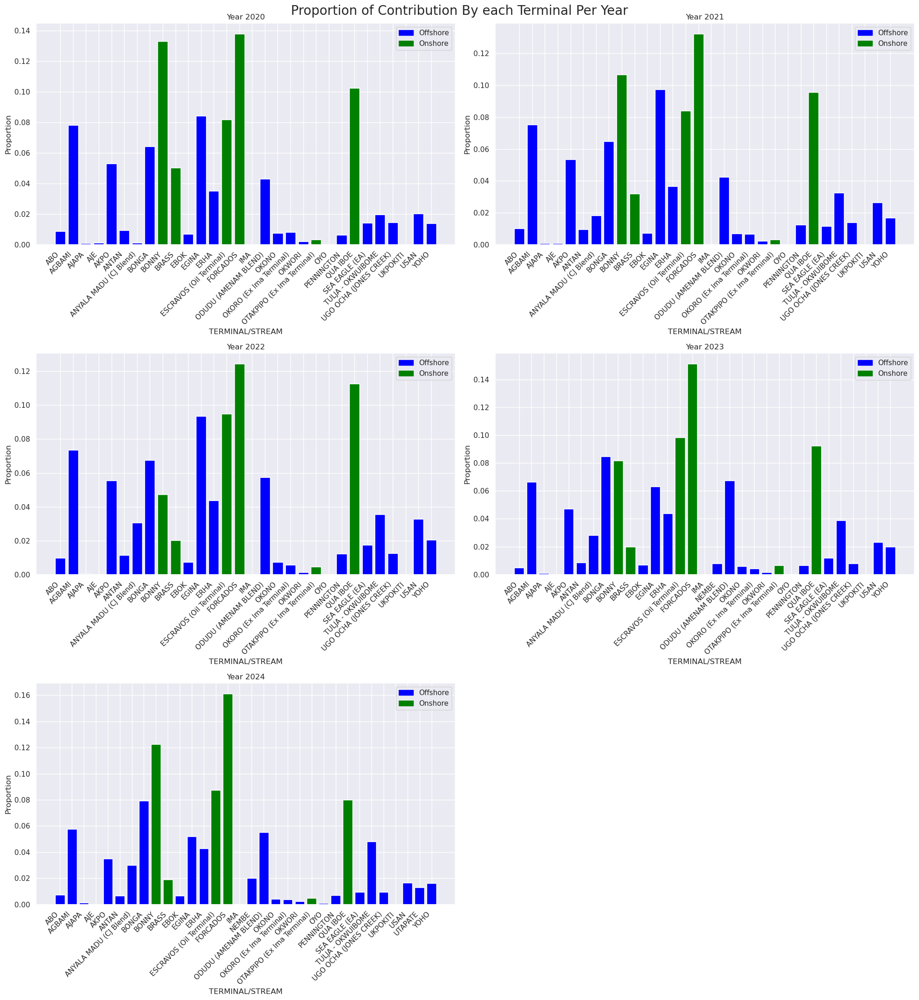

In [90]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(20, 22),)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Define colors for each type
type_colors = {'Offshore': 'blue', 'Onshore': 'green'}

# Create custom legend handles
legend_handles = [mpatches.Patch(color=color, label=type_name) for type_name, color in type_colors.items()]

# Get unique years
years = prop_df['Year'].unique()

# Loop through each year and plot
for i, year in enumerate(years):
    ax = axes[i]
    year_data = prop_df[prop_df['Year'] == year]
    bars = ax.bar(year_data['TERMINAL/STREAM'], year_data['Prop'], color=year_data['TYPE'].map(type_colors))
    
    ax.set_title(f'Year {year}')
    ax.set_xlabel('TERMINAL/STREAM')
    ax.set_ylabel('Proportion')
    ax.set_xticks(range(len(year_data)))
    ax.set_xticklabels(year_data['TERMINAL/STREAM'], rotation=45, ha='right')
    ax.legend(handles=legend_handles)

# Remove the last empty subplot
fig.delaxes(axes[-1])

plt.suptitle("Proportion of Contribution By each Terminal Per Year", fontsize=20)
# Adjust layout
plt.tight_layout()
plt.show()


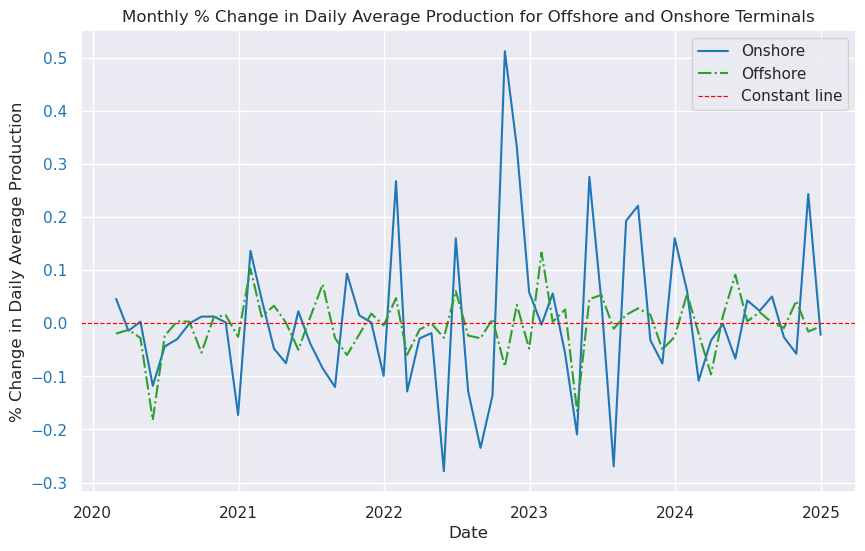

In [91]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Plot onshore daily average on the primary y-axis
ax.plot(onshore_daily_avg.pct_change(), color='tab:blue', label='Onshore')
ax.plot(offshore_daily_avg.pct_change(), color='tab:green', linestyle='-.', label='Offshore')
ax.set_xlabel('Date')
ax.set_ylabel('% Change in Daily Average Production')
ax.tick_params(axis='y', labelcolor='tab:blue')
ax.axhline(y=0, color='red', linestyle='--', lw=0.85, label='Constant line')

# Show plot
plt.title("Monthly % Change in Daily Average Production for Offshore and Onshore Terminals")
plt.legend()
plt.show()


The chart displays the monthly percentage change in daily average production for both onshore and offshore terminals from 2020 to 2025. The onshore production exhibits greater volatility, with sharp spikes and dips, especially around 2022 and 2023, indicating significant fluctuations in output. In contrast, the offshore production shows a more stable trend, with smaller variations. The red dashed line at 0% represents no change, highlighting that both onshore and offshore production frequently oscillate between growth and decline. The extreme swings in onshore production suggest possible operational disruptions (vandalism and force majeure).

In [92]:
fpso_df = df_merge.query("`PLATFORM` == 'FPSO'")
fpso_daily_avg = fpso_df.groupby(['Date'])['Production'].sum() / fpso_df.groupby('Date')['month_days'].mean()

fso_df = df_merge.query("`PLATFORM` == 'FSO'")
fso_daily_avg = fso_df.groupby(['Date'])['Production'].sum() / fso_df.groupby('Date')['month_days'].mean()

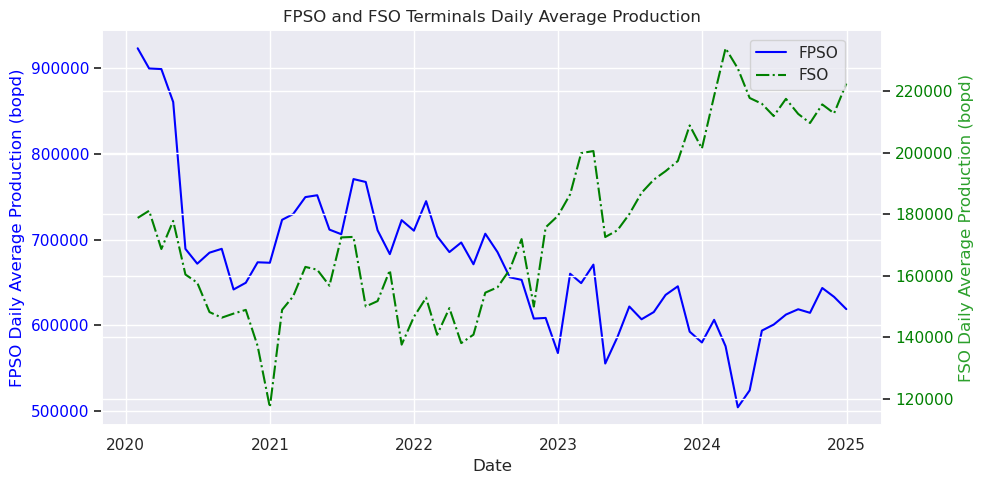

In [93]:
# First plot
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.plot(fpso_daily_avg, color='blue', label='FPSO')
ax1.set_xlabel('Date')
ax1.set_ylabel('FPSO Daily Average Production (bopd)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title("FPSO and FSO Terminals Daily Average Production")

# Second plot with twinx
ax2 = ax1.twinx()
ax2.plot(fso_daily_avg, color='green', ls='-.', label='FSO')
ax2.set_ylabel('FSO Daily Average Production (bopd)', color='tab:green')
ax2.tick_params(axis='y', labelcolor='green')

# Add a legend to differentiate the series
fig.tight_layout()  # Adjust layout to make room for the legend
fig.legend(loc='upper left', bbox_to_anchor=(0.75, 0.92))

plt.show()

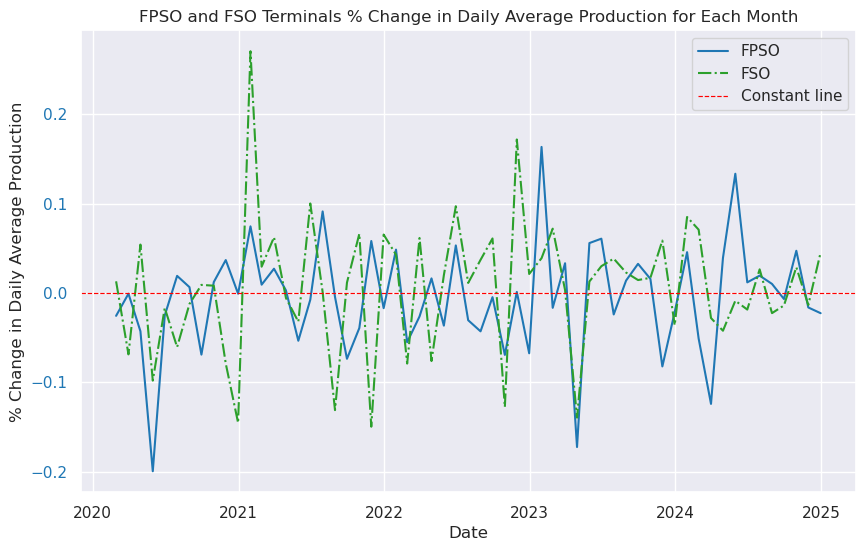

In [94]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Plot onshore daily average on the primary y-axis
ax.plot(fpso_daily_avg.pct_change(), color='tab:blue', label='FPSO')
ax.plot(fso_daily_avg.pct_change(), color='tab:green', linestyle='-.', label='FSO')
ax.set_xlabel('Date')
ax.set_ylabel('% Change in Daily Average Production')
ax.tick_params(axis='y', labelcolor='tab:blue')
ax.axhline(y=0, color='red', linestyle='--', lw=0.85, label='Constant line')

# Show plot
plt.title("FPSO and FSO Terminals % Change in Daily Average Production for Each Month")
plt.legend()
plt.show()

In [95]:
major_streams

['BONNY',
 'BRASS',
 'QUA IBOE',
 'FORCADOS',
 'ESCRAVOS (Oil Terminal)',
 'PENNINGTON',
 'BONGA',
 'ERHA',
 'USAN',
 'AKPO',
 'AGBAMI',
 'YOHO',
 'ODUDU (AMENAM BLEND)',
 'NEMBE',
 'OKORO (Ex Ima Terminal)']

In [96]:
all_streams_monthly_production = {}
for stream in major_streams:
    stream_monthly_production = get_specific_stat(df_merge, stream, key='All Liquids')['Production']
    all_streams_monthly_production[stream] = stream_monthly_production

# convert into a dataframe and set index to 'Date'
all_streams_monthly_production_df = pd.DataFrame(all_streams_monthly_production)
all_streams_monthly_production_df = all_streams_monthly_production_df.reset_index().set_index('Date')
all_streams_monthly_production_df.head()

,BONNY,BRASS,QUA IBOE,FORCADOS,ESCRAVOS (Oil Terminal),PENNINGTON,BONGA,ERHA,USAN,AKPO,AGBAMI,YOHO,ODUDU (AMENAM BLEND),NEMBE,OKORO (Ex Ima Terminal)
Date,,,,,,,,,,,,,,,
2020-01-31,8.123325e+06,2.762005e+06,7110625.0,8.324010e+06,5276309.0,566958.0,5256020.0,2726847.0,1754518.0,3100072.0,4906732.0,1069312.0,2996480.0,NaN,425106.0
2020-02-29,8.643681e+06,2.741390e+06,6816272.0,7.685626e+06,4997021.0,632717.0,4772251.0,2702018.0,1453445.0,2866461.0,4585683.0,451608.0,2657861.0,NaN,423567.0
2020-03-31,9.782367e+06,2.797023e+06,7300173.0,7.251413e+06,5437509.0,588768.0,4656816.0,2739428.0,1463576.0,3032866.0,4813313.0,1177413.0,2790543.0,NaN,549824.0
2020-04-30,8.405625e+06,3.154052e+06,6851992.0,8.040504e+06,5164346.0,648806.0,4516881.0,2285123.0,1484729.0,2833671.0,4473036.0,763697.0,2734276.0,NaN,541810.0
2020-05-31,8.321152e+06,3.343765e+06,5325453.0,7.437263e+06,4417800.0,79882.0,3042038.0,2221439.7,1055659.0,3030827.0,4007356.0,759586.0,2305106.0,NaN,509883.0


## Analysis By Contract

In [97]:
df2 = df_merge.groupby(['Year', 'CONTRACT'])['Production'].sum().unstack()
df2

CONTRACT,JV,PSC,SR
Year,,,
2020,4.031080e+08,1.556138e+08,112132877.0
2021,3.365509e+08,1.584522e+08,96196256.0
2022,2.789328e+08,1.422686e+08,81788969.0
2023,3.218372e+08,1.390144e+08,75901269.0
2024,3.527893e+08,1.399586e+08,74046592.0


<Axes: title={'center': 'Total Production by Contract Type'}, xlabel='Year', ylabel='Barrels of Oil (bbls)'>

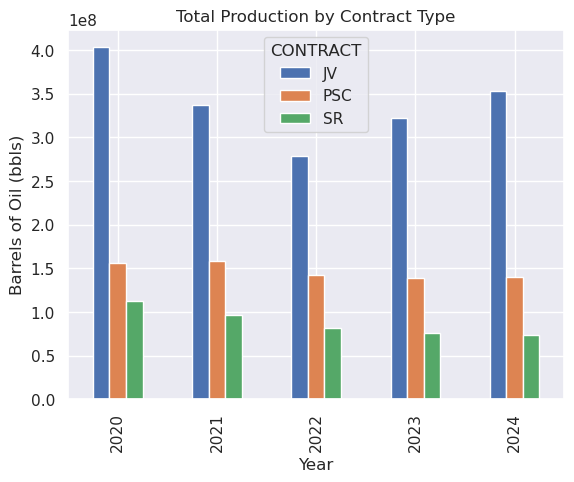

In [98]:
df2.plot(kind='bar', ylabel='Barrels of Oil (bbls)',
         title='Total Production by Contract Type',
       )

In [99]:
df2 = df2/1e6
df2.rename(columns={'JV':'JV (mmbbls)', 'PSC':'PSC (mmbbls)', 'SR':'SR (mmbbls)'}, inplace=True)
df2

CONTRACT,JV (mmbbls),PSC (mmbbls),SR (mmbbls)
Year,,,
2020,403.107988,155.613759,112.132877
2021,336.550896,158.452162,96.196256
2022,278.932785,142.268550,81.788969
2023,321.837158,139.014449,75.901269
2024,352.789285,139.958617,74.046592


In [100]:
days = df.groupby(['Year', 'Month_name' ])['month_days'].mean().groupby('Year').sum()
days

Year
2020    366.0
2021    365.0
2022    365.0
2023    365.0
2024    366.0
Name: month_days, dtype: float64

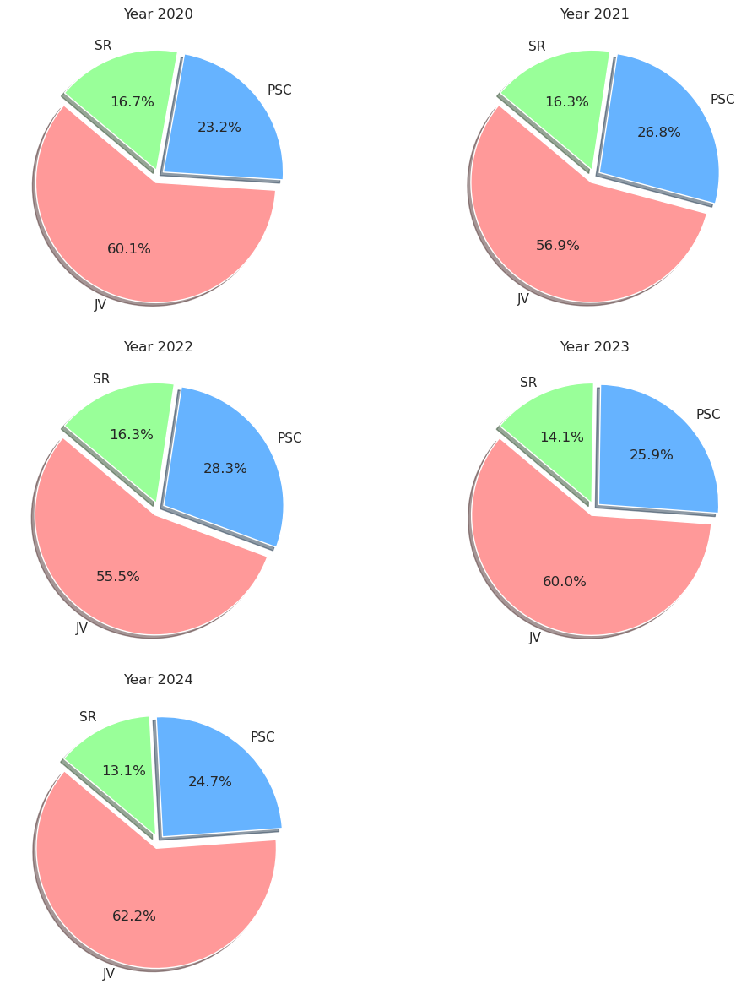

In [101]:
# Calculate daily averages
df2['JV Daily Avg (bpd)'] = df2['JV (mmbbls)'] * 1e6 / days
df2['PSC Daily Avg (bpd)'] = df2['PSC (mmbbls)'] * 1e6 / days
df2['SR Daily Avg (bpd)'] = df2['SR (mmbbls)'] * 1e6 / days

# Calculate total daily average production for each year
df2['Total Daily Avg (bpd)'] = df2[['JV Daily Avg (bpd)', 'PSC Daily Avg (bpd)', 'SR Daily Avg (bpd)']].sum(axis=1)

# Calculate percentage contributions using daily averages
df2['JV Percentage'] = (df2['JV Daily Avg (bpd)'] / df2['Total Daily Avg (bpd)']) * 100
df2['PSC Percentage'] = (df2['PSC Daily Avg (bpd)'] / df2['Total Daily Avg (bpd)']) * 100
df2['SR Percentage'] = (df2['SR Daily Avg (bpd)'] / df2['Total Daily Avg (bpd)']) * 100

# Drop the daily average columns
df2 = df2[['JV Percentage', 'PSC Percentage', 'SR Percentage']]

# Create subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12, 12), subplot_kw=dict(aspect="equal"))

# Flatten the axes array for easy iteration
axs = axs.flatten()

# Plot pie charts
for i, row in df2.reset_index().iterrows():
    sizes = [row['JV Percentage'], row['PSC Percentage'], row['SR Percentage']]
    labels = ['JV', 'PSC', 'SR']
    explode = (0.06, 0.05, 0.05)  # Explode slices slightly for emphasis
    colors = ['#ff9999', '#66b3ff', '#99ff99']  # Custom colors
    axs[i].pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, explode=explode, colors=colors, shadow=True)
    axs[i].set_title(f'Year {int(row["Year"])}')

# Hide the last subplot if there are fewer plots than subplots
for j in range(len(df2), len(axs)):
    axs[j].axis('off')

# Adjust spacing to reduce space between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.2)

plt.tight_layout()
plt.show()


Below, we plot the proportion of production contributed by each terminal, faceted by contract type for each year

In [102]:
prop_df

,Year,TERMINAL/STREAM,Prop,TYPE,CONTRACT
0,2020,ABO,0.008636,Offshore,PSC
1,2020,AGBAMI,0.078184,Offshore,SR
2,2020,AJAPA,0.000889,Offshore,SR
3,2020,AJE,0.001115,Offshore,SR
4,2020,AKPO,0.053073,Offshore,SR
...,...,...,...,...,...
148,2024,UGO OCHA (JONES CREEK),0.009371,Offshore,JV
149,2024,UKPOKITI,0.000000,Offshore,SR
150,2024,USAN,0.016718,Offshore,PSC
151,2024,UTAPATE,0.013025,Offshore,SR


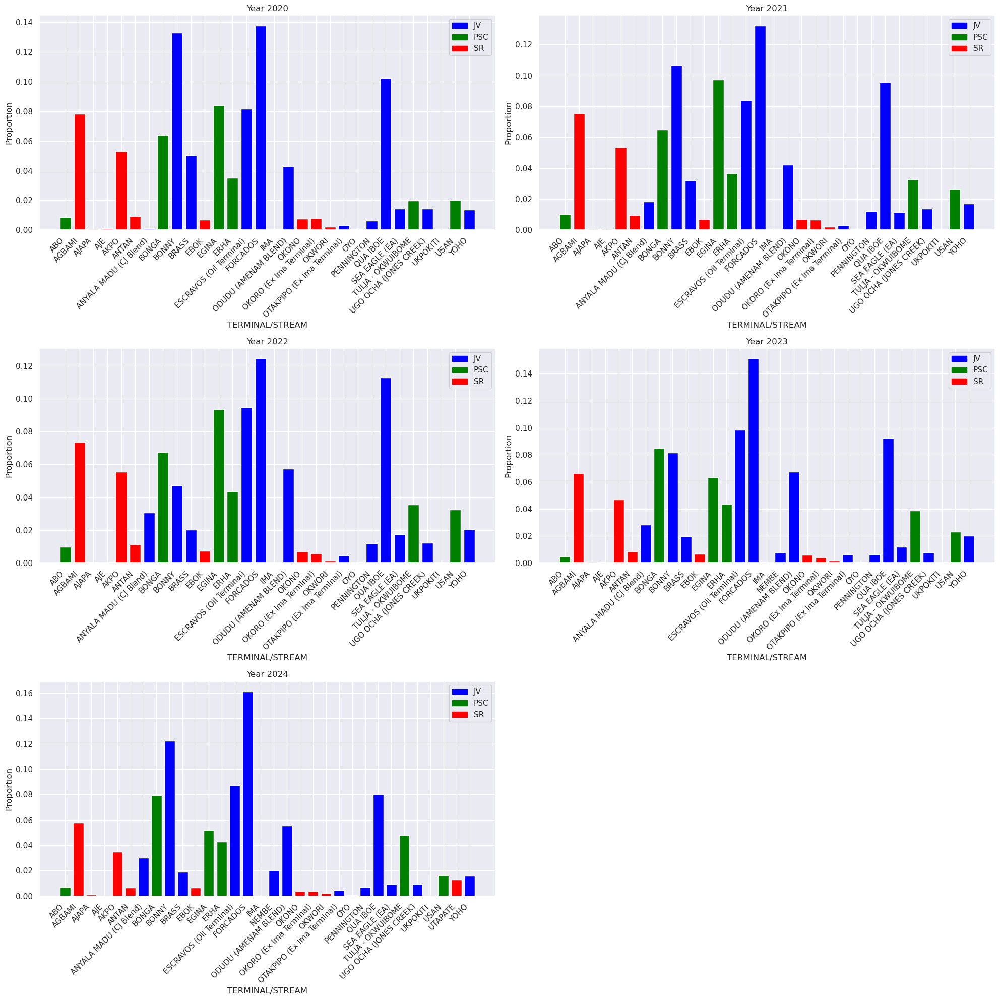

In [103]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(20, 20))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Define colors for each contract type
colors = {'JV': 'blue', 'PSC': 'green', 'SR': 'red'}

# Create custom legend handles
legend_handles = [mpatches.Patch(color=color, label=contract) for contract, color in colors.items()]

# Get unique years
years = prop_df['Year'].unique()

# Loop through each year and plot
for i, year in enumerate(years):
    ax = axes[i]
    year_data = prop_df[prop_df['Year'] == year]
    bars = ax.bar(year_data['TERMINAL/STREAM'], year_data['Prop'], color=year_data['CONTRACT'].map(colors))
    
    ax.set_title(f'Year {year}')
    ax.set_xlabel('TERMINAL/STREAM')
    ax.set_ylabel('Proportion')
    ax.set_xticks(range(len(year_data)))
    ax.set_xticklabels(year_data['TERMINAL/STREAM'], rotation=45, ha='right')
    ax.legend(handles=legend_handles)

# Remove the last empty subplot
fig.delaxes(axes[-1])

# Adjust layout
plt.tight_layout()
plt.show()


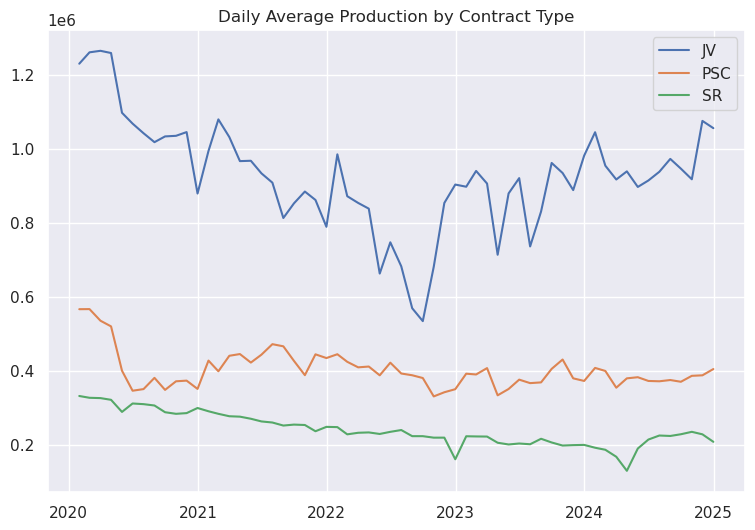

In [104]:
daily_avg_by_contract = df_merge.groupby(['Date', 'CONTRACT'])['Production'].sum()/df_merge.groupby(['Date', 'CONTRACT'])['month_days'].mean().values
daily_avg_by_contract = daily_avg_by_contract.unstack()

# 
fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(daily_avg_by_contract)
plt.title(label='Daily Average Production by Contract Type')
plt.legend(daily_avg_by_contract.columns)

In [105]:
df_merge.head()

,TERMINAL/STREAM,Liquid Type,Date,Production,Year,Month,Month_name,month_days,TYPE,PLATFORM,CAPACITY (Bbls),OPERATOR,CONTRACT
0,QUA IBOE,Crude Oil,2020-01-31,7000066.76,2020,1,January,31,Onshore,Land,8520000,MOBIL,JV
1,QUA IBOE,blend_condensate,2020-01-31,110558.24,2020,1,January,31,Onshore,Land,8520000,MOBIL,JV
2,QUA IBOE,Crude Oil,2020-02-29,6704942.91,2020,2,February,29,Onshore,Land,8520000,MOBIL,JV
3,QUA IBOE,blend_condensate,2020-02-29,111329.09,2020,2,February,29,Onshore,Land,8520000,MOBIL,JV
4,QUA IBOE,Crude Oil,2020-03-31,7281638.22,2020,3,March,31,Onshore,Land,8520000,MOBIL,JV


In [106]:
# Calculate the daily average production for each year, categorized by platform and contract type, 
# in thousand barrels per day (mbpd)

df3 = df_merge.groupby(['Year', 'PLATFORM', 'CONTRACT'])['Production'].sum().unstack().unstack()
df3 = df3.div(days, axis=0).stack()/1e3
df3 = df3.rename(columns={'JV':'JV (mbpd)', 'PSC':'PSC (mbpd)', 'SR':'SR (mbpd)'})
df3

CONTRACT        JV (mbpd)  PSC (mbpd)   SR (mbpd)
Year PLATFORM                                    
2020 FPSO       64.905546  389.042089  291.870861
     FSO       105.030385   36.132115   14.503120
     Land      931.452015         NaN         NaN
2021 FPSO       95.838838  381.349422  250.896038
     FSO        90.952540   52.766090   12.655348
     Land      735.265872         NaN         NaN
2022 FPSO      111.045715  340.657929  213.423578
     FSO        96.254660   49.118921   10.655789
     Land      556.899035         NaN         NaN
2023 FPSO       97.764797  323.650726  196.582247
     FSO       122.507381   57.210778   11.366436
     Land      661.473461         NaN         NaN
2024 FPSO       97.554117  307.935128  189.871781
     FSO       131.047440   74.465464   12.441311
     Land      735.303593         NaN         NaN

## Monthly Analysis

In [107]:
# Filter the DataFrame for the latest month's data and the previous year's data for comparison
year = 2024
month = 12
latest_month_data = df_merge[(df_merge['Year'] == year) & (df_merge['Month'] == month)]
previous_year_data = df_merge[(df_merge['Year'] == (year - 1)) & (df_merge['Month'] == month)]
latest_month_data['Daily Avg. Production'] = latest_month_data['Production']/latest_month_data['month_days']
previous_year_data['Daily Avg. Production'] =  previous_year_data['Production']/previous_year_data['month_days']

/tmp/ipykernel_12330/1655851060.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  latest_month_data['Daily Avg. Production'] = latest_month_data['Production']/latest_month_data['month_days']
/tmp/ipykernel_12330/1655851060.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  previous_year_data['Daily Avg. Production'] =  previous_year_data['Production']/previous_year_data['month_days']


In [108]:
previous_year_data

,TERMINAL/STREAM,Liquid Type,Date,Production,Year,Month,Month_name,month_days,TYPE,PLATFORM,CAPACITY (Bbls),OPERATOR,CONTRACT,Daily Avg. Production
94,QUA IBOE,Crude Oil,2023-12-31,4023223.00,2023,12,December,31,Onshore,Land,8520000,MOBIL,JV,129781.387097
95,QUA IBOE,blend_condensate,2023-12-31,28585.00,2023,12,December,31,Onshore,Land,8520000,MOBIL,JV,922.096774
214,FORCADOS,Crude Oil,2023-12-31,7446093.01,2023,12,December,31,Onshore,Land,6289832,SHELL,JV,240196.548710
215,FORCADOS,blend_condensate,2023-12-31,921256.99,2023,12,December,31,Onshore,Land,6289832,SHELL,JV,29717.967419
334,BONNY,Crude Oil,2023-12-31,5861062.96,2023,12,December,31,Onshore,Land,5700000,SHELL,JV,189066.547097
335,BONNY,blend_condensate,2023-12-31,490918.20,2023,12,December,31,Onshore,Land,5700000,SHELL,JV,15836.070968
454,BRASS,Crude Oil,2023-12-31,636567.00,2023,12,December,31,Onshore,Land,3271000,AGIP,JV,20534.419355
455,BRASS,blend_condensate,2023-12-31,138216.00,2023,12,December,31,Onshore,Land,3271000,AGIP,JV,4458.580645
574,ESCRAVOS (Oil Terminal),Crude Oil,2023-12-31,4035386.00,2023,12,December,31,Onshore,Land,2600000,CHEVRON,JV,130173.741935
575,ESCRAVOS (Oil Terminal),blend_condensate,2023-12-31,56307.00,2023,12,December,31,Onshore,Land,2600000,CHEVRON,JV,1816.354839


In [109]:
# Calculate the total HC production for the given month
total_prod = (latest_month_data['Production'].sum()/1e6).round(2)    # MMbbls (Million barrels)

# Calculate the daily avg production for the given month
daily_avg_prod = (latest_month_data['Daily Avg. Production'].sum()/1e6).round(2)   # MMbbls

# Calculate the total HC production split by Contract type and Plaform for the given month
total_split = latest_month_data.groupby(['Year', 'Month', 'PLATFORM', 'CONTRACT'])['Production'].sum().unstack()

# Calculate the total HC production split by Contract type and Plaform for the given month
daily_avg_split = latest_month_data.groupby(['Year', 'Month', 'PLATFORM', 'CONTRACT'])['Daily Avg. Production'].sum().unstack()

### Current Year Analysis

#### Total Production Analysis

In [110]:
total_prod   # MMbbls

51.69

In [111]:
total_split = total_split.div(1e6).fillna(0)

v_sum = total_split.sum()
v_sum.name = (year, month, 'Total')
h_sum = total_split.sum(axis=1)
h_sum.name = ('Total')
total_split = pd.concat([total_split, pd.DataFrame(v_sum).T])
total_split = pd.concat([total_split, pd.DataFrame(h_sum)], axis=1)
total_split.rename(columns={'JV':'JV (mmbbls)', 'PSC':'PSC (mmbbls)', 'SR':'SR (mmbbls)', 'Total':'Total (mmbbls)'}, inplace=True)
total_split

JV (mmbbls)  PSC (mmbbls)  SR (mmbbls)  Total (mmbbls)
2024 12 FPSO      3.134876     10.004733     6.037402       19.177011
        FSO       3.958096      2.532864     0.404972        6.895932
        Land     25.621414      0.000000     0.000000       25.621414
        Total    32.714386     12.537597     6.442374             NaN

#### Daily Average Production Analysis

In [112]:
# Daily avg Hydrocarbon production
daily_avg_prod        # MMbbls

1.67

In [113]:
# Daily avg Hydrocarbon production for previous year 
daily_avg_prod_pr = (previous_year_data['Daily Avg. Production'].sum()/1e6).round(2)  # MMbbls

In [114]:
daily_avg_prod_pr

1.55

In [115]:
daily_avg_split = (daily_avg_split/1e3).fillna(0)      # mbbls -- thousands of bbl
v_sum = daily_avg_split.sum()
v_sum.name = (year, month, 'Total')
h_sum = daily_avg_split.sum(axis=1)
h_sum.name = ('Total')
daily_avg_split = pd.concat([daily_avg_split, pd.DataFrame(v_sum).T])
daily_avg_split = pd.concat([daily_avg_split, pd.DataFrame(h_sum)], axis=1)
daily_avg_split.rename(columns={'JV':'JV (mbbls/day)', 'PSC':'PSC (mbbls/day)', 
                                'SR':'SR (mbbls/day)', 'Total':'Total (mbbls/day)'}, inplace=True)
daily_avg_split

JV (mbbls/day)  PSC (mbbls/day)  SR (mbbls/day)  \
2024 12 FPSO       101.125032       322.733323      194.754903   
        FSO        127.680516        81.705290       13.063613   
        Land       826.497217         0.000000        0.000000   
        Total     1055.302766       404.438613      207.818516   

               Total (mbbls/day)  
2024 12 FPSO          618.613258  
        FSO           222.449419  
        Land          826.497217  
        Total                NaN

In [116]:
# Integrity check. 
# Daily avg. HC production for Dec 2024 (thousand bbls/day)

daily_avg_split.iloc[3, :].sum()

1667.5598948387099

In [117]:
v_sum     # daily Producton by contract (mbbls/day)

CONTRACT
JV     1055.302766
PSC     404.438613
SR      207.818516
Name: (2024, 12, Total), dtype: float64

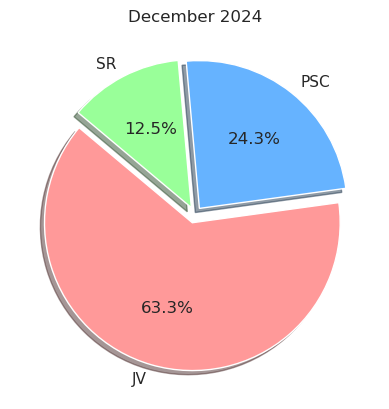

In [118]:
# Calculate percentage contributions by contract
daily_avg_pct = v_sum/v_sum.sum()

# Plot pie charts
labels = ['JV', 'PSC', 'SR']
explode = (0.06, 0.05, 0.05)  # Explode slices slightly 
colors = ['#ff9999', '#66b3ff', '#99ff99']  # Custom colors
month_name = latest_month_data['Month_name'].unique()[0]
plt.pie(daily_avg_pct, labels=labels, autopct='%1.1f%%', startangle=140, explode=explode, colors=colors, shadow=True)
plt.title(f"{month_name} {year}")

plt.show()


In [119]:
# # Calculate the daily Producton by Plaform
h_sum

Year  Month  PLATFORM
2024  12     FPSO        618.613258
             FSO         222.449419
             Land        826.497217
Name: Total, dtype: float64

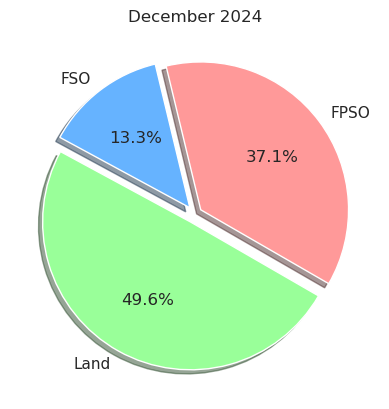

In [120]:
# Calculate percentage contributions by Plaform
daily_avg_pct = h_sum/h_sum.sum()

# Plot pie charts
labels = ['FPSO', 'FSO', 'Land']
explode = (0.05, 0.055, 0.06)  # Explode slices slightly
colors = ['#ff9999', '#66b3ff', '#99ff99']  # Custom colors
month_name = latest_month_data['Month_name'].unique()[0]
plt.pie(daily_avg_pct, labels=labels, autopct='%1.1f%%', startangle=-30, explode=explode, colors=colors, shadow=True)
plt.title(f"{month_name} {year}")

plt.show()

### Previous Year Analysis

#### Total Production Analysis

In [121]:
total_prod_pr = (previous_year_data['Production'].sum()/1e6).round(2)    # MMbbls (millions of bbl)
daily_avg_prod_pr = (previous_year_data['Daily Avg. Production'].sum()/1e6).round(2)    # MMbbls/day

total_split_pr = previous_year_data.groupby(['Year', 'Month', 'PLATFORM', 'CONTRACT'])['Production'].sum().unstack()
daily_avg_split_pr = previous_year_data.groupby(['Year', 'Month', 'PLATFORM', 'CONTRACT'])['Daily Avg. Production'].sum().unstack()

In [122]:
# Total Liquid (HC) Poduction
total_prod_pr      # MMbbls

48.14

In [123]:
total_split_pr = total_split_pr.div(1e6).fillna(0)  # MMbbls Millions of bbls
v_sum = total_split_pr.sum()
v_sum.name = (year-1, month, 'Total')
h_sum = total_split_pr.sum(axis=1)
h_sum.name = ('Total')
total_split_pr = pd.concat([total_split_pr, pd.DataFrame(v_sum).T])
total_split_pr = pd.concat([total_split_pr, pd.DataFrame(h_sum)], axis=1)
total_split_pr.rename(columns={'JV':'JV (mmbbls)', 'PSC':'PSC (mmbbls)', 'SR':'SR (mmbbls)', 'Total':'Total (mmbbls)'}, inplace=True)
total_split_pr

JV (mmbbls)  PSC (mmbbls)  SR (mmbbls)  Total (mmbbls)
2023 12 FPSO      2.597183      9.565086     5.806274       17.968543
        FSO       3.884784      1.977172     0.378847        6.240803
        Land     23.928687      0.000000     0.000000       23.928687
        Total    30.410654     11.542258     6.185121             NaN

#### Daily Average Production Analysis

In [124]:
daily_avg_prod_pr      # MMbbls

1.55

In [125]:
daily_avg_split_pr = (daily_avg_split_pr/1e3).fillna(0)      # convert to thousands of bbl per day (Mbbls/day)
v_sum = daily_avg_split_pr.sum()
v_sum.name = (year-1, month, 'Total')
h_sum = daily_avg_split_pr.sum(axis=1)
h_sum.name = ('Total')
daily_avg_split_pr = pd.concat([daily_avg_split_pr, pd.DataFrame(v_sum).T])
daily_avg_split_pr = pd.concat([daily_avg_split_pr, pd.DataFrame(h_sum)], axis=1)
daily_avg_split_pr.rename(columns={'JV':'JV (mbbls/day)', 'PSC':'PSC (mbbls/day)', 'SR':'SR (mbbls/day)', 'Total':'Total (mbbls/day)'}, inplace=True)
daily_avg_split_pr

JV (mbbls/day)  PSC (mbbls/day)  SR (mbbls/day)  \
2023 12 FPSO        83.780097       308.551161      187.299161   
        FSO        125.315613        63.779742       12.220871   
        Land       771.893134         0.000000        0.000000   
        Total      980.988844       372.330903      199.520032   

               Total (mbbls/day)  
2023 12 FPSO          579.630419  
        FSO           201.316226  
        Land          771.893134  
        Total                NaN

In [126]:
# Total Production by Contract
v_sum

CONTRACT
JV     980.988844
PSC    372.330903
SR     199.520032
Name: (2023, 12, Total), dtype: float64

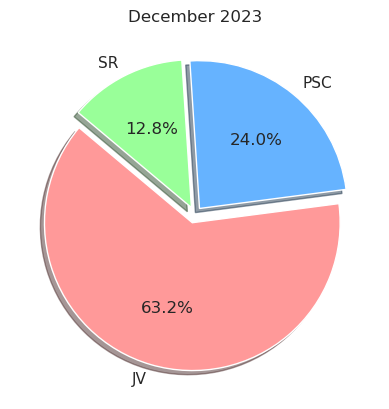

In [127]:
# Calculate percentage contributions by contract
daily_avg_pct = v_sum/v_sum.sum()

# Plot pie charts
labels = ['JV', 'PSC', 'SR']
explode = (0.06, 0.05, 0.05)  # Explode slices slightly for emphasis
colors = ['#ff9999', '#66b3ff', '#99ff99']  # Custom colors
month_name = previous_year_data['Month_name'].unique()[0]
plt.pie(daily_avg_pct, labels=labels, autopct='%1.1f%%', startangle=140, explode=explode, colors=colors, shadow=True)
plt.title(f"{month_name} {year-1}")

plt.show()

In [128]:
# Total Production by Platform
h_sum

Year  Month  PLATFORM
2023  12     FPSO        579.630419
             FSO         201.316226
             Land        771.893134
Name: Total, dtype: float64

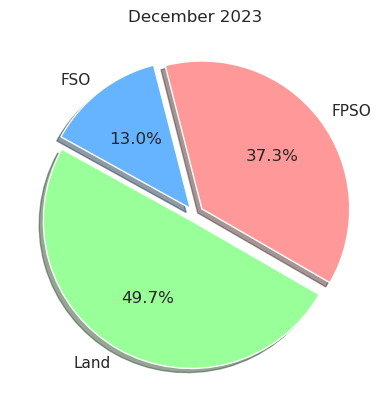

In [129]:
# Calculate percentage contributions by Platform
daily_avg_pct = h_sum/h_sum.sum()

# Plot pie charts
labels = ['FPSO', 'FSO', 'Land']
explode = (0.06, 0.05, 0.05)  # Explode slices slightly for emphasis
colors = ['#ff9999', '#66b3ff', '#99ff99']  # Custom colors
month_name = previous_year_data['Month_name'].unique()[0]
plt.pie(daily_avg_pct, labels=labels, autopct='%1.1f%%', startangle=-30, explode=explode, colors=colors, shadow=True)
plt.title(f"{month_name} {year-1}")

plt.show()

### Year-on-Year (y-o-y) Analysis

In [130]:
daily_avg_prod

1.67

In [131]:
daily_avg_prod_pr

1.55

In [132]:
# Y-o-Y Hydrocarbon production
daily_avg_prod_yoy = (daily_avg_prod - daily_avg_prod_pr)/daily_avg_prod_pr * 100
daily_avg_prod_yoy.round(2)

7.74

#### By Liquid Type

In [133]:
# Crude oil
daily_avg_prod_oil = latest_month_data.query("`Liquid Type` == 'Crude Oil'")['Daily Avg. Production'].sum()/1e6  
daily_avg_prod_oil_pr = previous_year_data.query("`Liquid Type` == 'Crude Oil'")['Daily Avg. Production'].sum()/1e6  
print(f"{daily_avg_prod_oil:.2f}")
print(f"{daily_avg_prod_oil_pr:.2f}")

1.48
1.34


In [134]:
# Year-on-Year for oil
(daily_avg_prod_oil - daily_avg_prod_oil_pr)/daily_avg_prod_oil_pr

0.11196775026821243

In [135]:
# Blended Condensate
daily_avg_prod_bc = latest_month_data.query("`Liquid Type` == 'blend_condensate'")['Daily Avg. Production'].sum()/1e6  
daily_avg_prod_bc_pr = previous_year_data.query("`Liquid Type` == 'blend_condensate'")['Daily Avg. Production'].sum()/1e6  
print(f"{daily_avg_prod_bc:.3f}")
print(f"{daily_avg_prod_bc_pr:.3f}")

0.049
0.053


In [136]:
# Year-on-Year for Blended Condensate
(daily_avg_prod_bc - daily_avg_prod_bc_pr)/daily_avg_prod_bc_pr

-0.0715157584498522

In [137]:
# Condensate
daily_avg_prod_con = latest_month_data.query("`Liquid Type` == 'Condensate'")['Daily Avg. Production'].sum()/1e6  
daily_avg_prod_con_pr = previous_year_data.query("`Liquid Type` == 'Condensate'")['Daily Avg. Production'].sum()/1e6  
print(f"{daily_avg_prod_con:.3f}")
print(f"{daily_avg_prod_con_pr:.3f}")

0.134
0.165


In [138]:
# Year-on-Year for Condensate
(daily_avg_prod_con - daily_avg_prod_con_pr)/daily_avg_prod_con_pr

-0.18808600449419893

#### By Contract and Platform

To calculate the year-over-year (y-o-y) change for Contracts and Platform, we first need to remove the outer index levels. This allows us to perform the standard y-o-y percentage change formula:
$$\frac{\text{latest} - \text{previous}}{\text{previous}}
$$


In [139]:
daily_avg_split.droplevel([0, 1])   # drop the index of the year and date respectively

,JV (mbbls/day),PSC (mbbls/day),SR (mbbls/day),Total (mbbls/day)
FPSO,101.125032,322.733323,194.754903,618.613258
FSO,127.680516,81.705290,13.063613,222.449419
Land,826.497217,0.000000,0.000000,826.497217
Total,1055.302766,404.438613,207.818516,NaN


In [140]:
daily_avg_split_pr.droplevel([0, 1])

,JV (mbbls/day),PSC (mbbls/day),SR (mbbls/day),Total (mbbls/day)
FPSO,83.780097,308.551161,187.299161,579.630419
FSO,125.315613,63.779742,12.220871,201.316226
Land,771.893134,0.000000,0.000000,771.893134
Total,980.988844,372.330903,199.520032,NaN


In [141]:
yoy_split = (daily_avg_split.droplevel([0, 1]) - daily_avg_split_pr.droplevel([0, 1]))/daily_avg_split_pr.droplevel([0, 1])
yoy_split.fillna('-')

,JV (mbbls/day),PSC (mbbls/day),SR (mbbls/day),Total (mbbls/day)
FPSO,0.207029,0.045964,0.039807,0.067255
FSO,0.018872,0.281054,0.068959,0.104975
Land,0.070740,-,-,0.07074
Total,0.075754,0.086234,0.041592,-


# Gas Analysis

In [142]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calendar

sns.set()

In [143]:
directory = "../datasets/nuprc_prod_data/"
# Read the all Excel data file into a DataFrame
dfs = []
# Loop through each file in the directory
for file in os.listdir(directory + 'gas'):
    # Construct the full file path
    file_path = os.path.join(directory + 'gas', file)
    
    # Check if it's an Excel file (you can add more checks for specific extensions)
    if file.endswith('.xlsx') or file.endswith('.xls'):
        # Read the Excel file, skipping the first 2 rows
        df = pd.read_excel(file_path)
        df = df.iloc[0:12]
        dfs.append(df)
        
gas_df = pd.concat(dfs).rename(columns={'MONTHS':'Date'})
gas_df['Date'] = gas_df['Date'].apply(pd.Timestamp)
# Extract year and month for further analysis
gas_df['Year'] = gas_df['Date'].dt.year
gas_df['Month'] = gas_df['Date'].dt.month
gas_df['Month_name'] = gas_df['Date'].dt.month_name()
gas_df.sort_values('Date', inplace=True)

# Trim data to end Dec 2024
ytd = pd.Timestamp('2024-12-31')
gas_df = gas_df[gas_df['Date'] <= ytd]
# Function to get the number of days in a given month of a given year
def get_days_in_month(year, month):
    return calendar.monthrange(year, month)[1]

# Apply the function to each row
gas_df['month_days'] = gas_df.apply(lambda row: get_days_in_month(row['Year'], row['Month']), axis=1)
gas_df.tail(10)


,Date,AG PRODUCTION (MMSCF),NAG PRODUCTION (MMSCF),TOTAL GAS PRODUCTION (MMSCF),FIELD USE (MMSCF),DOMESTIC SALES (MMSCF),EXPORT SALES (MMSCF),TOTAL GAS UTILISED (MMSCF),% UTILIZED,TOTAL GAS FLARED (MMSCF),% FLARED,GAS SHRINKAGE,Year,Month,Month_name,month_days
2,2024-03-31,112544.138204,85809.486736,198353.624940,61533.752664,53857.682972,67675.847809,183067.283445,0.922934,15149.475528,0.076376,1.368660e+02,2024,3,March,31
3,2024-04-30,109921.293245,79872.962302,189794.255547,57235.181234,52795.515081,65120.995396,175151.691710,0.922850,14379.467788,0.075763,2.630960e+02,2024,4,April,30
4,2024-05-31,117632.664511,83859.817852,201492.482363,60896.126750,55496.720974,70483.054811,186875.902536,0.927458,14109.447388,0.070025,5.071324e+02,2024,5,May,31
5,2024-06-30,114939.805038,86963.656739,201903.461778,60335.687899,52979.844490,74076.240798,187391.773187,0.928126,14281.549681,0.070735,2.301389e+02,2024,6,June,30
6,2024-07-31,124233.619932,99489.754914,223723.374845,68327.159098,59590.718117,80140.123267,208058.000482,0.929979,15301.852798,0.068396,3.635216e+02,2024,7,July,31
7,2024-08-31,117395.887757,95192.751324,212588.639081,61189.032861,53957.270333,81328.253847,196474.557042,0.924201,15843.469219,0.074526,2.706128e+02,2024,8,August,31
8,2024-09-30,113511.107813,90983.765134,204494.872947,57208.931129,56867.209211,75571.941454,189648.081794,0.927398,14618.619491,0.071486,2.281717e+02,2024,9,September,30
9,2024-10-31,134524.074972,85870.077598,220396.447260,66728.963868,64895.285837,70698.824041,202323.073746,0.917996,18073.373514,0.082004,6.548362e-11,2024,10,October,31
10,2024-11-30,134000.239256,92800.967106,226747.045762,65192.169447,63097.235104,80391.744949,208681.149501,0.920326,18065.681791,0.079673,2.144700e-01,2024,11,November,30
11,2024-12-31,123078.042369,92246.403108,215324.445476,53084.968018,66986.504657,76186.300804,196257.773480,0.911451,19066.671996,0.088549,4.620233e-10,2024,12,December,31


### Condensate and Associated Gas Production Analysis: 
**Objective:**
This analysis examines the relationship between daily average condensate and associated gas (AG) production, recognizing that AG is a byproduct of crude extraction. Trends in AG production can reflect reservoir behavior (Gas-Oil ratio), production strategies, or operational adjustments.  

**Key Steps**:  
- **Data Processing:** Extract and preprocess daily average condensate and AG production.  
- **Visualization:** Generate time series plots to analyze trends and correlations.  
- **Trend Analysis:** Assess how AG fluctuations align with condensate production, indicating potential shifts in crude output or reservoir conditions.  
- **Interpretation:** Variations in AG may signal changes in crude production, reservoir pressure, or operational interventions affecting gas-to-liquid ratios.

In [144]:
all_condensate = df_merge.query("`Liquid Type` != 'Crude Oil'")
# Trim data to start from Jan 2021
start = pd.Timestamp('2021-01-01')
all_condensate = all_condensate[all_condensate['Date'] >= start]
daily_avg_all_condensate = all_condensate.groupby(['Year','Month', 'Date'])["Production"].sum()/all_condensate.groupby(['Year','Month'])['month_days'].mean().values
daily_avg_all_condensate = daily_avg_all_condensate.reset_index().set_index('Date')

In [145]:
daily_avg_all_condensate.head()

,Year,Month,Production
Date,,,
2021-01-31,2021,1,350331.383784
2021-02-28,2021,2,337031.392857
2021-03-31,2021,3,319860.580648
2021-04-30,2021,4,314685.311667
2021-05-31,2021,5,314794.272688


In [146]:
daily_avg_ag = gas_df.groupby(['Year','Month', 'Date'])["AG PRODUCTION (MMSCF)"].sum()/gas_df.groupby(['Year','Month'])['month_days'].mean().values
daily_avg_ag = daily_avg_ag.reset_index().set_index('Date')
daily_avg_ag.head()

,Year,Month,AG PRODUCTION (MMSCF)
Date,,,
2021-01-31,2021,1,3787.591983
2021-02-28,2021,2,4242.366964
2021-03-31,2021,3,4143.588697
2021-04-30,2021,4,4132.252655
2021-05-31,2021,5,4001.044765


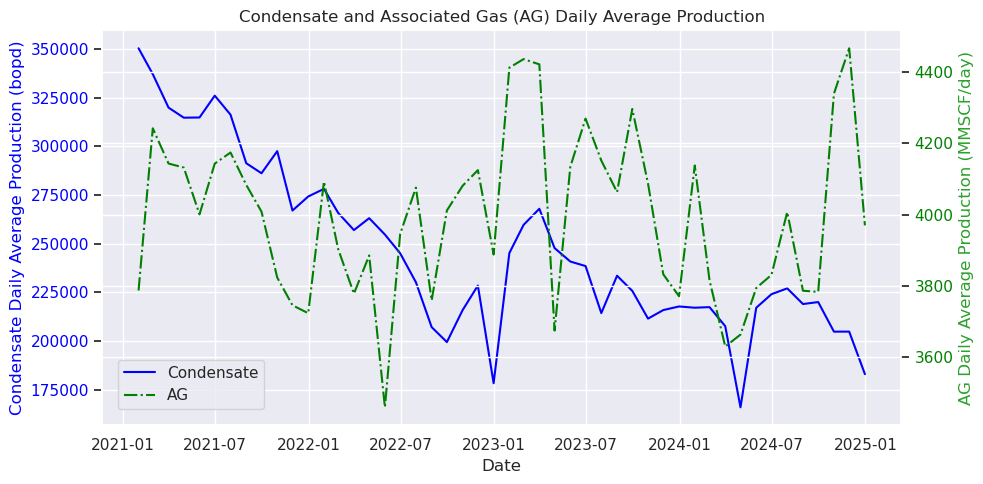

In [147]:
# First plot
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.plot(daily_avg_all_condensate['Production'], color='blue', label='Condensate')
ax1.set_xlabel('Date')
ax1.set_ylabel('Condensate Daily Average Production (bopd)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title("Condensate and Associated Gas (AG) Daily Average Production")

# Second plot with twinx
ax2 = ax1.twinx()
ax2.plot(daily_avg_ag["AG PRODUCTION (MMSCF)"], color='green', ls='-.', label='AG')
ax2.set_ylabel('AG Daily Average Production (MMSCF/day)', color='tab:green')
ax2.tick_params(axis='y', labelcolor='green')

# Add a legend to differentiate the series
fig.tight_layout()  # Adjust layout to make room for the legend
fig.legend(loc='lower right', bbox_to_anchor=(0.28, 0.15))

plt.show()

### Total Gas Production Analysis (2021–2024)

**Objective:**
This section analyzes total gas production using NUPRC data from 2021 to 2024. It covers **Associated Gas (AG) vs. Non-Associated Gas (NAG)** and gas utilization categories: **field use, domestic sales, export sales, flared gas, and shrinkage**.  

**Key Steps:**  
1. **Total Production Calculation** – Compute total AG, NAG, and usage breakdown for 2021 to 2024.  
2. **Visualization** – Use pie charts to show AG vs. NAG and gas utilization distribution.  
3. **Trend Analysis** – Plot time series for production and usage trends.  
4. **Daily Averages** – Convert totals to daily averages and analyze trends.  

This helps track production patterns and utilization efficiency.

In [148]:
gas_df.columns

Index(['Date', 'AG PRODUCTION (MMSCF)', 'NAG PRODUCTION (MMSCF)',
       'TOTAL GAS PRODUCTION (MMSCF)', 'FIELD USE (MMSCF)',
       'DOMESTIC SALES (MMSCF)', 'EXPORT SALES (MMSCF)',
       'TOTAL GAS UTILISED (MMSCF)', '% UTILIZED', 'TOTAL GAS FLARED (MMSCF)',
       '% FLARED', 'GAS SHRINKAGE', 'Year', 'Month', 'Month_name',
       'month_days'],
      dtype='object')

In [149]:
# Select key columns 
columns = ['AG PRODUCTION (MMSCF)', 'NAG PRODUCTION (MMSCF)', 'FIELD USE (MMSCF)' , 'DOMESTIC SALES (MMSCF)',
           'EXPORT SALES (MMSCF)', 'TOTAL GAS FLARED (MMSCF)', 'GAS SHRINKAGE',]

In [150]:
import plotly.graph_objects as go
def plot_pie(data, title):
    # Extracting keys and values from the dictionary
    labels = list(data.keys())
    values = list(data.values())
    
    # Creating a doughnut pie chart with thick edges
    fig = go.Figure(data=[go.Pie(
        labels=labels,
        values=values,
        hole=0.4,  # This creates the doughnut hole in the middle
        marker=dict(
            line=dict(
                color='cyan',  # Edge color
                width=0.8  # Edge width
            )
        )
    )])
    
    # Updating the layout
    fig.update_layout(
        title_text=title,
        width=650,  # Width of the figure
        height=550
    )
    
    # Display the chart
    fig.show()


In [151]:
data_all_yr = {}
for col in columns[:2]:  # AG and NAG
    data_all_yr[col] = gas_df[col].sum()
data_all_yr

{'AG PRODUCTION (MMSCF)': 5836727.681766909,
 'NAG PRODUCTION (MMSCF)': 4428636.028261852}

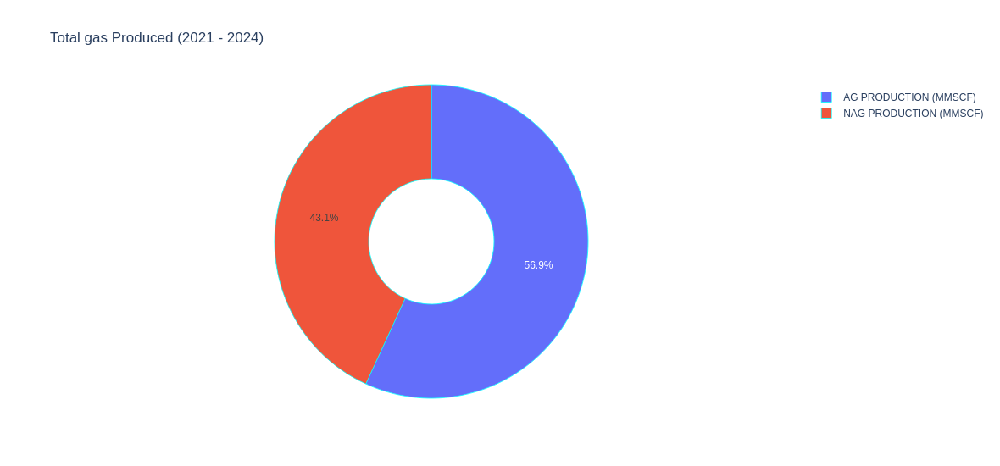

In [152]:
plot_pie(data_all_yr, title='Total gas Produced (2021 - 2024)')

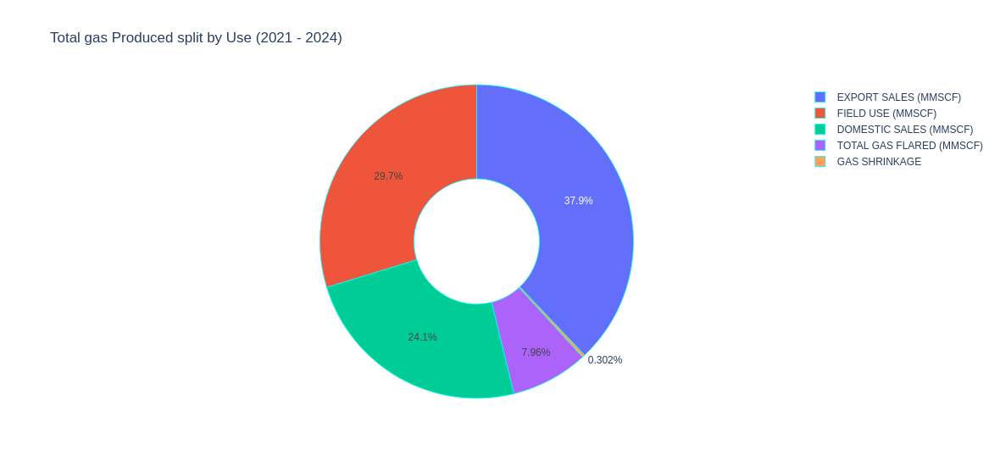

In [153]:
data_all_yr_by_use = {}
for col in columns[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    data_all_yr_by_use[col] = gas_df[col].sum()
plot_pie(data_all_yr_by_use, title='Total gas Produced split by Use (2021 - 2024)')


Next, we calculate production for each year

In [154]:
gas_2021 = gas_df.query("`Year` == 2021")
gas_2022 = gas_df.query("`Year` == 2022")
gas_2023 = gas_df.query("`Year` == 2023")
gas_2024 = gas_df.query("`Year` == 2024")

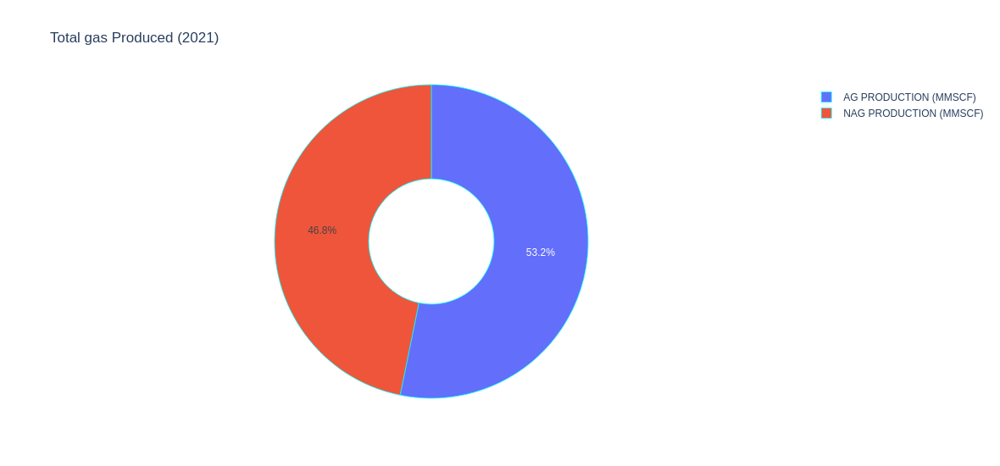

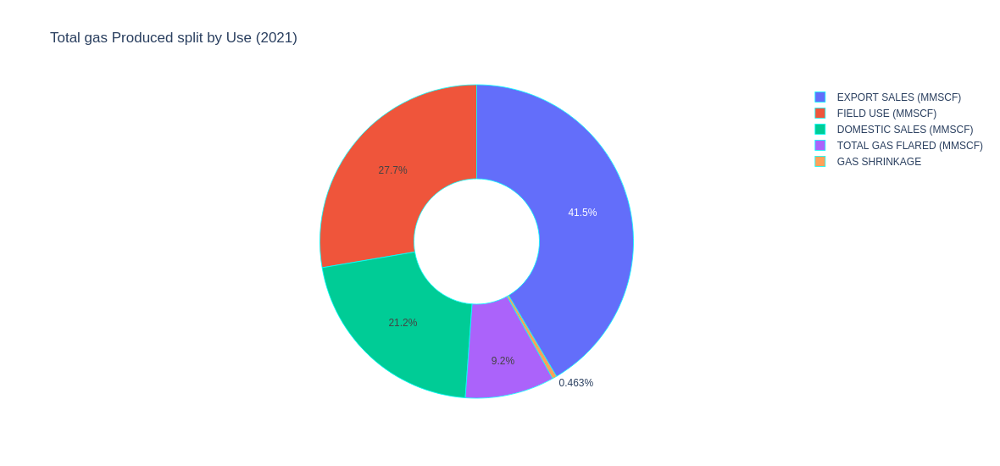

In [155]:
data_2021 = {}
for col in columns[:2]:  
    data_2021[col] = gas_2021[col].sum()
plot_pie(data_2021, title='Total gas Produced (2021)')

data_2021_by_use = {}
for col in columns[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    data_2021_by_use[col] = gas_2021[col].sum()
plot_pie(data_2021_by_use, title='Total gas Produced split by Use (2021)')


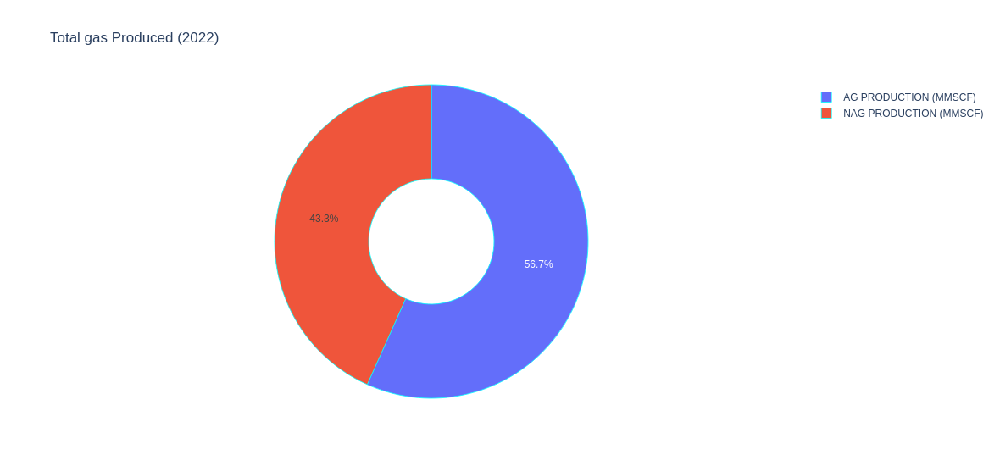

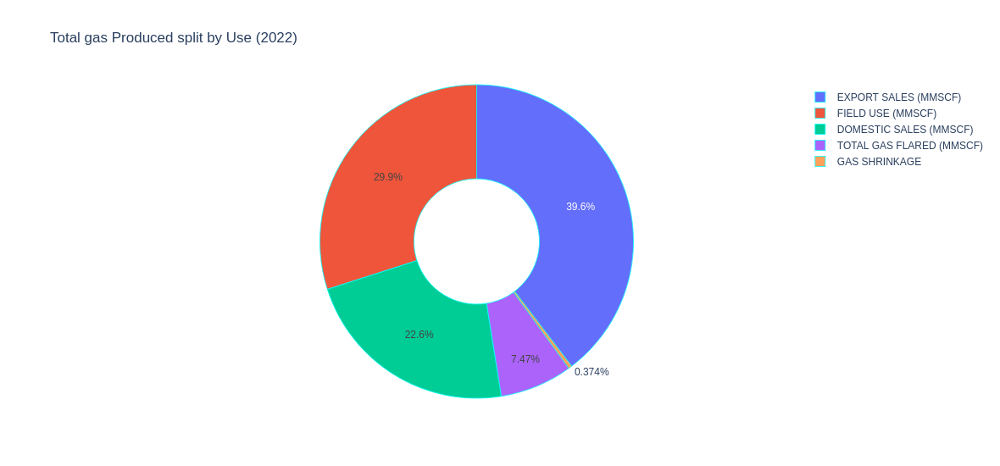

In [156]:
data_2022 = {}
for col in columns[:2]:  
    data_2022[col] = gas_2022[col].sum()
plot_pie(data_2022, title='Total gas Produced (2022)')

data_2022_by_use = {}
for col in columns[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    data_2022_by_use[col] = gas_2022[col].sum()
plot_pie(data_2022_by_use, title='Total gas Produced split by Use (2022)')


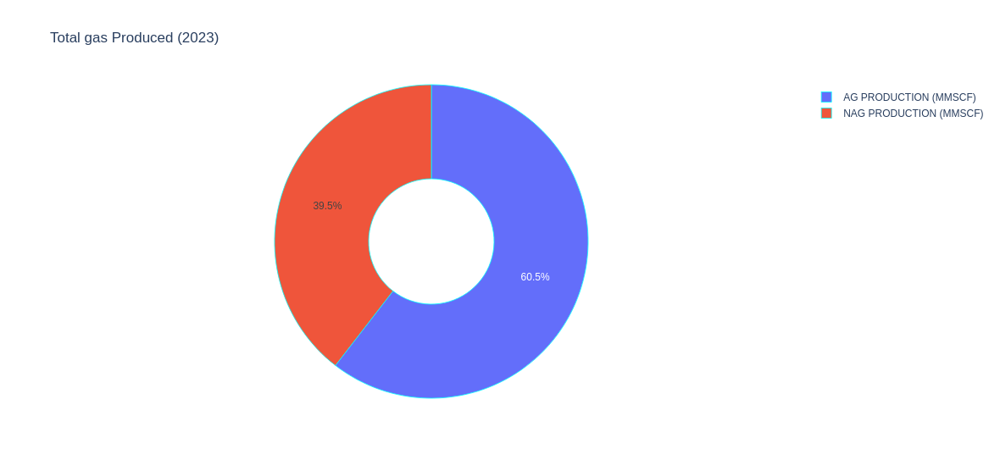

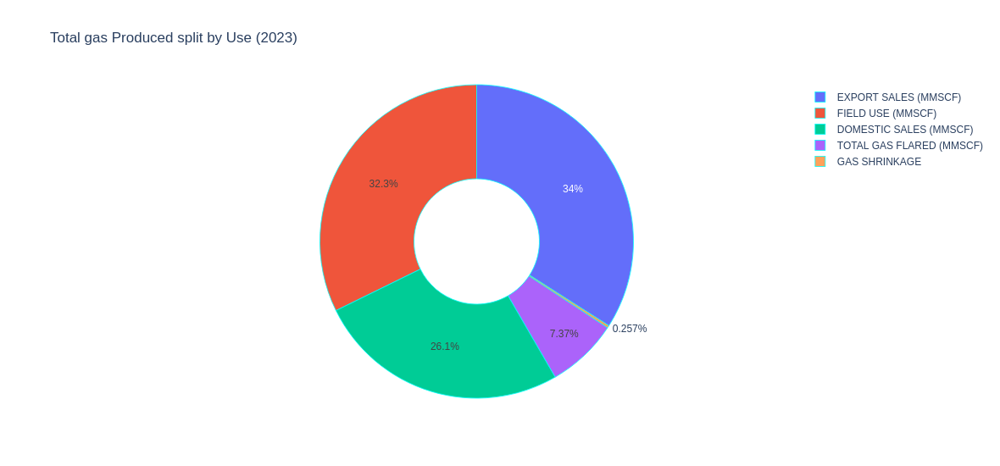

In [157]:
data_2023 = {}
for col in columns[:2]:  
    data_2023[col] = gas_2023[col].sum()
plot_pie(data_2023, title='Total gas Produced (2023)')

data_2023_by_use = {}
for col in columns[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    data_2023_by_use[col] = gas_2023[col].sum()
plot_pie(data_2023_by_use, title='Total gas Produced split by Use (2023)')


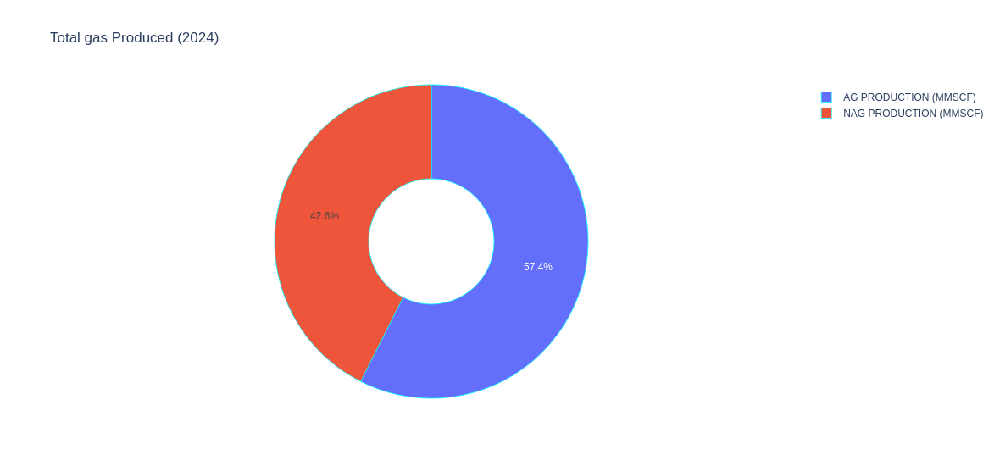

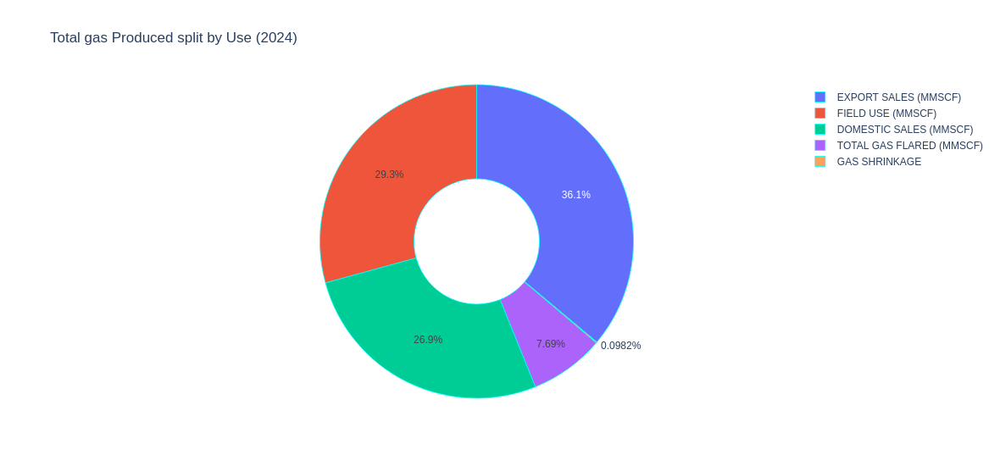

In [158]:
data_2024 = {}
for col in columns[:2]:  
    data_2024[col] = gas_2024[col].sum()
plot_pie(data_2024, title='Total gas Produced (2024)')

data_2024_by_use = {}
for col in columns[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    data_2024_by_use[col] = gas_2024[col].sum()
plot_pie(data_2024_by_use, title='Total gas Produced split by Use (2024)')


Lets combine all these data into a table for easy presentation

In [159]:
df_comb = pd.DataFrame([data_2021, data_2022, data_2023, data_2024], index=gas_df.Year.unique())

In [160]:
df_comb

,AG PRODUCTION (MMSCF),NAG PRODUCTION (MMSCF)
2021,1.459589e+06,1.284724e+06
2022,1.429626e+06,1.091616e+06
2023,1.506770e+06,9.847115e+05
2024,1.440742e+06,1.067585e+06


In [161]:
# Convert annual totals from MMSCF to TCF (1 TCF = 1e6 MMSCF)
df_comb['AG PRODUCTION (TCF)'] = df_comb['AG PRODUCTION (MMSCF)'] / 1e6
df_comb['NAG PRODUCTION (TCF)'] = df_comb['NAG PRODUCTION (MMSCF)'] / 1e6

# Calculate daily averages in BCF (1 BCF = 1e3 MMSCF)
df_comb['AG Daily Avg (BCF/d)'] = df_comb['AG PRODUCTION (MMSCF)'].div(days) / 1e3
df_comb['NAG Daily Avg (BCF/d)'] = df_comb['NAG PRODUCTION (MMSCF)'].div(days) / 1e3

# Reorder columns
df_comb = df_comb[['AG PRODUCTION (TCF)', 'AG Daily Avg (BCF/d)', 
         'NAG PRODUCTION (TCF)', 'NAG Daily Avg (BCF/d)']]
df_comb


,AG PRODUCTION (TCF),AG Daily Avg (BCF/d),NAG PRODUCTION (TCF),NAG Daily Avg (BCF/d)
2021,1.459589,3.998874,1.284724,3.519791
2022,1.429626,3.916784,1.091616,2.990728
2023,1.506770,4.128137,0.984712,2.697840
2024,1.440742,3.936455,1.067585,2.916899


In [162]:
df_use_comb = pd.DataFrame([data_2021_by_use, data_2022_by_use,data_2023_by_use,data_2024_by_use], 
             index=gas_df.Year.unique())

In [163]:
df_use_comb

,FIELD USE (MMSCF),DOMESTIC SALES (MMSCF),EXPORT SALES (MMSCF),TOTAL GAS FLARED (MMSCF),GAS SHRINKAGE
2021,759483.249793,580892.507331,1.138645e+06,252579.363648,12712.658785
2022,754791.442503,569328.577051,9.992514e+05,188442.443743,9428.075230
2023,803991.823836,649929.591558,8.477546e+05,183525.930942,6397.209713
2024,733939.407800,673644.813430,9.053419e+05,192887.062937,2462.417056


In [164]:
# Convert annual totals from MMSCF to TCF (1 TCF = 1e6 MMSCF)
df_use_comb['FIELD USE (TCF)'] = df_use_comb['FIELD USE (MMSCF)'] / 1e6
df_use_comb['DOMESTIC SALES (TCF)'] = df_use_comb['DOMESTIC SALES (MMSCF)'] / 1e6
df_use_comb['EXPORT SALES (TCF)'] = df_use_comb['EXPORT SALES (MMSCF)'] / 1e6
df_use_comb['TOTAL GAS FLARED (TCF)'] = df_use_comb['TOTAL GAS FLARED (MMSCF)'] / 1e6
df_use_comb['GAS SHRINKAGE (TCF)'] = df_use_comb['GAS SHRINKAGE'] / 1e6

# Calculate daily averages in BCF (1 BCF = 1e3 MMSCF)
df_use_comb['FIELD USE Daily Avg (BCF/d)'] = df_use_comb['FIELD USE (MMSCF)'].div(days) / 1e3
df_use_comb['DOMESTIC SALES Daily Avg (BCF/d)'] = df_use_comb['DOMESTIC SALES (MMSCF)'].div(days) / 1e3
df_use_comb['EXPORT SALES Daily Avg (BCF/d)'] = df_use_comb['EXPORT SALES (MMSCF)'].div(days) / 1e3
df_use_comb['TOTAL GAS FLARED Daily Avg (BCF/d)'] = df_use_comb['TOTAL GAS FLARED (MMSCF)'].div(days) / 1e3
df_use_comb['GAS SHRINKAGE Daily Avg (BCF/d)'] = df_use_comb['GAS SHRINKAGE'].div(days) / 1e3

# Reorder columns
df_use_total = df_use_comb[['FIELD USE (TCF)', 'DOMESTIC SALES (TCF)', 'EXPORT SALES (TCF)', 
               'TOTAL GAS FLARED (TCF)', 'GAS SHRINKAGE (TCF)', ]]

df_use_avg = df_use_comb[['FIELD USE Daily Avg (BCF/d)', 'DOMESTIC SALES Daily Avg (BCF/d)', 
          'EXPORT SALES Daily Avg (BCF/d)', 'TOTAL GAS FLARED Daily Avg (BCF/d)', 
          'GAS SHRINKAGE Daily Avg (BCF/d)']]


In [165]:
df_use_total

,FIELD USE (TCF),DOMESTIC SALES (TCF),EXPORT SALES (TCF),TOTAL GAS FLARED (TCF),GAS SHRINKAGE (TCF)
2021,0.759483,0.580893,1.138645,0.252579,0.012713
2022,0.754791,0.569329,0.999251,0.188442,0.009428
2023,0.803992,0.649930,0.847755,0.183526,0.006397
2024,0.733939,0.673645,0.905342,0.192887,0.002462


In [166]:
df_use_avg

,FIELD USE Daily Avg (BCF/d),DOMESTIC SALES Daily Avg (BCF/d),EXPORT SALES Daily Avg (BCF/d),TOTAL GAS FLARED Daily Avg (BCF/d),GAS SHRINKAGE Daily Avg (BCF/d)
2021,2.080776,1.591486,3.119575,0.691998,0.034829
2022,2.067922,1.559804,2.737675,0.516281,0.025830
2023,2.202717,1.780629,2.322615,0.502811,0.017527
2024,2.005299,1.840560,2.473612,0.527014,0.006728


Next, we'll Plot production trend across years

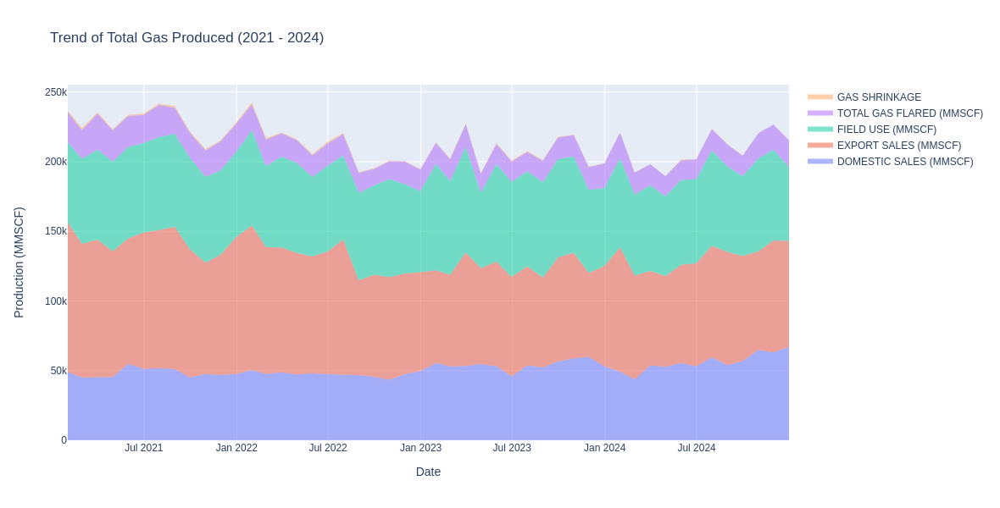

In [167]:
dates = daily_avg_ag.index
series_1 = gas_df['DOMESTIC SALES (MMSCF)']
series_2 = gas_df['EXPORT SALES (MMSCF)']
series_3 = gas_df['FIELD USE (MMSCF)']
series_4 = gas_df['TOTAL GAS FLARED (MMSCF)']
series_5 = gas_df['GAS SHRINKAGE']


 # Creating the area chart
fig = go.Figure()

# Adding the first series (AG Production)
fig.add_trace(go.Scatter(
    x=dates,
    y=series_1,
    fill='tozeroy',  # Fill to the y=0 line
    # fillcolor='rgba(70, 100, 250, 0.7)',
    mode='none',  # No markers or lines
    name='DOMESTIC SALES (MMSCF)'
))

# Adding the second series (NAG Production)
fig.add_trace(go.Scatter(
    x=dates,
    y=series_1 + series_2,
    fill='tonexty',  # Fill to the next y value
    # fillcolor='rgba(240, 65, 60, 0.7)',
    mode='none',  # No markers or lines
    name='EXPORT SALES (MMSCF)'

))

# Adding the second series (NAG Production)
fig.add_trace(go.Scatter(
    x=dates,
    y=series_1 + series_2 + series_3 ,
    fill='tonexty',  # Fill to the next y value
    # fillcolor='rgba(240, 65, 60, 0.7)',
    mode='none',  # No markers or lines
    name='FIELD USE (MMSCF)'

))

# Adding the second series (NAG Production)
fig.add_trace(go.Scatter(
    x=dates,
    y=series_1 + series_2 + series_3 + series_4,
    fill='tonexty',  # Fill to the next y value
    # fillcolor='rgba(240, 65, 60, 0.7)',
    mode='none',  # No markers or lines
    name='TOTAL GAS FLARED (MMSCF)'

))

# Adding the second series (NAG Production)
fig.add_trace(go.Scatter(
    x=dates,
    y=series_1 + series_2 + series_3 + series_4 + series_5,
    fill='tonexty',  # Fill to the next y value
    # fillcolor='rgba(240, 65, 60, 0.7)',
    mode='none',  # No markers or lines
    name='GAS SHRINKAGE'

))
# Updating the layout to set the figure size and titles
fig.update_layout(
    title_text='Trend of Total Gas Produced (2021 - 2024)',
    xaxis_title='Date',
    yaxis_title='Production (MMSCF)',
    width=1000,  # Width of the figure
    height=600  # Height of the figure
)

# Display the chart
fig.show()

**Note:**  
Before moving to the daily average calculation, we incorporate historical data from DPR (2001–2020) for continuity. DPR is now [defunct](https://www.google.com/url?sa=t&source=web&rct=j&opi=89978449&url=https://neiti.gov.ng/cms/wp-content/uploads/2022/08/Legal-and-Institutional-Framework-Contracts-and-Licenses-2020.docx&ved=2ahUKEwi4guHt5feLAxXtWUEAHYGdFxAQFnoECBQQAw&usg=AOvVaw0hshRXt44SVmdrm0K3zNZN), split into NUPRC and NMDPRA.

In [168]:
dpr = pd.read_csv("../datasets/DPR_Historical_Gas_Daily_Avg_Production.csv")
dpr.tail()

,Year,NAG PRODUCTION (MMSCF/day),AG PRODUCTION (MMSCF/day),FIELD USE (MMSCF/day),DOMESTIC SALES (MMSCF/day),EXPORT SALES (MMSCF/day),TOTAL GAS FLARED (MMSCF/day)
15,2016,3263,4147,2493.14,1047.20,3071.59,791.46
16,2017,3389,4660,2510.48,1179.22,3413.65,888.20
17,2018,3267,4703,2566.38,1087.95,3406.44,880.25
18,2019,3256,5090,2897.04,1170.93,3427.97,849.70
19,2020,3629,4382,2695.45,1226.30,3412.93,698.74


The DPR historical data ends in 2020, while the NUPRC gas data begins thereafter. To ensure continuity, the NUPRC data is aggregated to yearly averages, aligning with the DPR dataset, before concatenating both data.

In [169]:
# define a function to convert the production values of a given column to the daily avg
def get_daily_avg(df, column, mean=False):
    daily_avg = df.groupby(['Year','Month', 'Date'])[column].sum()/df.groupby(['Year','Month'])['month_days'].mean().values
    daily_avg = daily_avg.reset_index().set_index('Date')
    col_avg = daily_avg[column]
    col_avg.name = col_avg.name.replace("MMSCF", "MMSCF/day")
    if mean:
        return col_avg.mean()
    return col_avg

In [170]:
daily_avg_ag = get_daily_avg(gas_df, 'AG PRODUCTION (MMSCF)')
daily_avg_nag = get_daily_avg(gas_df, 'NAG PRODUCTION (MMSCF)')
daily_avg_field = get_daily_avg(gas_df, 'FIELD USE (MMSCF)')
daily_avg_domestic =  get_daily_avg(gas_df, 'DOMESTIC SALES (MMSCF)')
daily_avg_export =  get_daily_avg(gas_df, 'EXPORT SALES (MMSCF)')
daily_avg_flared =  get_daily_avg(gas_df, 'TOTAL GAS FLARED (MMSCF)')

In [171]:
# NUPRC data
nuprc = pd.DataFrame([daily_avg_nag, daily_avg_ag, daily_avg_field, 
                      daily_avg_domestic, daily_avg_export, daily_avg_flared]).T   # Combine all the daily averages
nuprc['Year'] = nuprc.index.year
nuprc = nuprc.groupby('Year').mean().round(2).reset_index()   # aggregate to yearly data

# Join DPR and NUPRC

davg = pd.concat([dpr, nuprc]).reset_index(drop=True)
davg.tail(7)

,Year,NAG PRODUCTION (MMSCF/day),AG PRODUCTION (MMSCF/day),FIELD USE (MMSCF/day),DOMESTIC SALES (MMSCF/day),EXPORT SALES (MMSCF/day),TOTAL GAS FLARED (MMSCF/day)
17,2018,3267.00,4703.00,2566.38,1087.95,3406.44,880.25
18,2019,3256.00,5090.00,2897.04,1170.93,3427.97,849.70
19,2020,3629.00,4382.00,2695.45,1226.30,3412.93,698.74
20,2021,3521.03,4000.93,2081.97,1591.40,3121.40,692.24
21,2022,2996.57,3917.49,2068.53,1560.95,2741.14,517.50
22,2023,2698.68,4129.44,2203.26,1781.84,2322.52,503.25
23,2024,2916.43,3935.81,2005.24,1839.22,2473.97,526.92


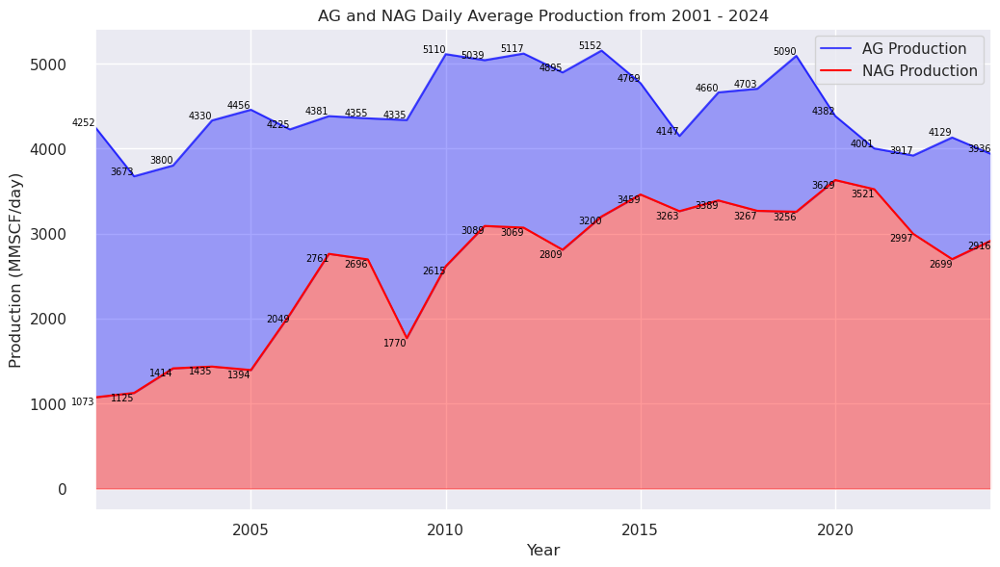

In [172]:
import matplotlib.pyplot as plt

# Create the plot
fig, ax = plt.subplots(figsize=(12, 6.5))

# Plot both AG and NAG production as line plots
ax.plot(davg['Year'], davg['AG PRODUCTION (MMSCF/day)'], label='AG Production', color='blue', alpha=0.7)
ax.plot(davg['Year'], davg['NAG PRODUCTION (MMSCF/day)'], label='NAG Production', color='red')
ax.set_xlim([davg['Year'].min(), davg['Year'].max()])
# Fill the green area for NAG production
ax.fill_between(davg['Year'], davg['NAG PRODUCTION (MMSCF/day)'], color='red', alpha=0.4)

# Fill the blue area only where AG Production is greater than NAG Production
ax.fill_between(davg['Year'], davg['AG PRODUCTION (MMSCF/day)'], davg['NAG PRODUCTION (MMSCF/day)'], 
                where=(davg['AG PRODUCTION (MMSCF/day)'] > davg['NAG PRODUCTION (MMSCF/day)']),
                interpolate=True, color='blue', alpha=0.35)

# Annotate the data points with smaller font size
for i, (year, ag, nag) in enumerate(zip(davg['Year'], davg['AG PRODUCTION (MMSCF/day)'], davg['NAG PRODUCTION (MMSCF/day)'])):
    ax.text(year, ag, f'{ag:.0f}', color='black', fontsize=7, ha='right', va='bottom')  # AG production values
    ax.text(year, nag, f'{nag:.0f}', color='black', fontsize=7, ha='right', va='top')  # NAG production values

# Add labels, legend, and title
plt.title('AG and NAG Daily Average Production from 2001 - 2024')
plt.xlabel('Year')
plt.ylabel('Production (MMSCF/day)')
plt.tick_params(axis='y', pad=15)

plt.legend()

# Display the plot
plt.show()


<Figure size 1500x1300 with 0 Axes>

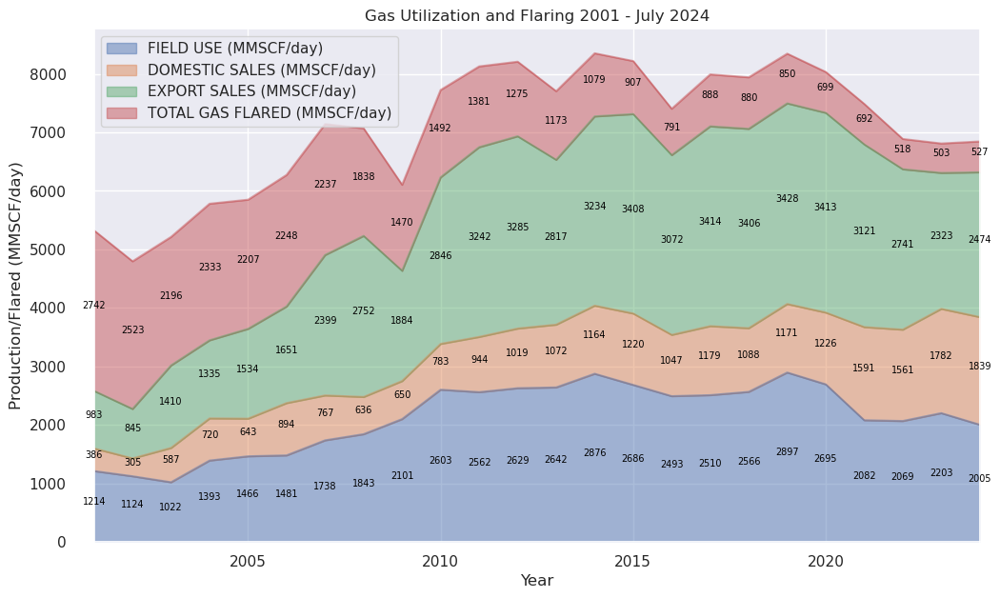

In [173]:
# Stack area plot for Gas Utilization and Flaring
davg_use = davg.drop(['NAG PRODUCTION (MMSCF/day)', 'AG PRODUCTION (MMSCF/day)'], axis=1)

plt.figure(figsize=(15, 13))
ax = davg_use.plot(kind='area', x='Year', stacked=True, figsize=(12, 7), alpha=0.47,)
ax.set_xlim([davg['Year'].min(), davg['Year'].max()])

# Adding value annotations for each plot
for i, row in davg_use.iterrows():
    ax.text(row['Year'], row['FIELD USE (MMSCF/day)'] / 2,  # Middle of FIELD USE area
            f"{row['FIELD USE (MMSCF/day)']:.0f}", color='black', fontsize=7, ha='center', va='bottom')
    
    ax.text(row['Year'], row['FIELD USE (MMSCF/day)'] + row['DOMESTIC SALES (MMSCF/day)'] / 2,  # Middle of DOMESTIC SALES area
            f"{row['DOMESTIC SALES (MMSCF/day)']:.0f}", color='black', fontsize=7, ha='center', va='bottom')
    
    ax.text(row['Year'], row['FIELD USE (MMSCF/day)'] + row['DOMESTIC SALES (MMSCF/day)'] + row['EXPORT SALES (MMSCF/day)'] / 2,  # Middle of EXPORT SALES area
            f"{row['EXPORT SALES (MMSCF/day)']:.0f}", color='black', fontsize=7, ha='center', va='bottom')
    
    ax.text(row['Year'], row['FIELD USE (MMSCF/day)'] + row['DOMESTIC SALES (MMSCF/day)'] + row['EXPORT SALES (MMSCF/day)'] + row['TOTAL GAS FLARED (MMSCF/day)'] / 2,  # Middle of TOTAL GAS FLARED area
            f"{row['TOTAL GAS FLARED (MMSCF/day)']:.0f}", color='black', fontsize=7, ha='center', va='bottom')

# Adding labels and title
plt.title('Gas Utilization and Flaring 2001 - July 2024')
plt.xlabel('Year')
plt.ylabel('Production/Flared (MMSCF/day)')
plt.tick_params(axis='y', pad=15)
plt.legend(loc='upper left')

# Display the plot
plt.show()



In [174]:
ag_flared = pd.concat([davg['Year'], davg['AG PRODUCTION (MMSCF/day)'], davg['TOTAL GAS FLARED (MMSCF/day)']], axis=1)
ag_flared['% Flared'] = ag_flared['TOTAL GAS FLARED (MMSCF/day)']/ag_flared['AG PRODUCTION (MMSCF/day)'] * 100
ag_flared.head()

,Year,AG PRODUCTION (MMSCF/day),TOTAL GAS FLARED (MMSCF/day),% Flared
0,2001,4252.0,2741.78,64.482126
1,2002,3673.0,2523.09,68.692894
2,2003,3800.0,2195.81,57.784474
3,2004,4330.0,2333.28,53.886374
4,2005,4456.0,2206.90,49.526481


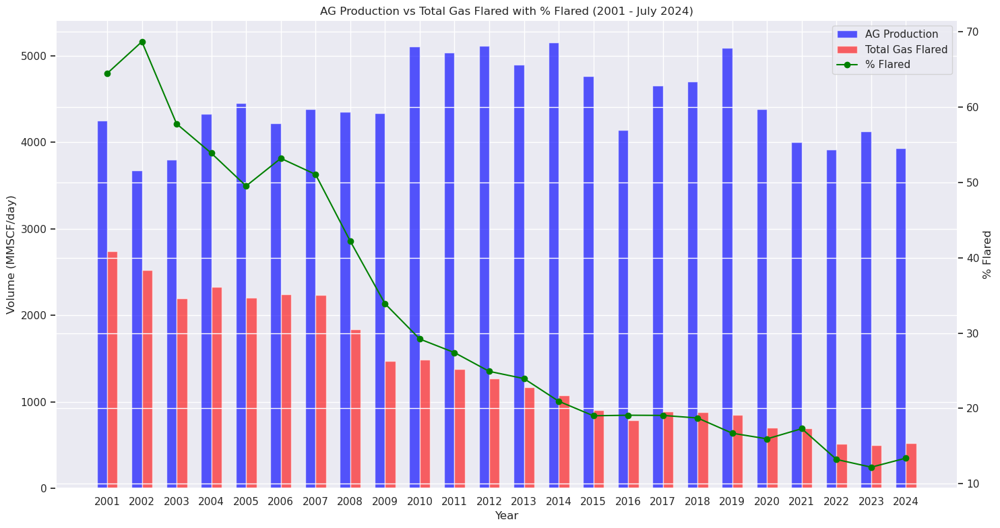

In [175]:
# Create a figure and axis
fig, ax1 = plt.subplots(figsize=(15, 8))

# Bar plot for AG Production and Total Gas Flared
width = 0.3
years = ag_flared['Year']

# Bar positions
bar1_pos = [x - width/2 for x in range(len(years))]
bar2_pos = [x + width/2 for x in range(len(years))]

ax1.bar(bar1_pos, ag_flared['AG PRODUCTION (MMSCF/day)'], width=width, label='AG Production', color='blue', alpha=0.65)
ax1.bar(bar2_pos, ag_flared['TOTAL GAS FLARED (MMSCF/day)'], width=width, label='Total Gas Flared', color='red', alpha=0.6)

# Adding labels and title to the first axis
ax1.set_xlabel('Year')
ax1.set_ylabel('Volume (MMSCF/day)')
ax1.set_title('AG Production vs Total Gas Flared with % Flared (2001 - July 2024)')
ax1.set_xticks(range(len(years)))
ax1.set_xticklabels(ag_flared['Year'])

# Create a second y-axis for the % Flared
ax2 = ax1.twinx()
ax2.plot(range(len(years)), ag_flared['% Flared'], color='green', marker='o', label='% Flared')

# Adding labels to the second axis
ax2.set_ylabel('% Flared')

# Combine the legends from both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()

# Place both legends in the upper-right corner
ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

# Display the plot
plt.tight_layout()
plt.show()


### Production Rate (Linear Regression)

Before we analyze the production decline using linear regression, we need to calculate the daily average production for total liquid hydrocarbons (in barrels per day) and associated gas (in million standard cubic feet per day). The goal is to compare their regression trends to understand how their production behaves over time. First, we extract and process the production data to obtain the daily averages. Then, we plot the time series and linear regression to quantify the rate of production for each, allowing us to compare their trends and assess how changes in liquid hydrocarbon production relate to associated gas output.

In [176]:
ag = daily_avg_ag.reset_index()
ag.tail()

,Date,AG PRODUCTION (MMSCF/day)
43,2024-08-31,3786.964121
44,2024-09-30,3783.703594
45,2024-10-31,4339.486289
46,2024-11-30,4466.674642
47,2024-12-31,3970.259431


In [177]:
df_merge['Daily Avg. Prod'] = df_merge.Production / df_merge.month_days
total_hc_avg = df_merge.groupby(['Date'])['Daily Avg. Prod'].sum().reset_index()


In [178]:
start = pd.Timestamp('2021-01-01')
total_hc_avg = total_hc_avg[total_hc_avg.Date >= start]

In [179]:
total_hc_avg.head()

,Date,Daily Avg. Prod
12,2021-01-31,1.711467e+06
13,2021-02-28,1.760934e+06
14,2021-03-31,1.748474e+06
15,2021-04-30,1.687044e+06
16,2021-05-31,1.659293e+06


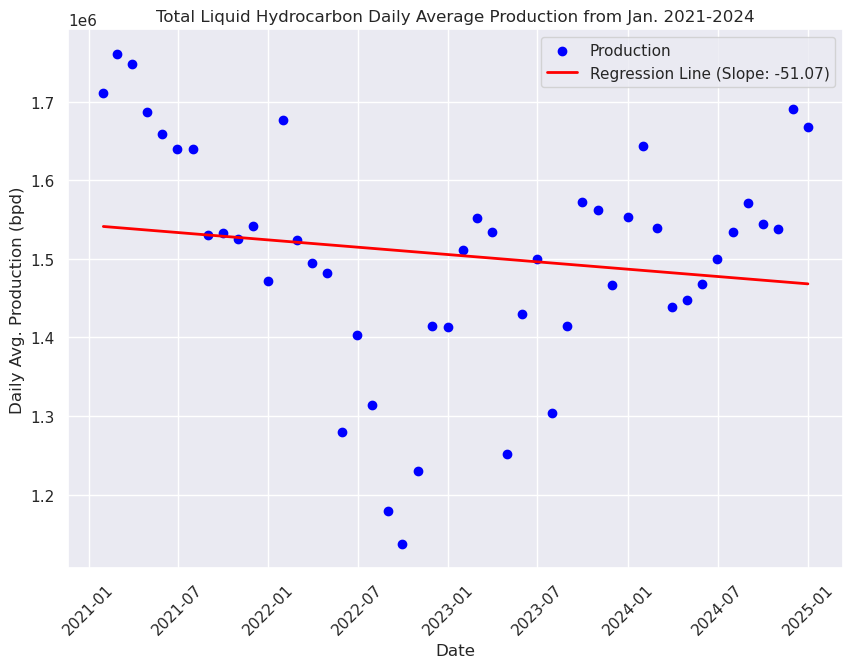

In [180]:
from sklearn.linear_model import LinearRegression
import matplotlib.dates as mdates

# Convert Date to numerical format (days since first date)
total_hc_avg['Days'] = (total_hc_avg['Date'] - total_hc_avg['Date'].min()).dt.days

# Prepare data for regression
X = total_hc_avg[['Days']]
y = total_hc_avg['Daily Avg. Prod']

# Perform linear regression
model = LinearRegression()
model.fit(X, y)

# Calculate slope
slope = model.coef_[0]

# Plot data points
plt.figure(figsize=(10, 7))
plt.scatter(total_hc_avg['Date'], total_hc_avg['Daily Avg. Prod'], color='blue', label='Production')

# Plot regression line
plt.plot(total_hc_avg['Date'], model.predict(X), color='red', linewidth=2, label=f'Regression Line (Slope: {slope:.2f})')

# Format the plot
plt.xlabel('Date')
plt.ylabel('Daily Avg. Production (bpd)')
plt.title('Total Liquid Hydrocarbon Daily Average Production from Jan. 2021-2024')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


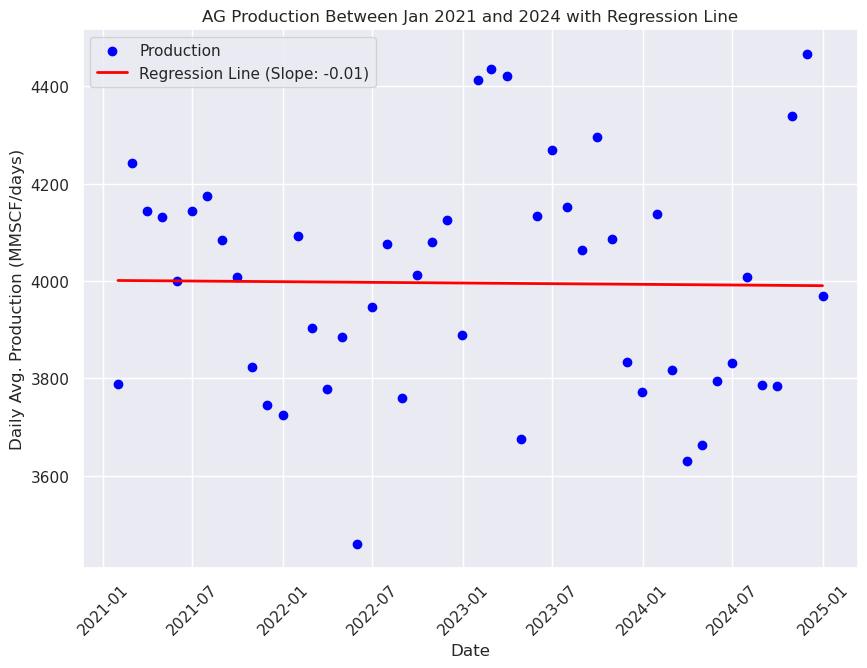

In [181]:
# Filter Dataframe
# start = pd.Timestamp('2021-01-01')
ag = ag[ag['Date'] >= start]

# Convert Date to numerical format (days since first date)
ag['Days'] = (ag['Date'] - ag['Date'].min()).dt.days

# Prepare data for regression
X = ag[['Days']]
y = ag['AG PRODUCTION (MMSCF/day)'] 

# Perform linear regression
model = LinearRegression()
model.fit(X, y)

# Calculate slope
slope = model.coef_[0]

# Plot data points
plt.figure(figsize=(10, 7))
plt.scatter(ag['Date'], ag['AG PRODUCTION (MMSCF/day)'], color='blue', label='Production')

# Plot regression line
plt.plot(ag['Date'], model.predict(X), color='red', linewidth=2, label=f'Regression Line (Slope: {slope:.2f})')

# Format the plot
plt.xlabel('Date')
plt.ylabel('Daily Avg. Production (MMSCF/days)')
plt.title('AG Production Between Jan 2021 and 2024 with Regression Line')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


The plots indicate that total hydrocarbon production declines by about 51 barrels per day, while associated gas decreases by roughly 0.01 million standard cubic feet (10,000 SCF) per day. This suggests that, as liquid hydrocarbon production falls, associated gas production also tends to drop—a pattern consistent with associated gas being a byproduct of crude extraction. However, in reservoirs with a high gas-to-oil ratio (GOR), gas production may actually increase even as liquid hydrocarbon production declines, due to greater gas liberation from the reservoir. Ultimately, the reservoir's phase behavior is critical in determining the fluids produced at the surface.

## Monthly Gas Production Analysis  

In the following analysis, we examine monthly gas production trends by transforming and structuring the data for meaningful comparisons. The dataset, stored in `gas_df` above, undergoes several key transformations:  

1. **Unit Conversion:**  
   - We add a new column converting gas production from **million standard cubic feet (MMSCF) to billion cubic feet (BCF)**.  
   - Another column is added to express **BCF per day** for better granularity in daily production trends.

2. **Year-on-Year (YoY) Comparison:**  
   - We extract gas production data for the **most recent month** and the **same month from the previous year**.  
   - This allows us to compute the **YoY percentage change** in total gas production.  

3. **Gas Monetization Analysis:**  
   - The monetized gas consists of **domestic sales and export sales**.  
   - We calculate the **YoY change** in monetized gas to access production perfomance.  

4. **Non-Commercialized Gas:**  
   - This includes **field use and total gas flared**, representing gas that was not sold.  
   - We compute non-commercialized gas for both the **current month and the same month in the previous year**, followed by the **YoY change**.  

5. **Visualization:**  
   - We generate plots comparing **total gas production** for the **current and previous year**.  
   - We also break down **total gas production by usage category**, comparing it across years.  


In [182]:
year = 2024
month = 12

# Convert production data to BCF
gas_df['AG PRODUCTION (BCF)'] = gas_df['AG PRODUCTION (MMSCF)'] / 1e3
gas_df['NAG PRODUCTION (BCF)'] = gas_df['NAG PRODUCTION (MMSCF)'] / 1e3
gas_df['TOTAL GAS PRODUCTION (BCF)'] = gas_df['TOTAL GAS PRODUCTION (MMSCF)'] / 1e3
gas_df['FIELD USE (BCF)'] = gas_df['FIELD USE (MMSCF)'] / 1e3
gas_df['DOMESTIC SALES (BCF)'] = gas_df['DOMESTIC SALES (MMSCF)']  / 1e3
gas_df['EXPORT SALES (BCF)'] = gas_df['EXPORT SALES (MMSCF)'] / 1e3
gas_df['TOTAL GAS UTILISED (BCF)'] = gas_df['TOTAL GAS UTILISED (MMSCF)'] / 1e3
gas_df['TOTAL GAS FLARED (BCF)'] = gas_df['TOTAL GAS FLARED (MMSCF)'] / 1e3

# Calculate daily averages in BCF
gas_df['AG PRODUCTION Daily Avg (BCF/d)'] = gas_df['AG PRODUCTION (BCF)'] / gas_df['month_days']
gas_df['NAG PRODUCTION Daily Avg (BCF/d)'] = gas_df['NAG PRODUCTION (BCF)'] / gas_df['month_days']
gas_df['TOTAL GAS PRODUCTION Daily Avg (BCF/d)'] = gas_df['TOTAL GAS PRODUCTION (BCF)'] / gas_df['month_days']
gas_df['FIELD USE Daily Avg (BCF/d)'] = gas_df['FIELD USE (BCF)'] / gas_df['month_days']
gas_df['DOMESTIC SALES Daily Avg (BCF/d)'] = gas_df['DOMESTIC SALES (BCF)']  / gas_df['month_days']
gas_df['EXPORT SALES Daily Avg (BCF/d)'] = gas_df['EXPORT SALES (BCF)'] / gas_df['month_days']
gas_df['TOTAL GAS UTILISED Daily Avg (BCF/d)'] = gas_df['TOTAL GAS UTILISED (BCF)'] / gas_df['month_days']
gas_df['TOTAL GAS FLARED Daily Avg (BCF/d)'] = gas_df['TOTAL GAS FLARED (BCF)'] / gas_df['month_days']

# Filter the DataFrame for the latest month's data and the previous year's data for comparison
latest_month_data = gas_df[(gas_df['Year'] == year) & (gas_df['Month'] == month)].iloc[0]
previous_year_data = gas_df[(gas_df['Year'] == year-1) & (gas_df['Month'] == month)].iloc[0]

In [183]:
gas_df.head()

,Date,AG PRODUCTION (MMSCF),NAG PRODUCTION (MMSCF),TOTAL GAS PRODUCTION (MMSCF),FIELD USE (MMSCF),DOMESTIC SALES (MMSCF),EXPORT SALES (MMSCF),TOTAL GAS UTILISED (MMSCF),% UTILIZED,TOTAL GAS FLARED (MMSCF),% FLARED,GAS SHRINKAGE,Year,Month,Month_name,month_days,AG PRODUCTION (BCF),NAG PRODUCTION (BCF),TOTAL GAS PRODUCTION (BCF),FIELD USE (BCF),DOMESTIC SALES (BCF),EXPORT SALES (BCF),TOTAL GAS UTILISED (BCF),TOTAL GAS FLARED (BCF),AG PRODUCTION Daily Avg (BCF/d),NAG PRODUCTION Daily Avg (BCF/d),TOTAL GAS PRODUCTION Daily Avg (BCF/d),FIELD USE Daily Avg (BCF/d),DOMESTIC SALES Daily Avg (BCF/d),EXPORT SALES Daily Avg (BCF/d),TOTAL GAS UTILISED Daily Avg (BCF/d),TOTAL GAS FLARED Daily Avg (BCF/d)
0,2021-01-31,117415.351483,119293.772252,236709.123735,57491.301073,49124.812422,107380.744939,213996.858434,0.904050,21342.160590,0.090162,1370.104710,2021,1,January,31,117.415351,119.293772,236.709124,57.491301,49.124812,107.380745,213.996858,21.342161,3.787592,3.848186,7.635778,1.854558,1.584671,3.463895,6.903124,0.688457
1,2021-02-28,118786.275000,105401.811758,224188.086757,60885.101038,44977.983573,96108.681503,201971.766114,0.900903,20685.970733,0.092271,1530.349910,2021,2,February,28,118.786275,105.401812,224.188087,60.885101,44.977984,96.108682,201.971766,20.685971,4.242367,3.764350,8.006717,2.174468,1.606357,3.432453,7.213277,0.738785
2,2021-03-31,128451.249602,106967.392469,235418.642071,64670.271853,45245.659311,98775.574834,208691.505998,0.886470,25645.668657,0.108936,1081.467416,2021,3,March,31,128.451250,106.967392,235.418642,64.670272,45.245659,98.775575,208.691506,25.645669,4.143589,3.450561,7.594150,2.086138,1.459537,3.186309,6.731984,0.827280
3,2021-04-30,123967.579648,99424.777040,223392.356689,64254.202177,45506.069849,90182.458587,199942.730614,0.895029,22583.513625,0.101093,866.112450,2021,4,April,30,123.967580,99.424777,223.392357,64.254202,45.506070,90.182459,199.942731,22.583514,4.132253,3.314159,7.446412,2.141807,1.516869,3.006082,6.664758,0.752784
4,2021-05-31,124032.387720,109774.574929,233806.962649,65681.385887,54797.287690,90131.330393,210610.003971,0.900786,22256.452752,0.095192,940.505926,2021,5,May,31,124.032388,109.774575,233.806963,65.681386,54.797288,90.131330,210.610004,22.256453,4.001045,3.541115,7.542160,2.118754,1.767654,2.907462,6.793871,0.717950


In [184]:
gas_df.columns

Index(['Date', 'AG PRODUCTION (MMSCF)', 'NAG PRODUCTION (MMSCF)',
       'TOTAL GAS PRODUCTION (MMSCF)', 'FIELD USE (MMSCF)',
       'DOMESTIC SALES (MMSCF)', 'EXPORT SALES (MMSCF)',
       'TOTAL GAS UTILISED (MMSCF)', '% UTILIZED', 'TOTAL GAS FLARED (MMSCF)',
       '% FLARED', 'GAS SHRINKAGE', 'Year', 'Month', 'Month_name',
       'month_days', 'AG PRODUCTION (BCF)', 'NAG PRODUCTION (BCF)',
       'TOTAL GAS PRODUCTION (BCF)', 'FIELD USE (BCF)', 'DOMESTIC SALES (BCF)',
       'EXPORT SALES (BCF)', 'TOTAL GAS UTILISED (BCF)',
       'TOTAL GAS FLARED (BCF)', 'AG PRODUCTION Daily Avg (BCF/d)',
       'NAG PRODUCTION Daily Avg (BCF/d)',
       'TOTAL GAS PRODUCTION Daily Avg (BCF/d)', 'FIELD USE Daily Avg (BCF/d)',
       'DOMESTIC SALES Daily Avg (BCF/d)', 'EXPORT SALES Daily Avg (BCF/d)',
       'TOTAL GAS UTILISED Daily Avg (BCF/d)',
       'TOTAL GAS FLARED Daily Avg (BCF/d)'],
      dtype='object')

In [185]:
latest_month_data

Date                                      2024-12-31 00:00:00
AG PRODUCTION (MMSCF)                           123078.042369
NAG PRODUCTION (MMSCF)                           92246.403108
TOTAL GAS PRODUCTION (MMSCF)                    215324.445476
FIELD USE (MMSCF)                                53084.968018
DOMESTIC SALES (MMSCF)                           66986.504657
EXPORT SALES (MMSCF)                             76186.300804
TOTAL GAS UTILISED (MMSCF)                       196257.77348
% UTILIZED                                           0.911451
TOTAL GAS FLARED (MMSCF)                         19066.671996
% FLARED                                             0.088549
GAS SHRINKAGE                                             0.0
Year                                                     2024
Month                                                      12
Month_name                                           December
month_days                                                 31
AG PRODU

In [186]:
previous_year_data

Date                                      2023-12-31 00:00:00
AG PRODUCTION (MMSCF)                            116918.69957
NAG PRODUCTION (MMSCF)                           82091.032306
TOTAL GAS PRODUCTION (MMSCF)                    199009.731876
FIELD USE (MMSCF)                                55741.665426
DOMESTIC SALES (MMSCF)                           53068.702649
EXPORT SALES (MMSCF)                             72207.603424
TOTAL GAS UTILISED (MMSCF)                      181017.971499
% UTILIZED                                           0.909594
TOTAL GAS FLARED (MMSCF)                         17760.889195
% FLARED                                             0.089246
GAS SHRINKAGE                                      230.871182
Year                                                     2023
Month                                                      12
Month_name                                           December
month_days                                                 31
AG PRODU

In [187]:
# Selected index
index = ['AG PRODUCTION (BCF)', 'NAG PRODUCTION (BCF)', 'TOTAL GAS PRODUCTION (BCF)',
        'AG PRODUCTION Daily Avg (BCF/d)', 'NAG PRODUCTION Daily Avg (BCF/d)', 'TOTAL GAS PRODUCTION Daily Avg (BCF/d)', 
        'FIELD USE (BCF)', 'DOMESTIC SALES (BCF)', 'EXPORT SALES (BCF)', 'TOTAL GAS UTILISED (BCF)', 'TOTAL GAS FLARED (BCF)',
        'FIELD USE Daily Avg (BCF/d)', 'DOMESTIC SALES Daily Avg (BCF/d)', 'EXPORT SALES Daily Avg (BCF/d)',
        'TOTAL GAS UTILISED Daily Avg (BCF/d)', 'TOTAL GAS FLARED Daily Avg (BCF/d)']

In [188]:
latest_month_data[index]   # December 2024 data with selected index

AG PRODUCTION (BCF)                       123.078042
NAG PRODUCTION (BCF)                       92.246403
TOTAL GAS PRODUCTION (BCF)                215.324445
AG PRODUCTION Daily Avg (BCF/d)             3.970259
NAG PRODUCTION Daily Avg (BCF/d)             2.97569
TOTAL GAS PRODUCTION Daily Avg (BCF/d)       6.94595
FIELD USE (BCF)                            53.084968
DOMESTIC SALES (BCF)                       66.986505
EXPORT SALES (BCF)                         76.186301
TOTAL GAS UTILISED (BCF)                  196.257773
TOTAL GAS FLARED (BCF)                     19.066672
FIELD USE Daily Avg (BCF/d)                 1.712418
DOMESTIC SALES Daily Avg (BCF/d)            2.160855
EXPORT SALES Daily Avg (BCF/d)              2.457623
TOTAL GAS UTILISED Daily Avg (BCF/d)        6.330896
TOTAL GAS FLARED Daily Avg (BCF/d)          0.615054
Name: 11, dtype: object

In [189]:
previous_year_data[index]     # December 2023

AG PRODUCTION (BCF)                         116.9187
NAG PRODUCTION (BCF)                       82.091032
TOTAL GAS PRODUCTION (BCF)                199.009732
AG PRODUCTION Daily Avg (BCF/d)             3.771571
NAG PRODUCTION Daily Avg (BCF/d)            2.648098
TOTAL GAS PRODUCTION Daily Avg (BCF/d)      6.419669
FIELD USE (BCF)                            55.741665
DOMESTIC SALES (BCF)                       53.068703
EXPORT SALES (BCF)                         72.207603
TOTAL GAS UTILISED (BCF)                  181.017971
TOTAL GAS FLARED (BCF)                     17.760889
FIELD USE Daily Avg (BCF/d)                 1.798118
DOMESTIC SALES Daily Avg (BCF/d)            1.711894
EXPORT SALES Daily Avg (BCF/d)              2.329278
TOTAL GAS UTILISED Daily Avg (BCF/d)        5.839289
TOTAL GAS FLARED Daily Avg (BCF/d)          0.572932
Name: 11, dtype: object

In [190]:
yoy = (latest_month_data[index] - previous_year_data[index]) / previous_year_data[index] * 100
yoy

AG PRODUCTION (BCF)                        5.268056
NAG PRODUCTION (BCF)                      12.370865
TOTAL GAS PRODUCTION (BCF)                 8.197948
AG PRODUCTION Daily Avg (BCF/d)            5.268056
NAG PRODUCTION Daily Avg (BCF/d)          12.370865
TOTAL GAS PRODUCTION Daily Avg (BCF/d)     8.197948
FIELD USE (BCF)                           -4.766089
DOMESTIC SALES (BCF)                      26.226008
EXPORT SALES (BCF)                         5.510081
TOTAL GAS UTILISED (BCF)                   8.418944
TOTAL GAS FLARED (BCF)                     7.352013
FIELD USE Daily Avg (BCF/d)               -4.766089
DOMESTIC SALES Daily Avg (BCF/d)          26.226008
EXPORT SALES Daily Avg (BCF/d)             5.510081
TOTAL GAS UTILISED Daily Avg (BCF/d)       8.418944
TOTAL GAS FLARED Daily Avg (BCF/d)         7.352013
Name: 11, dtype: object

In [191]:
# Gas Monetize current month
gm = latest_month_data['DOMESTIC SALES Daily Avg (BCF/d)'] + latest_month_data['EXPORT SALES Daily Avg (BCF/d)']
gm

4.6184775955354365

In [192]:
# Gas Monetize previous year month
gm_pr = previous_year_data['DOMESTIC SALES Daily Avg (BCF/d)'] + previous_year_data['EXPORT SALES Daily Avg (BCF/d)']
gm_pr

4.041171163627938

In [193]:
# YoY gas monetize
(gm - gm_pr)/gm_pr

0.14285621878713614

In [194]:
# Non Commercialize Gas current month
ncg = latest_month_data['FIELD USE Daily Avg (BCF/d)'] + latest_month_data['TOTAL GAS FLARED Daily Avg (BCF/d)']
ncg

2.327472258538

In [195]:
# Non Commercialize Gas previous year month
ncg_pr = previous_year_data['FIELD USE Daily Avg (BCF/d)'] + previous_year_data['TOTAL GAS FLARED Daily Avg (BCF/d)']
ncg_pr

2.3710501490657645

In [196]:
# YoY for Non Commercialize Gas
(ncg.round(2) - ncg_pr.round(2))/ncg_pr.round(2)

-0.016877637130801704

In [197]:
index_2 = ['AG PRODUCTION Daily Avg (BCF/d)', 'NAG PRODUCTION Daily Avg (BCF/d)',
           'FIELD USE Daily Avg (BCF/d)' , 'DOMESTIC SALES Daily Avg (BCF/d)',
           'EXPORT SALES Daily Avg (BCF/d)', 'TOTAL GAS FLARED Daily Avg (BCF/d)',]

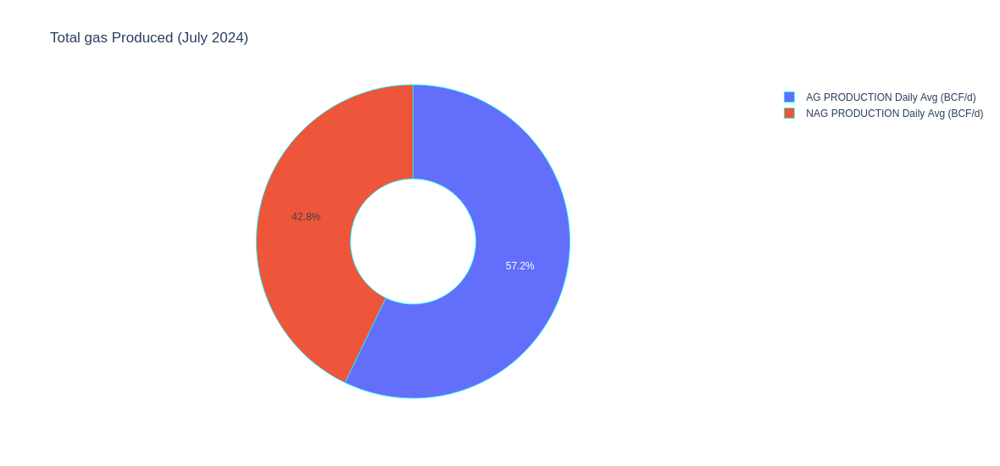

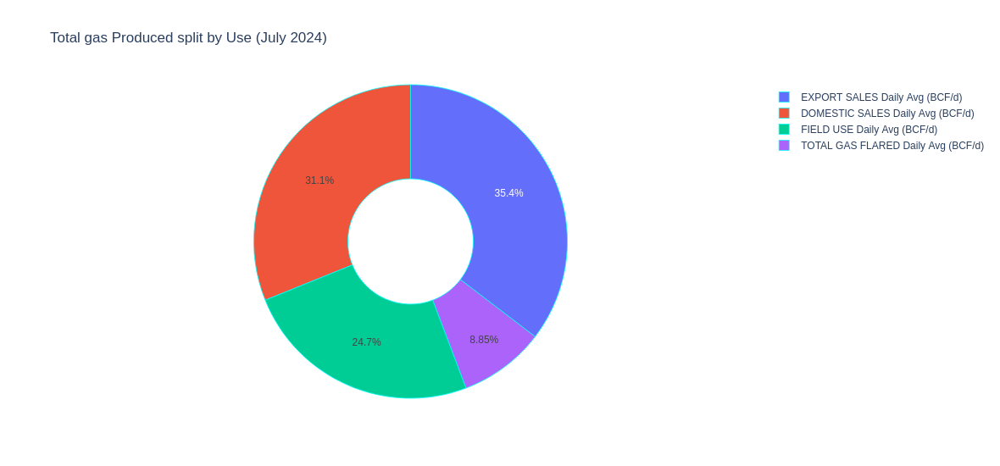

In [198]:
latest_month_dict = {}
for ind in index_2[:2]:  
    latest_month_dict[ind] = latest_month_data[ind].sum()
plot_pie(latest_month_dict, title='Total gas Produced (July 2024)')

latest_month_by_use = {}
for ind in index_2[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    latest_month_by_use[ind] = latest_month_data[ind].sum()
plot_pie(latest_month_by_use, title='Total gas Produced split by Use (July 2024)')


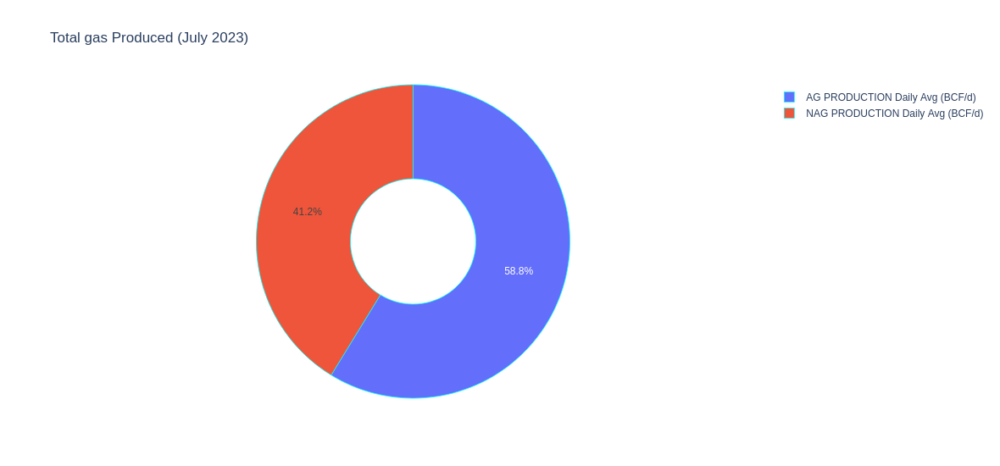

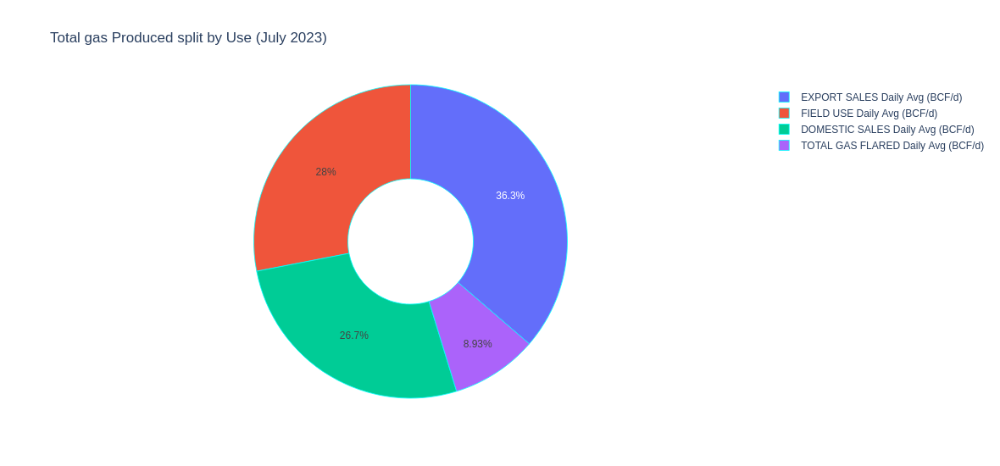

In [199]:
previous_year_dict = {}
for ind in index_2[:2]:  
    previous_year_dict[ind] = previous_year_data[ind].sum()
plot_pie(previous_year_dict, title='Total gas Produced (July 2023)')

previous_year_by_use = {}
for ind in index_2[2:]:  # Field Use, Export, Domeestic, flare, shrinkage
    previous_year_by_use[ind] = previous_year_data[ind].sum()
plot_pie(previous_year_by_use, title='Total gas Produced split by Use (July 2023)')

# Production Forecasting 

## Liquid Hydrocarbon

**Objective:**  

In this analysis, our goal is to forecast the **daily average production of liquid hydrocarbons** using a combination of statistical and machine learning models. We employ a structured approach that involves:  

1. **Building an ARIMA model** – A statistical model that captures time series patterns based on autoregressive and moving average components.  
2. **Building an XGBoost model** – A gradient boosting model that learns patterns from ARIMA's residuals to improve predictions.  
3. **Developing a hybrid model** – A combination of ARIMA and XGBoost, where XGBoost corrects ARIMA’s errors, leading to more accurate forecasts.  

To achieve this, we preprocess the data to ensure it has a **monthly frequency**, check for **stationarity**, and then proceed with model building and evaluation. As we go through each step, we will provide explanations and insights into the process.

In [200]:
df_merge['Daily Avg. Prod'] = df_merge.Production / df_merge.month_days
hc_avg = df_merge.groupby(['Date'])['Daily Avg. Prod'].sum() / 1e6  # Convert to MMbbls/day
hc_avg.name = 'Daily Avg. Prod (MMbbls/day)'

hc_avg.head()

Date
2020-01-31    2.127301
2020-02-29    2.153422
2020-03-31    2.125300
2020-04-30    2.099369
2020-05-31    1.785426
Name: Daily Avg. Prod (MMbbls/day), dtype: float64

#### ARIMA

In [201]:
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

# Ensure the data is sorted and index (timestamps) is a datetime object properly formatted
ts_hc = hc_avg.sort_index().asfreq('M')

# Check stationarity using Augmented Dickey-Fuller (ADF) Test
def adf_test(series):
    result = adfuller(series)
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] <= 0.05:
        print("The time series is stationary.")
    else:
        print("The time series is NOT stationary. Differencing is required.")

adf_test(ts_hc)


ADF Statistic: -3.03690746582408
p-value: 0.03158852332066382
The time series is stationary.


Since `ts_hc` is stationary, no need for differencing

In [202]:
# Differencing if needed (to make the series stationary)
# ts_diff = ts_hc.diff().dropna()
# adf_test(ts_diff)  # Check stationarity after differencing


From the stationarity check above, we confirm that the time series is stationary, with an ADF test p-value of 0.03158. Since the series does not require differencing, we proceed to determine the best ARIMA parameters.

To find the optimal values for p (autoregressive order), d (differencing order), and q (moving average order), we use the `auto_arima` function from the `pmdarima` module. This function automates the selection of ARIMA hyperparameters by evaluating different combinations and choosing the best based on model performance criteria.

In [203]:
ts_hc.index

DatetimeIndex(['2020-01-31', '2020-02-29', '2020-03-31', '2020-04-30',
               '2020-05-31', '2020-06-30', '2020-07-31', '2020-08-31',
               '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31',
               '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30',
               '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31',
               '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31',
               '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30',
               '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31',
               '2022-09-30', '2022-10-31', '2022-11-30', '2022-12-31',
               '2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30',
               '2023-05-31', '2023-06-30', '2023-07-31', '2023-08-31',
               '2023-09-30', '2023-10-31', '2023-11-30', '2023-12-31',
               '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30',
               '2024-05-31', '2024-06-30', '2024-07-31', '2024-08-31',
      

In [204]:
# !pip install pmdarima
from pmdarima import auto_arima

# Fit Auto ARIMA model
auto_model = auto_arima(ts_hc, seasonal=False, trace=True)

# Print best order
print(auto_model.order)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-93.314, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-92.522, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-93.150, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-94.996, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-91.885, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 1.081 seconds
(0, 1, 0)


In [205]:
## Fit ARIMA model 
p, d, q = 0, 1, 0 # tuning parameters
model = ARIMA(ts_hc, order=(p, d, q))
model_fit = model.fit()

# Print model summary
print(model_fit.summary())


                                    SARIMAX Results                                     
Dep. Variable:     Daily Avg. Prod (MMbbls/day)   No. Observations:                   60
Model:                           ARIMA(0, 1, 0)   Log Likelihood                  48.498
Date:                          Sat, 22 Mar 2025   AIC                            -94.996
Time:                                  09:44:19   BIC                            -92.919
Sample:                              01-31-2020   HQIC                           -94.185
                                   - 12-31-2024                                         
Covariance Type:                            opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0113      0.002      6.409      0.000       0.008       0.015
Ljung-Box (L1) (Q):                   1.28   Jarque

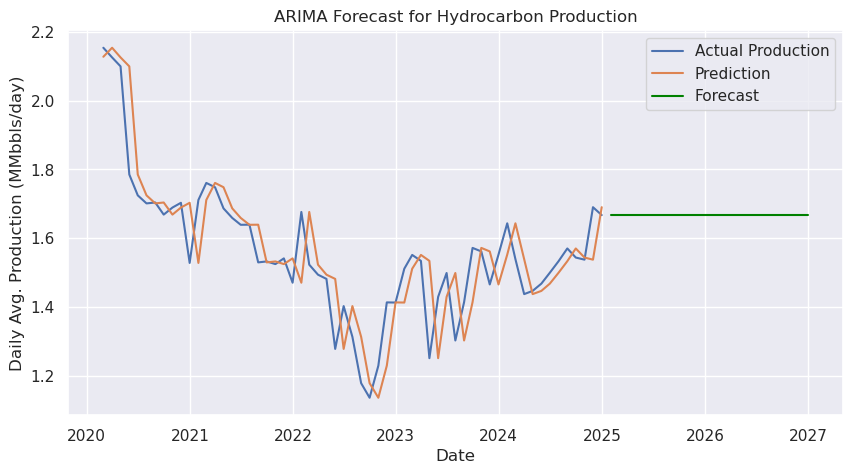

In [206]:
# Forecast the next 12 months
forecast_steps = 24  # Number of months to predict
forecast = model_fit.forecast(steps=forecast_steps)

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_hc[1:], label="Actual Production")
plt.plot(model_fit.fittedvalues[1:], label="Prediction")
plt.plot(pd.date_range(start=ts_hc.index[-1], periods=forecast_steps+1, freq='MS')[1:], forecast, color='green', label="Forecast")
plt.title("ARIMA Forecast for Hydrocarbon Production")
plt.xlabel("Date")
plt.ylabel("Daily Avg. Production (MMbbls/day)")
plt.legend()
plt.show()


After running `auto-arima`, the best-selected model was **ARIMA(0,1,0)**, indicating a **random walk** process. The model was fitted, yielding **AIC: -94.996**, **BIC: -92.919**, and **HQIC: -94.185**. We plotted the actual production, model predictions, and a **12-month forecast**, which remained constant at **1.66756 million barrels per day**. The graphs illustrate these results. Next, we explore the XGBoost model.

We implemented XGBoost for forecasting, which requires predictors rather than a single time series. Since XGBoost is not inherently designed for sequential time-series forecasting, we created lagged values to serve as features, allowing the model to learn patterns from past observations. After experimenting with different lags, we found that using five lags produced the best results. The model was trained using 80% of the data, with the squared error objective function and 100 estimators and a learning rate of 0.1, which was determined to be optimal through experimentation. The final model achieved an RMSE of 0.146.

#### XGBoost

In [207]:
# !pip install xgboost

In [208]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Create lag features
def create_lagged_features(series, lags=3):
    df = pd.DataFrame({'residual': series}) 
    for i in range(1, lags + 1):
        df[f'lag_{i}'] = series.shift(i)  # Shift by i steps    
    return df.dropna() 

# Apply the function
lags = 6
lagged_ts_hc = create_lagged_features(ts_hc, lags)

# Define features (X) and target (y)
X = lagged_ts_hc.drop(columns=['residual'])
y = lagged_ts_hc['residual']


In [209]:
# Use the first 80% for training, last 20% for testing
split = int(len(X) * 0.8)
X_train, X_test = X.iloc[:split], X.iloc[split:]
y_train, y_test = y.iloc[:split], y.iloc[split:]


In [210]:
# Initialize XGBoost Regressor
xgb_hc = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1)

# Train the model
xgb_hc.fit(X_train, y_train)

# Predict on test data
y_pred = xgb_hc.predict(X_test)

# Compute RMSE (Root Mean Squared Error)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse:.3f}")



RMSE: 0.132


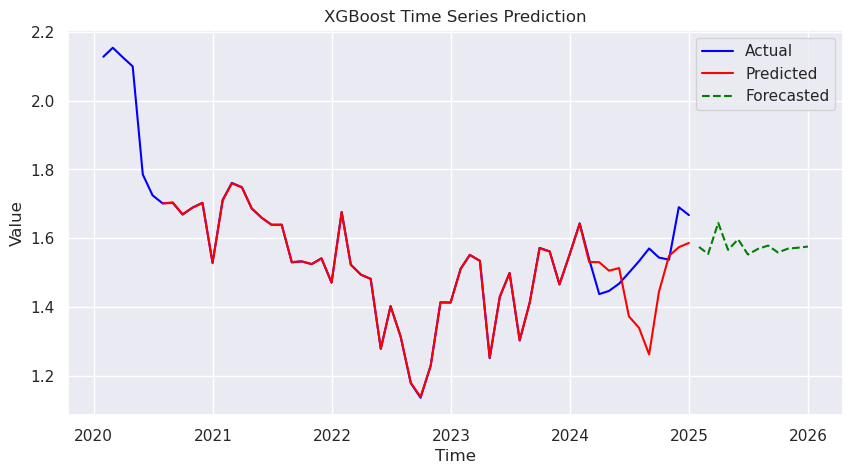

In [211]:

# Predict the entire dataset
xgb_hc_pred = xgb_hc.predict(X)
xgb_hc_pred = pd.Series(xgb_hc_pred, index=X.index)

# Forecast the next (n-steps) values based on the last (n_lags) observations
n_steps = 12
n_lags = xgb_hc.get_booster().num_features()
xgb_hc_forecasts = []


# Generate future dates starting from the last timestamp in ts_hc
forecast_dates = pd.date_range(start=ts_hc.index[-1], periods=n_steps + 1, freq="M")[1:]
ts_hc_copy = ts_hc.copy().values.flatten()

for _ in range(n_steps):
    last_obs = ts_hc_copy[-n_lags:].reshape(1, -1)
    xgb_hc_forecast = xgb_hc.predict(last_obs)[0]  # Extract scalar value
    xgb_hc_forecasts.append(xgb_hc_forecast)
    
    # Append forecasted value to the series for iterative prediction
    ts_hc_copy = np.append(ts_hc_copy, xgb_hc_forecast)

# Convert forecast list to pandas Series with datetime index
xgb_hc_forecasts = pd.DataFrame({'Forecast (MMbbls/day)':xgb_hc_forecasts}, index=forecast_dates)
xgb_hc_forecasts['Forecast (bbls)'] = xgb_hc_forecasts['Forecast (MMbbls/day)'] * 1e6 * xgb_hc_forecasts.index.day

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_hc, label="Actual", color="blue")
plt.plot(xgb_hc_pred, label="Predicted", color="red")
plt.plot(xgb_hc_forecasts['Forecast (MMbbls/day)'], label="Forecasted", color="green", linestyle="dashed")

plt.xlabel("Time")
plt.ylabel("Value")
plt.title("XGBoost Time Series Prediction")
plt.legend()
plt.show()


In [212]:
xgb_hc_forecasts

,Forecast (MMbbls/day),Forecast (bbls)
2025-01-31,1.575092,4.882786e+07
2025-02-28,1.554779,4.353381e+07
2025-03-31,1.645049,5.099652e+07
2025-04-30,1.566635,4.699905e+07
2025-05-31,1.597209,4.951349e+07
2025-06-30,1.553119,4.659357e+07
2025-07-31,1.569453,4.865305e+07
2025-08-31,1.579081,4.895151e+07
2025-09-30,1.559071,4.677213e+07
2025-10-31,1.570164,4.867509e+07


#### ARIMA + XGBoost

For the hybrid model, we combined ARIMA and XGBoost to improve forecast accuracy. First, we built an ARIMA model using the (0,1,0) p,d,q parameters and obtained its residuals, which capture the unexplained patterns in the time series. These residuals were saved during training for later use in forecasting. Next, we trained the XGBoost model using the ARIMA residuals, where the residuals were lagged to create predictors. **This means that XGBoost was not predicting the original time series but was instead learning from the past errors of ARIMA**.  

In [213]:
import pickle
# Train ARIMA
p, d, q = 0, 1, 0     # tuning parameters
arima_hc = ARIMA(ts_hc, order=(p, d, q)).fit()
arima_hc_fitted_values = arima_hc.fittedvalues
arima_hc_residuals = ts_hc - arima_hc_fitted_values  # Compute residuals

# Define number of lags for the xgboost feature
n_lags = 5

# Prepare XGBoost Data
lagged_arima_hc_residuals = create_lagged_features(arima_hc_residuals, n_lags)
X_train = lagged_arima_hc_residuals.drop(columns=['residual'])
y_train = lagged_arima_hc_residuals['residual']

# Train XGBoost
xgb_hc = xgb.XGBRegressor(objective="reg:squarederror")
xgb_hc.fit(X_train, y_train)

# Save Models & Residuals
with open("arima_hc.pkl", "wb") as f:
    pickle.dump(arima_hc, f)

with open("xgb_hc.pkl", "wb") as f:
    pickle.dump(xgb_hc, f)

# Save residuals for forecasting
arima_hc_residuals = pd.DataFrame(arima_hc_residuals, columns=['residual'])

arima_hc_residuals.to_csv("arima_hc_residuals.csv", index=False)


For forecasting, we created a function that loads the trained models and sequentially generates predictions. In this case, we found that using five lags provided better results, so we used the last five saved residuals (errors) to predict future residuals. The final forecast was then obtained by adding the ARIMA forecast to its errors as predicted by XGBoost. This method leverages ARIMA’s ability to model linear trends while allowing XGBoost to capture complex residual patterns, leading to a more refined prediction.

The model is using  the last 5 residuals for prediction.


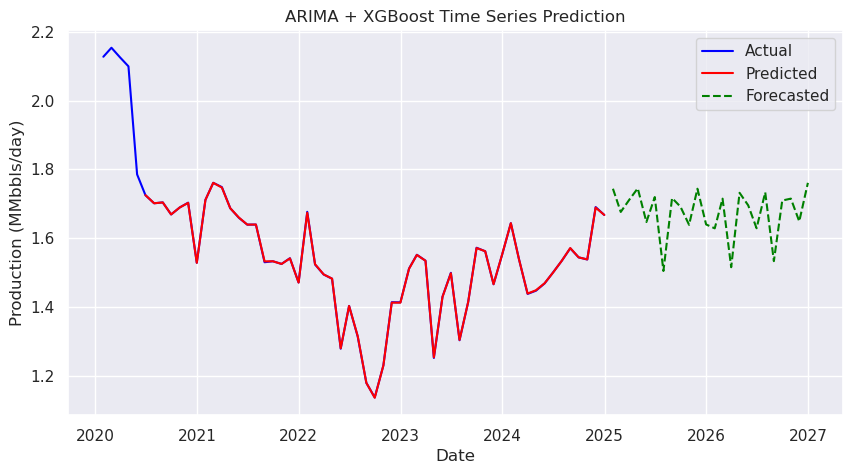

In [214]:
def hybrid_forecast(n_steps):
    """
    Perform multi-step hybrid forecasting using ARIMA and XGBoost.
    
    Parameters:
    - n_steps (int): Number of months to forecast.

    Returns:
    - DataFrame with ARIMA forecast, XGBoost corrections, and final hybrid forecast.
    """

    # -------------------- Load Saved Models --------------------
    with open("arima_hc.pkl", "rb") as f:
        arima_hc = pickle.load(f)

    with open("xgb_hc.pkl", "rb") as f:
        xgb_hc = pickle.load(f)

    # Auto-detect number of lags from the XGBoost model
    n_lags = xgb_hc.get_booster().num_features()
    print(f"The model is using  the last {n_lags} residuals for prediction.")

    # Step 1: ARIMA Forecast
    arima_hc_forecasts = arima_hc.forecast(steps=n_steps)

    # Load last residuals
    arima_hc_residuals = pd.read_csv("arima_hc_residuals.csv").values.flatten()

    xgb_hc_forecasts = []
    hybrid_hc_forecasts = []
   
    # Step 2: Generate Hybrid Forecasts
    for i in range(n_steps):
        # Prepare XGBoost input
        last_obs = arima_hc_residuals[-n_lags:].reshape(1, -1)

        # Predict correction (residual)
        xgb_hc_forecast = xgb_hc.predict(last_obs)[0]
        xgb_hc_forecasts.append(xgb_hc_forecast)

        # Final forecast = ARIMA Forecast + XGBoost Forecast (correction)
        hybrid_hc_forecast = arima_hc_forecasts.iloc[i] + xgb_hc_forecast
        hybrid_hc_forecasts.append(hybrid_hc_forecast)

        #  Update residuals 
        arima_hc_residuals = np.append(arima_hc_residuals, xgb_hc_forecasts)

    # Store Forecasts
    hybrid_hc_forecast_df = pd.DataFrame({
        "ARIMA Forecast (MMbbls/day)": arima_hc_forecasts,
        "XGBoost Prediction (MMbbls/day)": xgb_hc_forecasts, 
        "Hybrid Forecast (MMbbls/day)": hybrid_hc_forecasts
    })
    hybrid_hc_forecast_df['Hybrid Forecast (bbls)'] = hybrid_hc_forecast_df["Hybrid Forecast (MMbbls/day)"] * 1000 * hybrid_hc_forecast_df.index.day
    return hybrid_hc_forecast_df



# Forecasted
n_steps = 24
hybrid_hc_forecast_df = hybrid_forecast(n_steps)


# Predictions
arima_hc_residual = ts_hc - arima_hc.fittedvalues
n_lags = xgb_hc.get_booster().num_features()
lagged_arima_hc_residual = create_lagged_features(arima_hc_residual, n_lags)
xgb_pred = xgb_hc.predict(lagged_arima_hc_residual.drop('residual', axis=1))
hybrid_pred = arima_hc.fittedvalues[n_lags:] + xgb_pred


# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_hc, label="Actual", color="blue")
plt.plot(hybrid_pred, label="Predicted", color="red")
plt.plot(hybrid_hc_forecast_df['Hybrid Forecast (MMbbls/day)'], label="Forecasted", color="green", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Production (MMbbls/day)")
plt.title("ARIMA + XGBoost Time Series Prediction")
plt.legend()
plt.show()



In [215]:
hybrid_hc_forecast_df

,ARIMA Forecast (MMbbls/day),XGBoost Prediction (MMbbls/day),Hybrid Forecast (MMbbls/day),Hybrid Forecast (bbls)
2025-01-31,1.66756,0.076184,1.743744,54056.073353
2025-02-28,1.66756,0.008773,1.676332,46937.307625
2025-03-31,1.66756,0.044608,1.712168,53077.193674
2025-04-30,1.66756,0.077378,1.744938,52348.139000
2025-05-31,1.66756,-0.020619,1.646941,51055.160484
2025-06-30,1.66756,0.052024,1.719583,51587.504198
2025-07-31,1.66756,-0.162772,1.504788,46648.427055
2025-08-31,1.66756,0.049082,1.716642,53215.887879
2025-09-30,1.66756,0.024142,1.691702,50751.045415
2025-10-31,1.66756,-0.028707,1.638853,50804.428611


Let's wrap everthing in a class for future use

In [216]:
import pickle
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

class HybridModel:
    def __init__(self, ts, n_lags, n_steps=12, p=0, d=0, q=0):
        self.ts = ts
        self.n_lags = n_lags
        self.n_steps = n_steps
        self.p, self.d, self.q = p, d, q
        self.arima_model = None
        self.xgb_model = None
        self.arima_residuals = None
        self.predictions = None
        self.forecast_df = None
        

    def create_lagged_features(self, series, n_lags):
        df = pd.DataFrame({'residual': series})
        for i in range(1, n_lags + 1):
            df[f'lag_{i}'] = df['residual'].shift(i)
        df.dropna(inplace=True)
        if len(df) == 0:
            raise ValueError(f"{self.n_lags} lags is too high for a series of this length")
        return df.dropna()

    def train(self):
        # Train ARIMA
        self.arima_model = ARIMA(self.ts, order=(self.p, self.d, self.q)).fit()
        self.arima_residuals = self.ts - self.arima_model.fittedvalues
        
        # Prepare XGBoost Data
        lagged_features = self.create_lagged_features(self.arima_residuals, self.n_lags)
        X_train = lagged_features.drop(columns=['residual'])
        y_train = lagged_features['residual']
        
        # Train XGBoost
        self.xgb_model = xgb.XGBRegressor(objective="reg:squarederror")
        self.xgb_model.fit(X_train, y_train)
    
    def predict(self):
        lagged_features = self.create_lagged_features(self.arima_residuals, self.n_lags)
        xgb_pred = self.xgb_model.predict(lagged_features.drop(columns=['residual']))
        self.predictions = self.arima_model.fittedvalues[self.n_lags:] + xgb_pred

    def forecast(self, is_gas=False):
        arima_forecasts = self.arima_model.forecast(steps=self.n_steps)
        arima_residuals = self.arima_residuals.values
        xgb_forecasts, hybrid_forecasts = [], []
        
        for i in range(self.n_steps):
            last_obs = arima_residuals[-self.n_lags:].reshape(1, -1)
            xgb_forecast = self.xgb_model.predict(last_obs)[0]
            xgb_forecasts.append(xgb_forecast)
            hybrid_forecast = arima_forecasts.iloc[i] + xgb_forecast
            hybrid_forecasts.append(hybrid_forecast)
            arima_residuals = np.append(arima_residuals, xgb_forecast)
        
        self.forecast_df = pd.DataFrame({
            "ARIMA Forecast (MMbbls/day)" if not is_gas else "ARIMA Forecast (BCF/day)": arima_forecasts,
            "XGBoost Prediction (MMbbls/day)" if not is_gas else "XGBoost Prediction (BCF/day)": xgb_forecasts,
            "Hybrid Forecast (MMbbls/day)" if not is_gas else "Hybrid Forecast (BCF/day)": hybrid_forecasts
        })
        
        if not is_gas:
            self.forecast_df['Hybrid Forecast (bbls)'] = self.forecast_df["Hybrid Forecast (MMbbls/day)"] * 1e6 *  self.forecast_df.index.day
        else:
            self.forecast_df['Hybrid Forecast (MMSCF)'] = self.forecast_df["Hybrid Forecast (BCF/day)"] * 1000 * self.forecast_df.index.day
    
    def plot(self):
        self.predict()
        plt.figure(figsize=(10, 5))
        plt.plot(self.ts, label="Actual", color="blue")
        plt.plot(self.predictions, label="Predicted", color="red")
        plt.plot(self.forecast_df.iloc[:, 2], label="Forecasts", color="green", linestyle="dashed")
        plt.xlabel("Date")
        plt.ylabel("Production")
        plt.title(f"ARIMA + XGBoost Time Series Prediction (Using {self.n_lags} Lags)")
        plt.legend()
        plt.show()


In [217]:
hbm = HybridModel(ts=ts_hc, n_lags=5, n_steps=24, d=1)
hbm.train()
hbm.predict()
hbm.forecast()

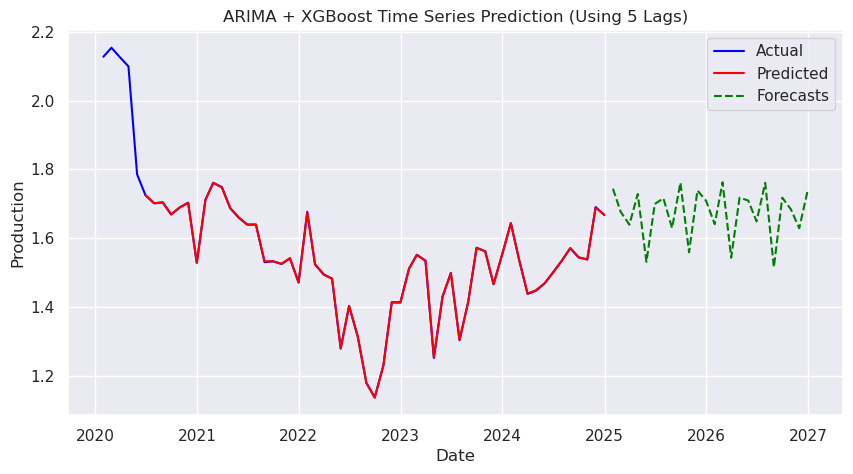

In [218]:
hbm.plot()

In [219]:
hbm.forecast_df

,ARIMA Forecast (MMbbls/day),XGBoost Prediction (MMbbls/day),Hybrid Forecast (MMbbls/day),Hybrid Forecast (bbls)
2025-01-31,1.66756,0.076184,1.743744,5.405607e+07
2025-02-28,1.66756,0.008773,1.676332,4.693731e+07
2025-03-31,1.66756,-0.028243,1.639317,5.081884e+07
2025-04-30,1.66756,0.060899,1.728459,5.185378e+07
2025-05-31,1.66756,-0.136478,1.531081,4.746352e+07
2025-06-30,1.66756,0.031901,1.699460,5.098381e+07
2025-07-31,1.66756,0.048301,1.715861,5.319168e+07
2025-08-31,1.66756,-0.038234,1.629326,5.050910e+07
2025-09-30,1.66756,0.094164,1.761724,5.285172e+07
2025-10-31,1.66756,-0.108465,1.559094,4.833193e+07


In [220]:
def multi_lag_forecast(ts, lag_values, n_steps=12, p=0, d=0, q=0, is_gas=False):
    
    xgb_lag_results = []
    
    for n_lags in lag_values:
        model = HybridModel(ts, n_lags, n_steps, p, d, q)
        model.train()
        model.predict()
        model.forecast(is_gas)
        
        #get the Current lag XGBoost Forcast
        xgb_forcast = model.forecast_df.iloc[:, 1]
        xgb_forcast.name = f"XGBoost Prediction ({n_lags} Lags)"
        xgb_lag_results.append(xgb_forcast)

    arima_forecast = model.forecast_df.iloc[:, 0]
    xgb_agg = pd.concat(xgb_lag_results, axis=1).mean(axis=1)
    xgb_agg.name = "XGBoost Aggregated Prediction"
    final_forecast_df = pd.concat([arima_forecast] + xgb_lag_results + [xgb_agg], axis=1)

    if not is_gas:
        final_forecast_df["Hybrid Forecast (MMbbls/day)"] = arima_forecast + xgb_agg
        final_forecast_df["Hybrid Forecast (bbls)"] = final_forecast_df["Hybrid Forecast (MMbbls/day)"] * 1e6 * final_forecast_df.index.day
    else:
        final_forecast_df["Hybrid Forecast (BCF/day)"] = arima_forecast + xgb_agg
        final_forecast_df["Hybrid Forecast (MMSCF)"] = final_forecast_df["Hybrid Forecast (BCF/day)"] * 1e3 * final_forecast_df.index.day
    
    return final_forecast_df


Different patterns and dependencies may emerge at varying time intervals. To address this, the `multi_lag_forecast` function takes a more comprehensive approach by incorporating multiple lag values into the predictive model. Instead of using just one lag to inform the forecast, this method evaluates several lag structures and aggregates their predictions, resulting in a more refined and robust final output.

By considering multiple lags, we reduce the risk of the model becoming overly reliant on a single time frame and instead allow it to learn from a broader range of historical data points.


In [221]:
# using 12, 18, and 24 momths past errors 
multi_lag_forecast(ts_hc, lag_values=[12, 18, 24], n_steps=12, d = 1)

,ARIMA Forecast (MMbbls/day),XGBoost Prediction (12 Lags),XGBoost Prediction (18 Lags),XGBoost Prediction (24 Lags),XGBoost Aggregated Prediction,Hybrid Forecast (MMbbls/day),Hybrid Forecast (bbls)
2025-01-31,1.66756,0.003584,0.079455,-0.027118,0.018640,1.686200,5.227221e+07
2025-02-28,1.66756,-0.033039,-0.016192,0.036302,-0.004310,1.663250,4.657100e+07
2025-03-31,1.66756,-0.026194,0.013641,0.107917,0.031788,1.699348,5.267978e+07
2025-04-30,1.66756,-0.005441,0.060367,-0.013966,0.013653,1.681213,5.043640e+07
2025-05-31,1.66756,0.026441,-0.044380,-0.001027,-0.006322,1.661238,5.149837e+07
2025-06-30,1.66756,-0.065300,0.046786,-0.021862,-0.013459,1.654101,4.962304e+07
2025-07-31,1.66756,-0.004162,0.031602,0.127198,0.051546,1.719106,5.329228e+07
2025-08-31,1.66756,-0.007113,-0.031008,0.037572,-0.000183,1.667377,5.168868e+07
2025-09-30,1.66756,-0.014496,0.081648,0.005668,0.024273,1.691833,5.075500e+07
2025-10-31,1.66756,-0.041608,-0.059552,0.116602,0.005147,1.672707,5.185393e+07


As of the time of writing, only the January and February production data for the year 2025 are available, allowing for a preliminary evaluation of the forecast model. Using lag values of 12 months, 18 months, and 24 months, the model predicted the next 12 months of production. The January forecast underestimated production by 51,000 barrels per day, while the February forecast had a smaller error of just 9,000 barrels per day. This indicates a relative error of only 0.54% in February. Further validation will be done as more data becomes available, but for now it seems the model is doing well.

Choosing the right number of lags requires experimenting, balancing, and careful consideration of the data structure. The selection process involves analyzing the training data to understand how past values influence the present. Rather than arbitrarily choosing lag values, I examine the data trends and determine how far back I need to go by visually inspecting the patterns and relationships in the training set. This approach ensures that the chosen lags capture meaningful dependencies while avoiding excessive noise from outdated information.

## Gas Production Forecasting

### Associated Gas

In [222]:
ag_avg = gas_df.set_index('Date')['AG PRODUCTION Daily Avg (BCF/d)']
ag_avg.head()

Date
2021-01-31    3.787592
2021-02-28    4.242367
2021-03-31    4.143589
2021-04-30    4.132253
2021-05-31    4.001045
Name: AG PRODUCTION Daily Avg (BCF/d), dtype: float64

#### ARIMA

In [223]:
# Ensure the data is sorted and index (timestamps) is a datetime object properly formatted
ts_ag = ag_avg.sort_index().asfreq('M')

# Check stationarity using Augmented Dickey-Fuller (ADF) Test
def adf_test(series):
    result = adfuller(series)
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] <= 0.05:
        print("The time series is stationary.")
    else:
        print("The time series is NOT stationary. Differencing is required.")

adf_test(ts_ag)


ADF Statistic: -4.754825410290334
p-value: 6.630644868150888e-05
The time series is stationary.


In [224]:
# Fit Auto ARIMA model
auto_model_ag = auto_arima(ts_ag, seasonal=False, trace=True)

# Print best order
print(auto_model_ag.order)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=271.366, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=214.905, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9.218, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=22.036, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-2.515, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-4.459, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-0.115, Time=0.03 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=-2.523, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-3.989, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-0.750, Time=0.25 sec

Best model

In [225]:
## Fit ARIMA model 
p, d, q = 0, 0, 1 # tuning parameters
arima_ag = ARIMA(ts_ag, order=(p, d, q))
arima_ag_fit = arima_ag.fit()

# Print model summary
print(arima_ag_fit.summary())


                                      SARIMAX Results                                      
Dep. Variable:     AG PRODUCTION Daily Avg (BCF/d)   No. Observations:                   48
Model:                              ARIMA(0, 0, 1)   Log Likelihood                   5.229
Date:                             Sat, 22 Mar 2025   AIC                             -4.459
Time:                                     09:44:28   BIC                              1.155
Sample:                                 01-31-2021   HQIC                            -2.337
                                      - 12-31-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.9927      0.043     93.549      0.000       3.909       4.076
ma.L1          0.3662      

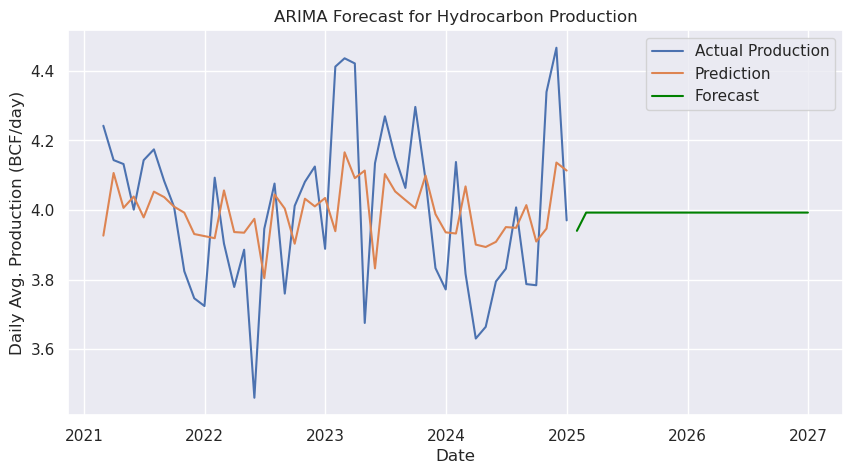

In [226]:
# Forecast the next 12 months
forecast_steps = 24  # Number of months to predict
forecast_ag = arima_ag_fit.forecast(steps=forecast_steps)

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_ag[1:], label="Actual Production")
plt.plot(arima_ag_fit.fittedvalues[1:], label="Prediction")
plt.plot(pd.date_range(start=ts_ag.index[-1], periods=forecast_steps+1, freq='M')[1:], forecast_ag, color='green', label="Forecast")
plt.title("ARIMA Forecast for Hydrocarbon Production")
plt.xlabel("Date")
plt.ylabel("Daily Avg. Production (BCF/day)")
plt.legend()
plt.show()


#### XGBoost

In [227]:
lags = 6
lagged_ts_ag = create_lagged_features(ts_ag, lags)

# Define features (X) and target (y)
X = lagged_ts_ag.drop(columns=['residual'])
y = lagged_ts_ag['residual']


In [228]:
# Use the first 80% for training, last 20% for testing
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]


In [229]:
# Initialize XGBoost Regressor
xgb_ag = xgb.XGBRegressor(objective='reg:squarederror')

# Train the model
xgb_ag.fit(X_train, y_train)

# Predict on test data
y_pred = xgb_ag.predict(X_test)

# Compute RMSE (Root Mean Squared Error)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse:.3f}")



RMSE: 0.265


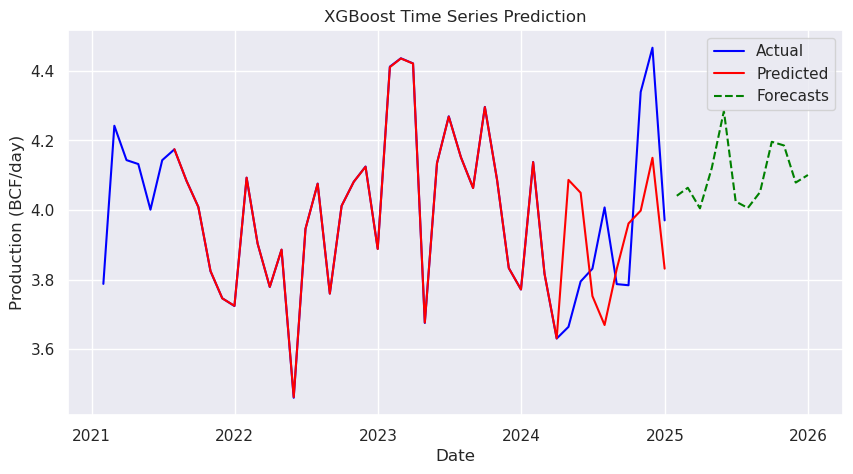

In [230]:
# Predict the entire dataset
xgb_ag_pred = xgb_ag.predict(X)
xgb_ag_pred = pd.Series(xgb_ag_pred, index=X.index)

# Forecast the next (n-steps) values based on the last (n_lags) observations
n_steps = 12
n_lags = xgb_ag.get_booster().num_features()
xgb_ag_forecasts = []


# Generate future dates starting from the last timestamp in ts_ag
forecast_dates = pd.date_range(start=ts_ag.index[-1], periods=n_steps + 1, freq="M")[1:]
ts_ag_copy = ts_ag.copy().values.flatten()

for _ in range(n_steps):
    last_obs = ts_ag_copy[-n_lags:].reshape(1, -1)
    xgb_ag_forecast = xgb_ag.predict(last_obs)[0]  # Extract scalar value
    xgb_ag_forecasts.append(xgb_ag_forecast)
    
    # Append forecasted value to the series for iterative prediction
    ts_ag_copy = np.append(ts_ag_copy, xgb_ag_forecast)

# Convert forecasts list to pandas Series with datetime index
xgb_ag_forecasts = pd.DataFrame({'Forecast (BCF/day)':xgb_ag_forecasts}, index=forecast_dates)
xgb_ag_forecasts['Forecast (MMScf)'] = xgb_ag_forecasts['Forecast (BCF/day)'] * 1000 * xgb_ag_forecasts.index.day

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_ag, label="Actual", color="blue")
plt.plot(xgb_ag_pred, label="Predicted", color="red")
plt.plot(xgb_ag_forecasts['Forecast (BCF/day)'], label="Forecasts", color="green", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Production (BCF/day)")
plt.title("XGBoost Time Series Prediction")
plt.legend()
plt.show()


In [231]:
xgb_ag_forecasts

,Forecast (BCF/day),Forecast (MMScf)
2025-01-31,4.040937,125269.047363
2025-02-28,4.064010,113792.273438
2025-03-31,4.004911,124152.252686
2025-04-30,4.120399,123611.953125
2025-05-31,4.284740,132826.932129
2025-06-30,4.024622,120738.676758
2025-07-31,4.005955,124184.599854
2025-08-31,4.051434,125594.441406
2025-09-30,4.196268,125888.027344
2025-10-31,4.185683,129756.176270


#### ARIMA + XGBoost

In [232]:
hbm_ag = HybridModel(ts_ag, n_lags=12, n_steps=12, q = 1,)
hbm_ag.train()
hbm_ag.predict()
hbm_ag.forecast(is_gas=True)

In [233]:
hbm_ag.forecast_df

,ARIMA Forecast (BCF/day),XGBoost Prediction (BCF/day),Hybrid Forecast (BCF/day),Hybrid Forecast (MMSCF)
2025-01-31,3.940177,-0.131357,3.808820,118073.430848
2025-02-28,3.992657,0.003471,3.996128,111891.573660
2025-03-31,3.992657,0.004851,3.997508,123922.743605
2025-04-30,3.992657,0.202648,4.195304,125859.133368
2025-05-31,3.992657,-0.086114,3.906543,121102.825416
2025-06-30,3.992657,-0.172276,3.820380,114611.413693
2025-07-31,3.992657,-0.108706,3.883950,120402.464618
2025-08-31,3.992657,0.070896,4.063553,125970.136923
2025-09-30,3.992657,-0.047324,3.945333,118359.985193
2025-10-31,3.992657,-0.152260,3.840397,119052.291987


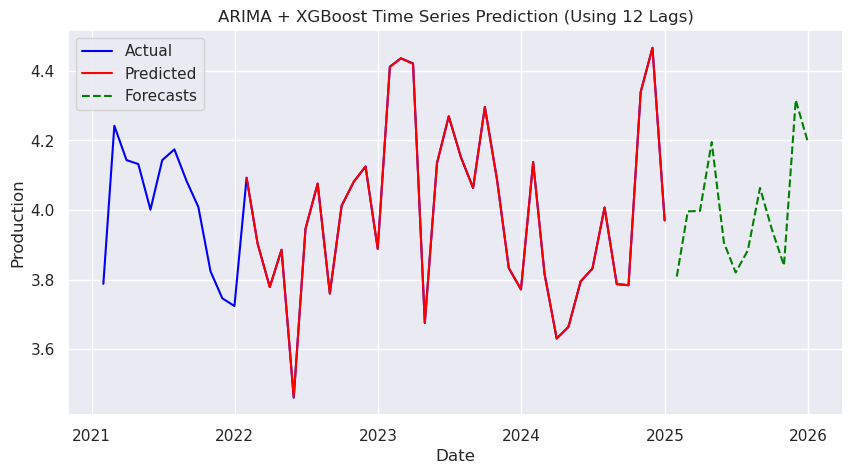

In [234]:
hbm_ag.plot()

In [235]:
multi_lag_forecast(ts_ag, lag_values=[12, 18, 24], n_steps=12, q = 1, is_gas=True)

,ARIMA Forecast (BCF/day),XGBoost Prediction (12 Lags),XGBoost Prediction (18 Lags),XGBoost Prediction (24 Lags),XGBoost Aggregated Prediction,Hybrid Forecast (BCF/day),Hybrid Forecast (MMSCF)
2025-01-31,3.940177,-0.131357,0.077998,-0.016819,-0.023393,3.916784,121420.312819
2025-02-28,3.992657,0.003471,0.005820,0.194496,0.067929,4.060586,113696.405223
2025-03-31,3.992657,0.004851,-0.130522,0.279619,0.051316,4.043973,125363.164109
2025-04-30,3.992657,0.202648,0.229059,0.181523,0.204410,4.197067,125912.002837
2025-05-31,3.992657,-0.086114,-0.030226,0.042028,-0.024771,3.967886,123004.470348
2025-06-30,3.992657,-0.172276,-0.088689,0.304520,0.014518,4.007175,120215.258356
2025-07-31,3.992657,-0.108706,-0.156844,0.112101,-0.051150,3.941507,122186.717120
2025-08-31,3.992657,0.070896,-0.075140,-0.179659,-0.061301,3.931356,121872.028419
2025-09-30,3.992657,-0.047324,-0.085401,-0.020361,-0.051029,3.941628,118248.845739
2025-10-31,3.992657,-0.152260,0.136877,0.312204,0.098940,4.091597,126839.509477


### Non-Associated Gas

In [236]:
gas_df.head()

,Date,AG PRODUCTION (MMSCF),NAG PRODUCTION (MMSCF),TOTAL GAS PRODUCTION (MMSCF),FIELD USE (MMSCF),DOMESTIC SALES (MMSCF),EXPORT SALES (MMSCF),TOTAL GAS UTILISED (MMSCF),% UTILIZED,TOTAL GAS FLARED (MMSCF),% FLARED,GAS SHRINKAGE,Year,Month,Month_name,month_days,AG PRODUCTION (BCF),NAG PRODUCTION (BCF),TOTAL GAS PRODUCTION (BCF),FIELD USE (BCF),DOMESTIC SALES (BCF),EXPORT SALES (BCF),TOTAL GAS UTILISED (BCF),TOTAL GAS FLARED (BCF),AG PRODUCTION Daily Avg (BCF/d),NAG PRODUCTION Daily Avg (BCF/d),TOTAL GAS PRODUCTION Daily Avg (BCF/d),FIELD USE Daily Avg (BCF/d),DOMESTIC SALES Daily Avg (BCF/d),EXPORT SALES Daily Avg (BCF/d),TOTAL GAS UTILISED Daily Avg (BCF/d),TOTAL GAS FLARED Daily Avg (BCF/d)
0,2021-01-31,117415.351483,119293.772252,236709.123735,57491.301073,49124.812422,107380.744939,213996.858434,0.904050,21342.160590,0.090162,1370.104710,2021,1,January,31,117.415351,119.293772,236.709124,57.491301,49.124812,107.380745,213.996858,21.342161,3.787592,3.848186,7.635778,1.854558,1.584671,3.463895,6.903124,0.688457
1,2021-02-28,118786.275000,105401.811758,224188.086757,60885.101038,44977.983573,96108.681503,201971.766114,0.900903,20685.970733,0.092271,1530.349910,2021,2,February,28,118.786275,105.401812,224.188087,60.885101,44.977984,96.108682,201.971766,20.685971,4.242367,3.764350,8.006717,2.174468,1.606357,3.432453,7.213277,0.738785
2,2021-03-31,128451.249602,106967.392469,235418.642071,64670.271853,45245.659311,98775.574834,208691.505998,0.886470,25645.668657,0.108936,1081.467416,2021,3,March,31,128.451250,106.967392,235.418642,64.670272,45.245659,98.775575,208.691506,25.645669,4.143589,3.450561,7.594150,2.086138,1.459537,3.186309,6.731984,0.827280
3,2021-04-30,123967.579648,99424.777040,223392.356689,64254.202177,45506.069849,90182.458587,199942.730614,0.895029,22583.513625,0.101093,866.112450,2021,4,April,30,123.967580,99.424777,223.392357,64.254202,45.506070,90.182459,199.942731,22.583514,4.132253,3.314159,7.446412,2.141807,1.516869,3.006082,6.664758,0.752784
4,2021-05-31,124032.387720,109774.574929,233806.962649,65681.385887,54797.287690,90131.330393,210610.003971,0.900786,22256.452752,0.095192,940.505926,2021,5,May,31,124.032388,109.774575,233.806963,65.681386,54.797288,90.131330,210.610004,22.256453,4.001045,3.541115,7.542160,2.118754,1.767654,2.907462,6.793871,0.717950


In [237]:
nag_avg = gas_df.set_index('Date')['NAG PRODUCTION Daily Avg (BCF/d)']
nag_avg.head()

Date
2021-01-31    3.848186
2021-02-28    3.764350
2021-03-31    3.450561
2021-04-30    3.314159
2021-05-31    3.541115
Name: NAG PRODUCTION Daily Avg (BCF/d), dtype: float64

#### ARIMA

In [238]:
# Ensure the data is sorted and index (timestamps) is a datetime object properly formatted
ts_nag = nag_avg.sort_index().asfreq('M')

# Check stationarity using Augmented Dickey-Fuller (ADF) Test
def adf_test(series):
    result = adfuller(series)
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    if result[1] <= 0.05:
        print("The time series is stationary.")
    else:
        print("The time series is NOT stationary. Differencing is required.")

adf_test(ts_nag)


ADF Statistic: -2.4604255360083642
p-value: 0.1254024643681515
The time series is NOT stationary. Differencing is required.


In [239]:
# Fit Auto ARIMA model
auto_model_nag = auto_arima(ts_nag, seasonal=False, trace=True)

# Print best order
print(auto_model_nag.order)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=6.677, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2.475, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4.229, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=4.136, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=0.760, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.770 seconds
(0, 1, 0)


In [240]:
## Fit ARIMA model 
p, d, q = 0, 1, 0 # tuning parameters
arima_nag = ARIMA(ts_nag, order=(p, d, q))
arima_nag_fit = arima_nag.fit()

# Print model summary
print(arima_nag_fit.summary())


                                      SARIMAX Results                                       
Dep. Variable:     NAG PRODUCTION Daily Avg (BCF/d)   No. Observations:                   48
Model:                               ARIMA(0, 1, 0)   Log Likelihood                   0.620
Date:                              Sat, 22 Mar 2025   AIC                              0.760
Time:                                      09:44:32   BIC                              2.610
Sample:                                  01-31-2021   HQIC                             1.456
                                       - 12-31-2024                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0570      0.012      4.943      0.000       0.034       0.080
Ljung-Box (L1) (Q):

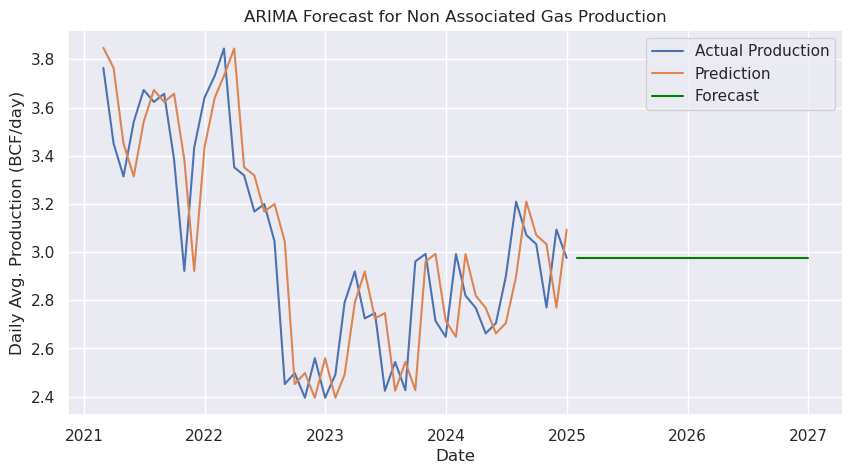

In [241]:
# Forecast the next 12 months
forecast_steps = 24  # Number of months to predict
forecast_nag = arima_nag_fit.forecast(steps=forecast_steps)

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_nag[1:], label="Actual Production")
plt.plot(arima_nag_fit.fittedvalues[1:], label="Prediction")
plt.plot(pd.date_range(start=ts_nag.index[-1], periods=forecast_steps+1, freq='M')[1:], forecast_nag, color='green', label="Forecast")
plt.title("ARIMA Forecast for Non Associated Gas Production")
plt.xlabel("Date")
plt.ylabel("Daily Avg. Production (BCF/day)")
plt.legend()
plt.show()


#### XGBoost

In [242]:
lags = 6
lagged_ts_nag = create_lagged_features(ts_nag, lags)

# Define features (X) and target (y)
X = lagged_ts_nag.drop(columns=['residual'])
y = lagged_ts_nag['residual']


In [243]:
# Use the first 80% for training, last 20% for testing
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]


In [244]:
# Initialize XGBoost Regressor
xgb_nag = xgb.XGBRegressor(objective='reg:squarederror')

# Train the model
xgb_nag.fit(X_train, y_train)

# Predict on test data
y_pred = xgb_nag.predict(X_test)

# Compute RMSE (Root Mean Squared Error)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse:.3f}")



RMSE: 0.290


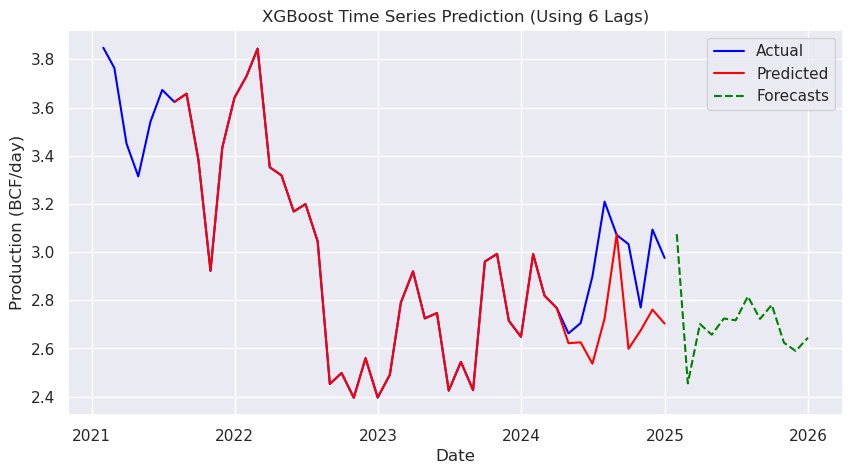

In [245]:
# Predict the entire dataset
xgb_nag_pred = xgb_nag.predict(X)
xgb_nag_pred = pd.Series(xgb_nag_pred, index=X.index)

# Forecast the next (n-steps) values based on the last (n_lags) observations
n_steps = 12
n_lags = xgb_nag.get_booster().num_features()
xgb_nag_forecasts = []


# Generate future dates starting from the last timestamp in ts_nag
forecast_dates = pd.date_range(start=ts_nag.index[-1], periods=n_steps + 1, freq="M")[1:]
ts_nag_copy = ts_nag.copy().values.flatten()

for _ in range(n_steps):
    last_obs = ts_nag_copy[-n_lags:].reshape(1, -1)
    xgb_nag_forecast = xgb_nag.predict(last_obs)[0]  # Extract scalar value
    xgb_nag_forecasts.append(xgb_nag_forecast)
    
    # Append forecasted value to the series for iterative prediction
    ts_nag_copy = np.append(ts_nag_copy, xgb_nag_forecast)

# Convert forecasts list to pandas Series with datetime index
xgb_nag_forecasts = pd.DataFrame({'Forecast (BCF/day)':xgb_nag_forecasts}, index=forecast_dates)
xgb_nag_forecasts['Forecast (MMScf)'] = xgb_nag_forecasts['Forecast (BCF/day)'] * 1000 * xgb_nag_forecasts.index.day

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(ts_nag, label="Actual", color="blue")
plt.plot(xgb_nag_pred, label="Predicted", color="red")
plt.plot(xgb_nag_forecasts['Forecast (BCF/day)'], label="Forecasts", color="green", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Production (BCF/day)")
plt.title(f"XGBoost Time Series Prediction (Using {n_lags} Lags)")
plt.legend()
plt.show()


In [246]:
xgb_nag_forecasts

,Forecast (BCF/day),Forecast (MMScf)
2025-01-31,3.074249,95301.712158
2025-02-28,2.455048,68741.339844
2025-03-31,2.701323,83740.997803
2025-04-30,2.656846,79705.363770
2025-05-31,2.724168,84449.207031
2025-06-30,2.716845,81505.341797
2025-07-31,2.815883,87292.367188
2025-08-31,2.722406,84394.593750
2025-09-30,2.780782,83423.474121
2025-10-31,2.623702,81334.759033


#### ARIMA + XGBoost

In [247]:
hbm_nag = HybridModel(ts_nag, n_lags=12, n_steps=12, d=1)
hbm_nag.train()
hbm_nag.predict()
hbm_nag.forecast(is_gas=True)

In [248]:
hbm_nag.forecast_df

,ARIMA Forecast (BCF/day),XGBoost Prediction (BCF/day),Hybrid Forecast (BCF/day),Hybrid Forecast (MMSCF)
2025-01-31,2.97569,-0.127562,2.848128,88291.968132
2025-02-28,2.97569,0.252701,3.228392,90394.973591
2025-03-31,2.97569,-0.236661,2.739029,84909.897263
2025-04-30,2.97569,0.026349,3.002039,90061.168622
2025-05-31,2.97569,-0.101498,2.874192,89099.962326
2025-06-30,2.97569,0.054638,3.030328,90909.852300
2025-07-31,2.97569,0.043240,3.018930,93586.839283
2025-08-31,2.97569,0.042039,3.017730,93549.619368
2025-09-30,2.97569,0.152413,3.128103,93843.100321
2025-10-31,2.97569,-0.005895,2.969795,92063.651801


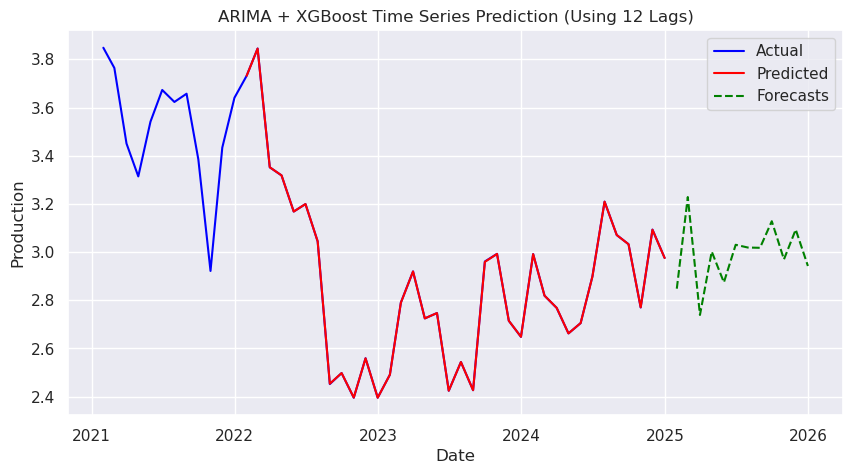

In [249]:
hbm_nag.plot()

In [250]:
multi_lag_forecast(ts_nag, lag_values=[3, 18], n_steps=12, d=1, is_gas=True)

,ARIMA Forecast (BCF/day),XGBoost Prediction (3 Lags),XGBoost Prediction (18 Lags),XGBoost Aggregated Prediction,Hybrid Forecast (BCF/day),Hybrid Forecast (MMSCF)
2025-01-31,2.97569,0.033037,-0.142511,-0.054737,2.920953,90549.549705
2025-02-28,2.97569,0.113326,-0.045630,0.033848,3.009539,84267.080709
2025-03-31,2.97569,-0.327705,-0.054865,-0.191285,2.784406,86316.573674
2025-04-30,2.97569,0.108400,-0.023113,0.042644,3.018334,90550.019432
2025-05-31,2.97569,0.170368,-0.181553,-0.005593,2.970098,92073.033678
2025-06-30,2.97569,-0.011167,-0.208246,-0.109706,2.865984,85979.519513
2025-07-31,2.97569,-0.074208,-0.160525,-0.117367,2.858324,88608.039523
2025-08-31,2.97569,0.012250,0.294578,0.153414,3.129104,97002.230520
2025-09-30,2.97569,-0.212881,0.008790,-0.102045,2.873645,86209.358227
2025-10-31,2.97569,-0.049085,-0.013979,-0.031532,2.944158,91268.906119


In [251]:
weights = np.linspace(1, 0.3, 4 )  # Linearly decreasing weights
weights /= weights.sum()   # Normalize to sum to 1
weights

array([0.38461538, 0.29487179, 0.20512821, 0.11538462])

In [252]:
import numpy as np

def weighted_multi_lag_forecast(ts, lag_values, n_steps=12, p=0, d=0, q=0, is_gas=False):
    xgb_lag_results = []
    
    # Sort lags in ascending order
    lag_values = sorted(lag_values)
    
    # Generate weights: more recent lags get higher weights
    weights = np.linspace(1, 0.3, len(lag_values))  # Linearly decreasing weights
    weights /= weights.sum()  # Normalize to sum to 1
    
    for i, n_lags in enumerate(lag_values):
        model = HybridModel(ts, n_lags, n_steps, p, d, q)
        model.train()
        model.predict()
        model.forecast(is_gas)
        
        # Get the current lag XGBoost forecast
        xgb_forecast = model.forecast_df.iloc[:, 1]
        xgb_forecast.name = f"XGBoost Prediction ({n_lags})"
        
        # Multiply forecast by its corresponding weight
        xgb_forecast *= weights[i]
        
        xgb_lag_results.append(xgb_forecast)
    
    arima_forecast = model.forecast_df.iloc[:, 0]
    
    # Weighted sum instead of simple mean
    xgb_weighted_agg = pd.concat(xgb_lag_results, axis=1).sum(axis=1)
    xgb_weighted_agg.name = "XGBoost Weighted Aggregated Prediction"
    
    final_forecast_df = pd.concat([arima_forecast] + xgb_lag_results + [xgb_weighted_agg], axis=1)
    
    if not is_gas:
        final_forecast_df["Hybrid Forecast (MMbbls/day)"] = arima_forecast + xgb_weighted_agg
        final_forecast_df["Hybrid Forecast (bbls)"] = final_forecast_df["Hybrid Forecast (MMbbls/day)"] * 1e6 * final_forecast_df.index.day
    else:
        final_forecast_df["Hybrid Forecast (BCF/day)"] = arima_forecast + xgb_weighted_agg
        final_forecast_df["Hybrid Forecast (MMSCF)"] = final_forecast_df["Hybrid Forecast (BCF/day)"] * 1e3 * final_forecast_df.index.day
    
    return final_forecast_df


The forecasting of Non-Arrested Gas (NAG) has been challenging due to structural breaks in the time series. The data initially exhibited high values in 2022 before experiencing a sharp decline, forming a base, and gradually rising again. Despite this recovery, recent values are still below half of the previous peak.  

In previous forecasts, using fixed lags without weighting led to inconsistencies, as older lag values contributed equally despite the structural changes in the data. The first forecast was lower than the actual, while the second forecast was slightly higher. Specifically:  

- **January Actual:** 110,000 MMSCF | **Forecast:** 91,000 MMSCF  
- **February Actual:** 83,000 MMSCF | **Forecast:** 84,000 MMSCF  

To improve forecast accuracy, we introduced a **weighted lag approach**, where more recent lag values contribute more significantly than older ones. The idea is to sort the selected lag values and assign weights between **0 and 1**, giving higher importance to recent trends. This ensures that the model adapts better to the structural changes in the data rather than being overly influenced by past lower values.  

While this adjustment led to a slight improvement in forecasts, raising the predicted values closer to the actuals, the challenge remains due to the structural break in the time series. Further refinements may be needed to better capture the trend shifts.  


In [253]:
weighted_multi_lag_forecast(ts_nag, lag_values=[3, 18,], n_steps=12, d=1, is_gas=True)

,ARIMA Forecast (BCF/day),XGBoost Prediction (3),XGBoost Prediction (18),XGBoost Weighted Aggregated Prediction,Hybrid Forecast (BCF/day),Hybrid Forecast (MMSCF)
2025-01-31,2.97569,0.025413,-0.032887,-0.007474,2.968216,92014.699303
2025-02-28,2.97569,0.087174,-0.010530,0.076644,3.052334,85465.365812
2025-03-31,2.97569,-0.252081,-0.012661,-0.264742,2.710949,84039.409826
2025-04-30,2.97569,0.083385,-0.005334,0.078051,3.053741,91612.238687
2025-05-31,2.97569,0.131052,-0.041897,0.089155,3.064846,95010.220455
2025-06-30,2.97569,-0.008590,-0.048057,-0.056647,2.919044,87571.305398
2025-07-31,2.97569,-0.057083,-0.037044,-0.094128,2.881563,89328.448573
2025-08-31,2.97569,0.009423,0.067979,0.077402,3.053093,94645.877445
2025-09-30,2.97569,-0.163754,0.002029,-0.161726,2.813965,84418.939900
2025-10-31,2.97569,-0.037758,-0.003226,-0.040984,2.934707,90975.903927


**To-Do:**  

The next step is to wait until we have about 6 to 12 months of new data. Once we have this additional data, we will retrain our model to incorporate recent trends and improve forecasting accuracy. This will help us assess how well the model adapts to changing conditions and refine it further if needed. Once retrained and refined, we will use it to forecast data for the next year.